In [1]:
from google.colab import drive

In [2]:
!pip install innvestigate

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 1.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 489.9/489.9 MB 1.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 52.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 440.7/440.7 kB 28.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 39.7 MB/s eta 0:00:00
  Attempting uninstall: tensorflow-estimator
    Found existing installation: tensorflow-estimator 2.15.0
    Uninstalling tensorflow-estimator-2.15.0:
      Successfully uninstalled tensorflow-estimator-2.15.0
  Attempting uninstall: keras
    Found existing installation: keras 2.15.0
    Uninstalling keras-2.15.0:
      Successfully uninstalled keras-2.15.0
  Attempting uninstall: google-auth-oauthlib
    Found existing installation: google-auth-oauthlib 1.2.0
    Uninstalling google-auth-oauthlib-1.2.0:
      Successfully uninstalled google-auth-oauthlib-1.2.0
  Attempting uninstall: ten

In [3]:
!pip install deeplift

  Preparing metadata (setup.py) ... done
  Created wheel for deeplift: filename=deeplift-0.6.13.0-py3-none-any.whl size=36425 sha256=a5470e81dbeacdc6e8f8e6cb2364cd9dce3d0d8f62bb6218d1699492b035dff9
  Stored in directory: /root/.cache/pip/wheels/5d/d0/62/3f2d52f229601a9107ad95750d9b403c66063756100d374b6f
Successfully built deeplift


In [4]:
!pip install alibi-detect

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 381.5/381.5 kB 5.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 13.5 MB/s eta 0:00:00


In [5]:
!pip install tensorflow

In [6]:
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 3.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283835 sha256=372761e2cb9baa71209e001b976403c0cbdec4507f7319c76a96d407b105f7e9
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [7]:
!pip install keras-vis

In [8]:
!pip install shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 538.2/538.2 kB 4.6 MB/s eta 0:00:00


In [9]:
!pip install imbalanced-learn

In [10]:
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [11]:
import tensorflow as tf
import shap
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import confusion_matrix
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report, ConfusionMatrixDisplay
import lime
import torch
from keras.layers import Dense, SimpleRNN
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
import lime.lime_tabular
from lime import lime_tabular
from sklearn.neural_network import MLPClassifier
from lime.lime_tabular import LimeTabularExplainer
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
import innvestigate
from innvestigate import create_analyzer
from sklearn.ensemble import RandomForestClassifier
from google.colab import files
from imblearn.over_sampling import SMOTE
from collections import Counter
from imblearn.under_sampling import NearMiss

## **LOADING THE DATASET**

In [12]:
dataset=pd.read_csv('/content/drive/MyDrive/ML DATASETS/VMResourceUtilizationSlope.csv')
dataset


,LAST_POLL,VMID,UUID,dom,rxbytes_slope,rxpackets_slope,rxerrors_slope,rxdrops_slope,txbytes_slope,txpackets_slope,...,vdard_bytes_slope,vdawr_reqs_slope,vdawr_bytes_slope,vdaerror_slope,hdard_req_slope,hdard_bytes_slope,hdawr_reqs_slope,hdawr_bytes_slope,hdaerror_slope,Status
0,1604455173,7,"""2bc1fde1-28d9-454e-8029-21a138714234""",one-33,88.2065,30.1414,0.0,0.0,79.8981,5.5275,...,0.0,24.3045,89.9850,0.0,0.0,0.0,0.0,0.0,0.0,Normal
1,1604455142,7,"""2bc1fde1-28d9-454e-8029-21a138714234""",one-33,87.8708,27.3499,0.0,0.0,0.0000,0.0000,...,0.0,5.9061,89.8986,0.0,0.0,0.0,0.0,0.0,0.0,Normal
2,1604455113,7,"""2bc1fde1-28d9-454e-8029-21a138714234""",one-33,87.8865,27.2996,0.0,0.0,0.0000,0.0000,...,0.0,32.8285,89.9897,0.0,0.0,0.0,0.0,0.0,0.0,Normal
3,1604455082,7,"""2bc1fde1-28d9-454e-8029-21a138714234""",one-33,87.8760,27.4076,0.0,0.0,0.0000,0.0000,...,0.0,4.2364,89.8741,0.0,0.0,0.0,0.0,0.0,0.0,Normal
4,1604455055,7,"""2bc1fde1-28d9-454e-8029-21a138714234""",one-33,87.7241,25.8210,0.0,0.0,0.0000,0.0000,...,0.0,22.7510,89.9864,0.0,0.0,0.0,0.0,0.0,0.0,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9605,1604601182,6,cf1325c0-957a-4744-8912-377f3f477971,one-43,88.7897,30.9638,0.0,0.0,90.0000,89.9974,...,0.0,0.0000,0.0000,0.0,0.0,0.0,0.0,0.0,0.0,Attack
9606,1604601152,6,cf1325c0-957a-4744-8912-377f3f477971,one-43,88.0519,29.5388,0.0,0.0,90.0000,89.9977,...,0.0,0.0000,0.0000,0.0,0.0,0.0,0.0,0.0,0.0,Attack
9607,1604601122,6,cf1325c0-957a-4744-8912-377f3f477971,one-43,89.1474,45.9392,0.0,0.0,90.0000,89.9950,...,0.0,0.0000,0.0000,0.0,0.0,0.0,0.0,0.0,0.0,Attack
9608,1604601092,6,cf1325c0-957a-4744-8912-377f3f477971,one-43,87.7974,26.5651,0.0,0.0,0.0000,0.0000,...,0.0,20.1363,89.9650,0.0,0.0,0.0,0.0,0.0,0.0,Attack


In [13]:
dataset.head()

,LAST_POLL,VMID,UUID,dom,rxbytes_slope,rxpackets_slope,rxerrors_slope,rxdrops_slope,txbytes_slope,txpackets_slope,...,vdard_bytes_slope,vdawr_reqs_slope,vdawr_bytes_slope,vdaerror_slope,hdard_req_slope,hdard_bytes_slope,hdawr_reqs_slope,hdawr_bytes_slope,hdaerror_slope,Status
0,1604455173,7,"""2bc1fde1-28d9-454e-8029-21a138714234""",one-33,88.2065,30.1414,0.0,0.0,79.8981,5.5275,...,0.0,24.3045,89.9850,0.0,0.0,0.0,0.0,0.0,0.0,Normal
1,1604455142,7,"""2bc1fde1-28d9-454e-8029-21a138714234""",one-33,87.8708,27.3499,0.0,0.0,0.0000,0.0000,...,0.0,5.9061,89.8986,0.0,0.0,0.0,0.0,0.0,0.0,Normal
2,1604455113,7,"""2bc1fde1-28d9-454e-8029-21a138714234""",one-33,87.8865,27.2996,0.0,0.0,0.0000,0.0000,...,0.0,32.8285,89.9897,0.0,0.0,0.0,0.0,0.0,0.0,Normal
3,1604455082,7,"""2bc1fde1-28d9-454e-8029-21a138714234""",one-33,87.8760,27.4076,0.0,0.0,0.0000,0.0000,...,0.0,4.2364,89.8741,0.0,0.0,0.0,0.0,0.0,0.0,Normal
4,1604455055,7,"""2bc1fde1-28d9-454e-8029-21a138714234""",one-33,87.7241,25.8210,0.0,0.0,0.0000,0.0000,...,0.0,22.7510,89.9864,0.0,0.0,0.0,0.0,0.0,0.0,Normal


In [14]:
# viewing summary statistics
dataset.describe()

,LAST_POLL,VMID,rxbytes_slope,rxpackets_slope,rxerrors_slope,rxdrops_slope,txbytes_slope,txpackets_slope,txerrors_slope,txdrops_slope,...,vdard_req_slope,vdard_bytes_slope,vdawr_reqs_slope,vdawr_bytes_slope,vdaerror_slope,hdard_req_slope,hdard_bytes_slope,hdawr_reqs_slope,hdawr_bytes_slope,hdaerror_slope
count,9.610000e+03,9610.000000,9594.000000,9594.000000,9594.0,9594.0,9594.000000,9594.000000,9594.0,9594.0,...,9594.000000,9594.000000,9594.000000,9594.000000,9594.0,9594.000000,9594.000000,9594.0,9594.0,9594.0
mean,1.604483e+09,7.547555,88.237795,35.454518,0.0,0.0,31.755948,22.272845,0.0,0.0,...,0.869522,2.360632,31.607359,80.303610,0.0,0.024526,0.056261,0.0,0.0,0.0
std,8.161554e+04,1.734985,0.779002,18.590801,0.0,0.0,41.176777,36.895174,0.0,0.0,...,7.763400,14.373804,27.642737,27.866019,0.0,1.105076,2.249146,0.0,0.0,0.0
min,1.604406e+09,1.000000,58.392500,1.789900,0.0,0.0,0.000000,0.000000,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0
25%,1.604424e+09,6.000000,87.797400,26.565100,0.0,0.0,0.000000,0.000000,0.0,0.0,...,0.000000,0.000000,11.309900,89.963100,0.0,0.000000,0.000000,0.0,0.0,0.0
50%,1.604442e+09,8.000000,87.954600,28.072500,0.0,0.0,0.000000,0.000000,0.0,0.0,...,0.000000,0.000000,18.434900,89.983900,0.0,0.000000,0.000000,0.0,0.0,0.0
75%,1.604589e+09,9.000000,88.264300,30.963800,0.0,0.0,81.275200,23.782000,0.0,0.0,...,0.000000,0.000000,62.650100,89.995100,0.0,0.000000,0.000000,0.0,0.0,0.0
max,1.604636e+09,10.000000,89.999900,89.915700,0.0,0.0,90.000000,89.998200,0.0,0.0,...,89.593000,90.000000,89.083800,90.000000,0.0,64.840700,89.992100,0.0,0.0,0.0


In [ ]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9610 entries, 0 to 9609
Data columns (total 44 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   LAST_POLL                 9610 non-null   int64  
 1   VMID                      9610 non-null   int64  
 2   UUID                      9610 non-null   object 
 3   dom                       9610 non-null   object 
 4   rxbytes_slope             9594 non-null   float64
 5   rxpackets_slope           9594 non-null   float64
 6   rxerrors_slope            9594 non-null   float64
 7   rxdrops_slope             9594 non-null   float64
 8   txbytes_slope             9594 non-null   float64
 9   txpackets_slope           9594 non-null   float64
 10  txerrors_slope            9594 non-null   float64
 11  txdrops_slope             9594 non-null   float64
 12  timecpu_slope             9594 non-null   float64
 13  timesys_slope             9594 non-null   float64
 14  timeusr_

In [15]:
# Detecting if there are missing values in the dataset
dataset.isnull().sum()

LAST_POLL                    0
VMID                         0
UUID                         0
dom                          0
rxbytes_slope               16
rxpackets_slope             16
rxerrors_slope              16
rxdrops_slope               16
txbytes_slope               16
txpackets_slope             16
txerrors_slope              16
txdrops_slope               16
timecpu_slope               16
timesys_slope               16
timeusr_slope               16
state_slope                 16
memmax_slope                16
mem_slope                   16
cpus_slope                  16
cputime_slope               16
memactual_slope             16
memswap_in_slope            16
memswap_out_slope           16
memmajor_fault_slope        16
memminor_fault_slope        16
memunused_slope             16
memavailable_slope          16
memusable_slope             16
memlast_update_slope        16
memdisk_cache_slope         16
memhugetlb_pgalloc_slope    16
memhugetlb_pgfail_slope     16
memrss_s

In [16]:
# Removing missing values from the dataset
dataset= dataset.drop(['UUID','dom'],axis =1)
dataframe = dataset.dropna()

In [17]:
dataframe

,LAST_POLL,VMID,rxbytes_slope,rxpackets_slope,rxerrors_slope,rxdrops_slope,txbytes_slope,txpackets_slope,txerrors_slope,txdrops_slope,...,vdard_bytes_slope,vdawr_reqs_slope,vdawr_bytes_slope,vdaerror_slope,hdard_req_slope,hdard_bytes_slope,hdawr_reqs_slope,hdawr_bytes_slope,hdaerror_slope,Status
0,1604455173,7,88.2065,30.1414,0.0,0.0,79.8981,5.5275,0.0,0.0,...,0.0,24.3045,89.9850,0.0,0.0,0.0,0.0,0.0,0.0,Normal
1,1604455142,7,87.8708,27.3499,0.0,0.0,0.0000,0.0000,0.0,0.0,...,0.0,5.9061,89.8986,0.0,0.0,0.0,0.0,0.0,0.0,Normal
2,1604455113,7,87.8865,27.2996,0.0,0.0,0.0000,0.0000,0.0,0.0,...,0.0,32.8285,89.9897,0.0,0.0,0.0,0.0,0.0,0.0,Normal
3,1604455082,7,87.8760,27.4076,0.0,0.0,0.0000,0.0000,0.0,0.0,...,0.0,4.2364,89.8741,0.0,0.0,0.0,0.0,0.0,0.0,Normal
4,1604455055,7,87.7241,25.8210,0.0,0.0,0.0000,0.0000,0.0,0.0,...,0.0,22.7510,89.9864,0.0,0.0,0.0,0.0,0.0,0.0,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9604,1604601212,6,88.0519,29.5388,0.0,0.0,90.0000,89.9974,0.0,0.0,...,0.0,0.0000,0.0000,0.0,0.0,0.0,0.0,0.0,0.0,Attack
9605,1604601182,6,88.7897,30.9638,0.0,0.0,90.0000,89.9974,0.0,0.0,...,0.0,0.0000,0.0000,0.0,0.0,0.0,0.0,0.0,0.0,Attack
9606,1604601152,6,88.0519,29.5388,0.0,0.0,90.0000,89.9977,0.0,0.0,...,0.0,0.0000,0.0000,0.0,0.0,0.0,0.0,0.0,0.0,Attack
9607,1604601122,6,89.1474,45.9392,0.0,0.0,90.0000,89.9950,0.0,0.0,...,0.0,0.0000,0.0000,0.0,0.0,0.0,0.0,0.0,0.0,Attack


In [18]:
# checking to see of missing values have been removed
dataframe.isnull().sum()

LAST_POLL                   0
VMID                        0
rxbytes_slope               0
rxpackets_slope             0
rxerrors_slope              0
rxdrops_slope               0
txbytes_slope               0
txpackets_slope             0
txerrors_slope              0
txdrops_slope               0
timecpu_slope               0
timesys_slope               0
timeusr_slope               0
state_slope                 0
memmax_slope                0
mem_slope                   0
cpus_slope                  0
cputime_slope               0
memactual_slope             0
memswap_in_slope            0
memswap_out_slope           0
memmajor_fault_slope        0
memminor_fault_slope        0
memunused_slope             0
memavailable_slope          0
memusable_slope             0
memlast_update_slope        0
memdisk_cache_slope         0
memhugetlb_pgalloc_slope    0
memhugetlb_pgfail_slope     0
memrss_slope                0
vdard_req_slope             0
vdard_bytes_slope           0
vdawr_reqs

### **FEATURE ENGINEERING**

In [19]:
 # deleting irrelevant columns in the dataset
dataframe= dataframe.drop(['LAST_POLL','rxerrors_slope','rxdrops_slope','txerrors_slope','txdrops_slope','memmax_slope','mem_slope', 'cpus_slope', 'memactual_slope', 'memswap_in_slope', 'memswap_out_slope','memmajor_fault_slope','memavailable_slope', 'memhugetlb_pgfail_slope','vdaerror_slope', 'vdawr_bytes_slope','vdaerror_slope','memdisk_cache_slope',
       'memhugetlb_pgalloc_slope','hdard_bytes_slope', 'hdawr_reqs_slope','hdawr_bytes_slope',
       'hdaerror_slope'], axis =1)

## **EXPLORATOTY DATA ANALYSIS**

In [20]:
# Distribution of the TARGET variable
dataframe['Status'].value_counts()

Status
Normal    7288
Attack    2306
Name: count, dtype: int64

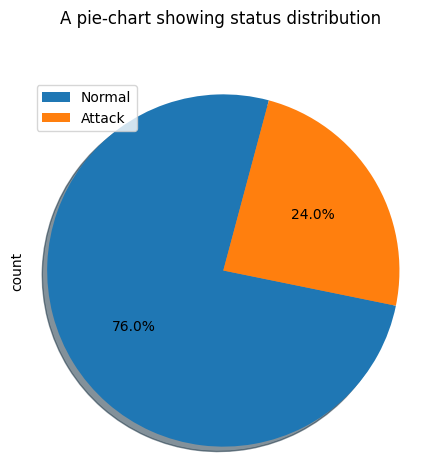

In [21]:
# Distribution of the target variable
labels = 'Normal','Attack'
dataframe['Status'].astype(str).value_counts().plot(kind='pie',
                            figsize=(5, 5),
                            autopct='%1.1f%%',
                            startangle=75,
                            shadow=True,
                            labels=None,
                            )

plt.title('A pie-chart showing status distribution ', y=1.12)
plt.axis('equal')
plt.legend(labels=labels, loc='upper left')
plt.show()

VMID  Status
1     Normal      17
2     Normal      17
3     Normal      16
4     Normal      18
5     Attack    1153
      Normal     362
6     Attack    1153
      Normal      58
7     Normal    1883
8     Normal    1639
9     Normal    1639
10    Normal    1639
Name: count, dtype: int64


<Figure size 1200x400 with 0 Axes>

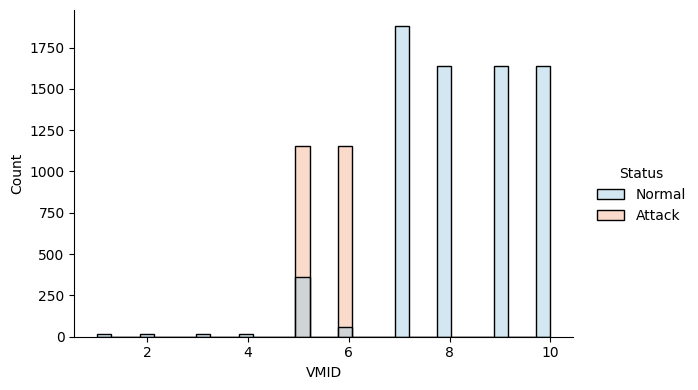

In [22]:
# distribution of the rate of the recieved packets from the network versus status
plt.figure(figsize=(12,4))
groupby_VMID = dataframe.groupby('VMID')['Status']
print(groupby_VMID.value_counts())
sns.displot(data = dataframe, x = 'VMID', hue = 'Status', height=4, aspect=1.5, palette= 'RdBu_r')

<Axes: xlabel='VMID', ylabel='count'>

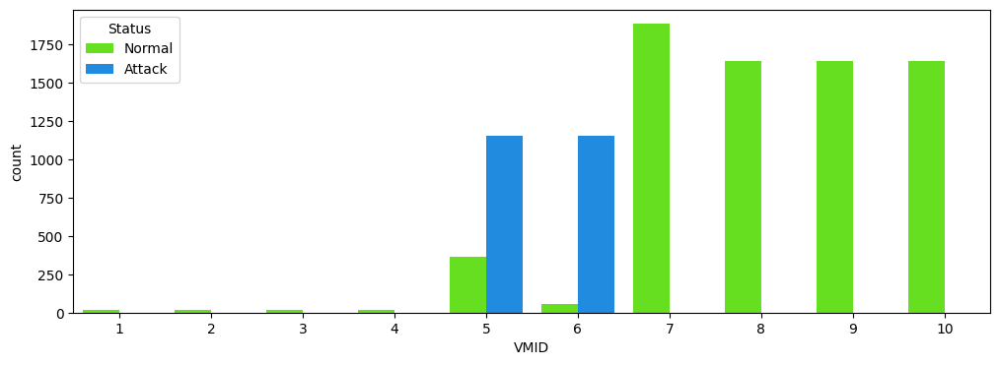

In [23]:
plt.figure(figsize=(12,4))
sns.countplot(x="VMID", hue = "Status",data=dataframe,palette='gist_rainbow')

In [24]:
dataframe.columns

Index(['VMID', 'rxbytes_slope', 'rxpackets_slope', 'txbytes_slope',
       'txpackets_slope', 'timecpu_slope', 'timesys_slope', 'timeusr_slope',
       'state_slope', 'cputime_slope', 'memminor_fault_slope',
       'memunused_slope', 'memusable_slope', 'memlast_update_slope',
       'memrss_slope', 'vdard_req_slope', 'vdard_bytes_slope',
       'vdawr_reqs_slope', 'hdard_req_slope', 'Status'],
      dtype='object')

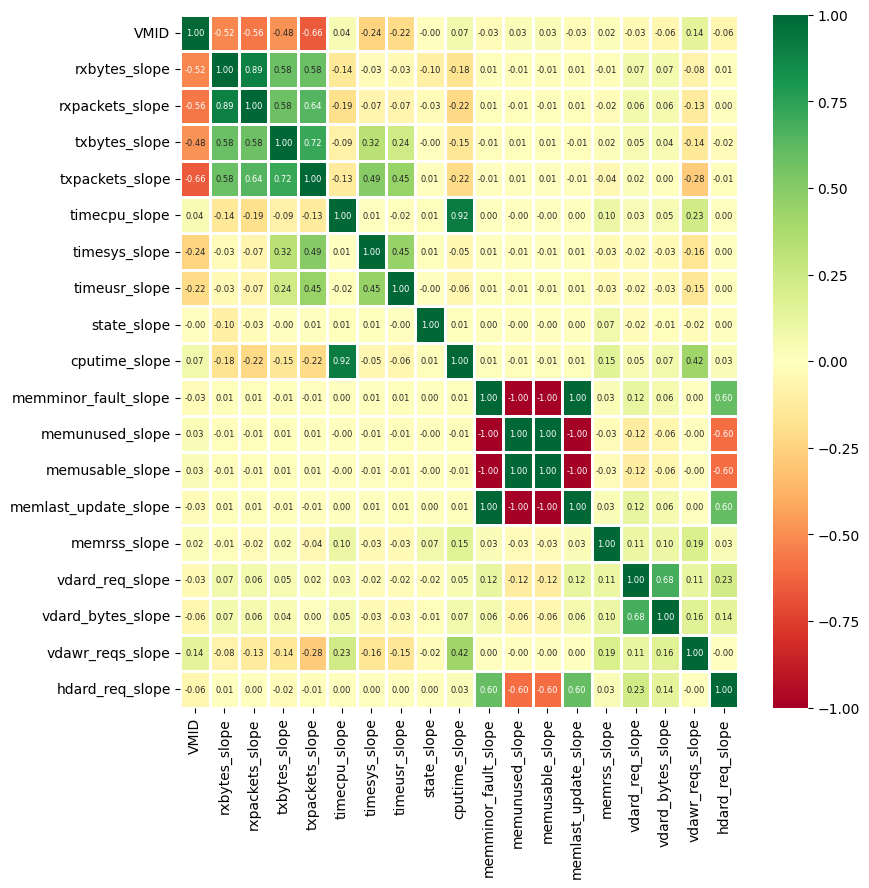

In [25]:
dataframe_subset = dataframe[['VMID','rxbytes_slope', 'rxpackets_slope', 'txbytes_slope',
       'txpackets_slope', 'timecpu_slope', 'timesys_slope', 'timeusr_slope',
       'state_slope', 'cputime_slope', 'memminor_fault_slope',
       'memunused_slope', 'memusable_slope', 'memlast_update_slope',
       'memrss_slope', 'vdard_req_slope', 'vdard_bytes_slope',
       'vdawr_reqs_slope', 'hdard_req_slope',]]
# heatmap to display the correlation of variables
plt.figure(figsize=(9, 9))
sns.heatmap(dataframe_subset.corr(), linewidth=1, annot=True,fmt=".2f",cmap="RdYlGn", annot_kws={"size":6})
plt.show()


<Figure size 400x400 with 0 Axes>

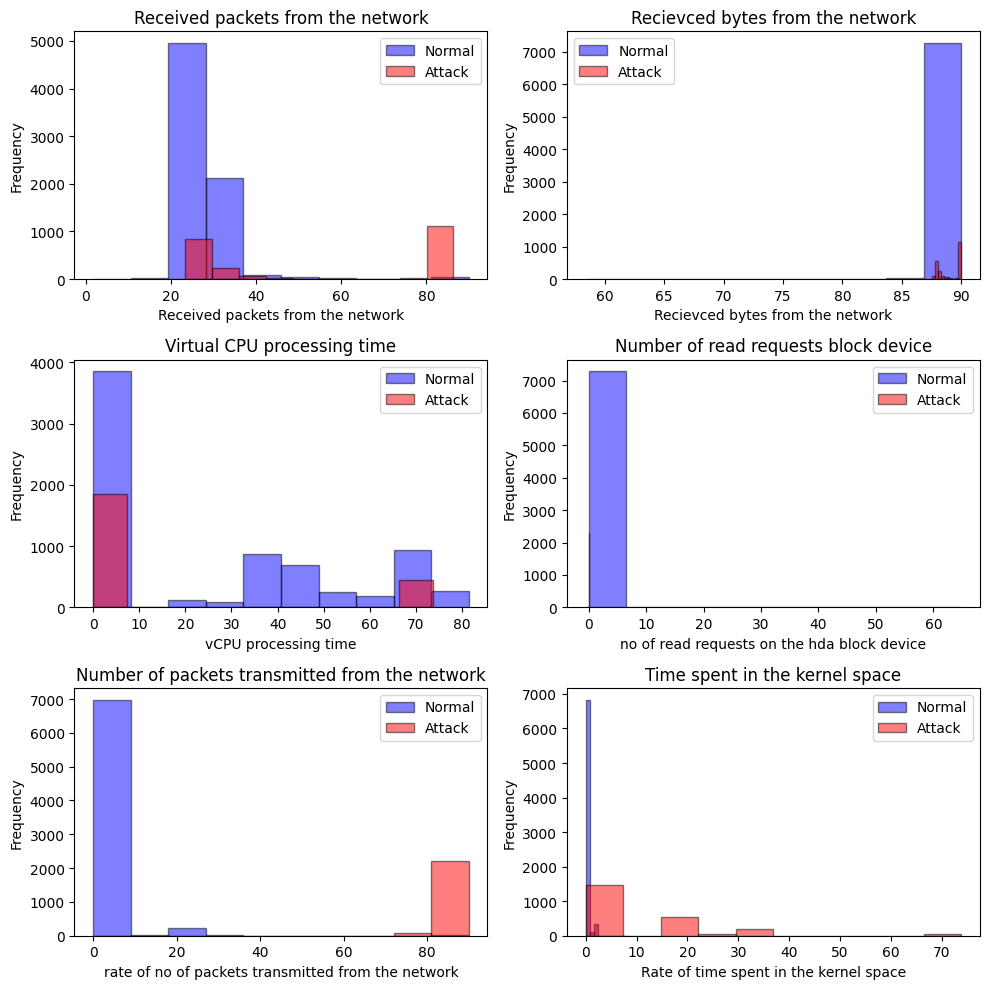

In [26]:
# Extract values from DataFrame
plt.figure(figsize=(4,4))

# Extract values for each histogram
Normal_values = dataframe[dataframe['Status'] == 'Normal']['rxpackets_slope']
Attack_values = dataframe[dataframe['Status'] == 'Attack']['rxpackets_slope']

Normal_values1 = dataframe[dataframe['Status'] == 'Normal']['rxbytes_slope']
Attack_values1 = dataframe[dataframe['Status'] == 'Attack']['rxbytes_slope']

Normal_values2 = dataframe[dataframe['Status'] == 'Normal']['timecpu_slope']
Attack_values2 = dataframe[dataframe['Status'] == 'Attack']['timecpu_slope']

Normal_values3 = dataframe[dataframe['Status'] == 'Normal']['hdard_req_slope']
Attack_values3 = dataframe[dataframe['Status'] == 'Attack']['hdard_req_slope']

Normal_values4 = dataframe[dataframe['Status'] == 'Normal']['txpackets_slope']
Attack_values4 = dataframe[dataframe['Status'] == 'Attack']['txpackets_slope']

Normal_values5 = dataframe[dataframe['Status'] == 'Normal']['timesys_slope']
Attack_values5 = dataframe[dataframe['Status'] == 'Attack']['timesys_slope']


# Create subplots for histograms
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(10,10))  # 1 row, 2 columns


# Construct histograms for the recievced packet
axes[0,0].hist(Normal_values, bins=10, color='blue', alpha=0.5, label='Normal', edgecolor='black')
axes[0,0].hist(Attack_values, bins=10, color='red', alpha=0.5, label='Attack', edgecolor='black')
axes[0,0].set_title('Received packets from the network')
axes[0,0].set_xlabel('Received packets from the network')
axes[0,0].set_ylabel('Frequency')
axes[0,0].legend()

# Construct histogram for the recievced bytes from the network

axes[0,1].hist(Normal_values1, bins=10, color='blue', alpha=0.5, label='Normal', edgecolor='black')
axes[0,1].hist(Attack_values1, bins=10, color='red', alpha=0.5, label='Attack', edgecolor='black')
axes[0,1].set_title('Recievced bytes from the network')
axes[0,1].set_xlabel('Recievced bytes from the network')
axes[0,1].set_ylabel('Frequency')
axes[0,1].legend()

# Construct histogram for vCPU processing time

axes[1,0].hist(Normal_values2, bins=10, color='blue', alpha=0.5, label='Normal', edgecolor='black')
axes[1,0].hist(Attack_values2, bins=10, color='red', alpha=0.5, label='Attack', edgecolor='black')
axes[1,0].set_title('Virtual CPU processing time')
axes[1,0].set_xlabel('vCPU processing time')
axes[1,0].set_ylabel('Frequency')
axes[1,0].legend()

# Construct histogram for the number of read requests on block device

axes[1,1].hist(Normal_values3, bins=10, color='blue', alpha=0.5, label='Normal', edgecolor='black')
axes[1,1].hist(Attack_values3, bins=10, color='red', alpha=0.5, label='Attack', edgecolor='black')
axes[1,1].set_title('Number of read requests block device')
axes[1,1].set_xlabel('no of read requests on the hda block device')
axes[1,1].set_ylabel('Frequency')
axes[1,1].legend()

# Construct histogram for the rate of the number of packets transmitted from the network

axes[2,0].hist(Normal_values4,bins=10, color='blue', alpha=0.5, label='Normal', edgecolor='black')
axes[2,0].hist(Attack_values4, bins=10, color='red', alpha=0.5, label='Attack', edgecolor='black')
axes[2,0].set_title('Number of packets transmitted from the network')
axes[2,0].set_xlabel('rate of no of packets transmitted from the network')
axes[2,0].set_ylabel('Frequency')
axes[2,0].legend()

# Construct histogram for the rate of time spent in the kernel space

axes[2,1].hist(Normal_values5,bins=10, color='blue', alpha=0.5, label='Normal', edgecolor='black')
axes[2,1].hist(Attack_values5, bins=10, color='red', alpha=0.5, label='Attack', edgecolor='black')
axes[2,1].set_title('Time spent in the kernel space')
axes[2,1].set_xlabel('Rate of time spent in the kernel space')
axes[2,1].set_ylabel('Frequency')
axes[2,1].legend()


# Adjust layout
plt.tight_layout()

# Show plot
plt.show()

In [27]:
# Perform label encoding for the target variable
label_encoder = LabelEncoder()
dataframe['Status_new'] = label_encoder.fit_transform(dataframe['Status'])

In [28]:
dataframe1= dataframe.drop(['Status'], axis =1)


In [29]:
# splitting the dataset into X and y dataset
Xa = dataframe1.drop(columns = ['VMID','Status_new'])
y = dataframe1['Status_new']

In [30]:
Xa_train, Xa_test, y_train, y_test = train_test_split(Xa, y, test_size = 0.2, random_state = 0)

# **Balancing the Target Variable**

In [32]:
from imblearn.combine import SMOTETomek
smotetomek = SMOTETomek(random_state=0)
X_resampled, y_resampled = smotetomek.fit_resample(Xa_train, y_train)

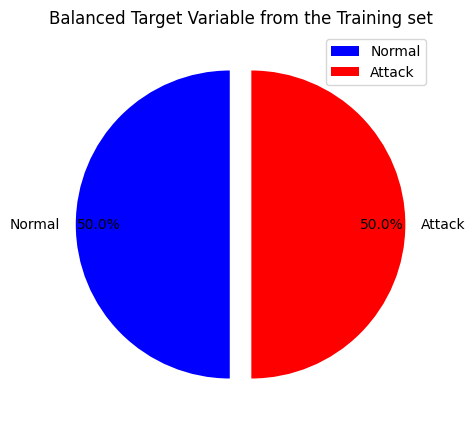

In [39]:
colors = ['blue', 'red']
explode = (0.07,0.07)
plt.figure(figsize=(5, 5))
plt.pie(pd.Series(y_resampled).value_counts(), colors = colors, labels=['Normal', 'Attack'],
        autopct='%1.1f%%', startangle=90, pctdistance=0.85, explode = explode)
plt.legend()
plt.title("Balanced Target Variable from the Training set")
plt.show()

**Heatmap after balancing the Target**

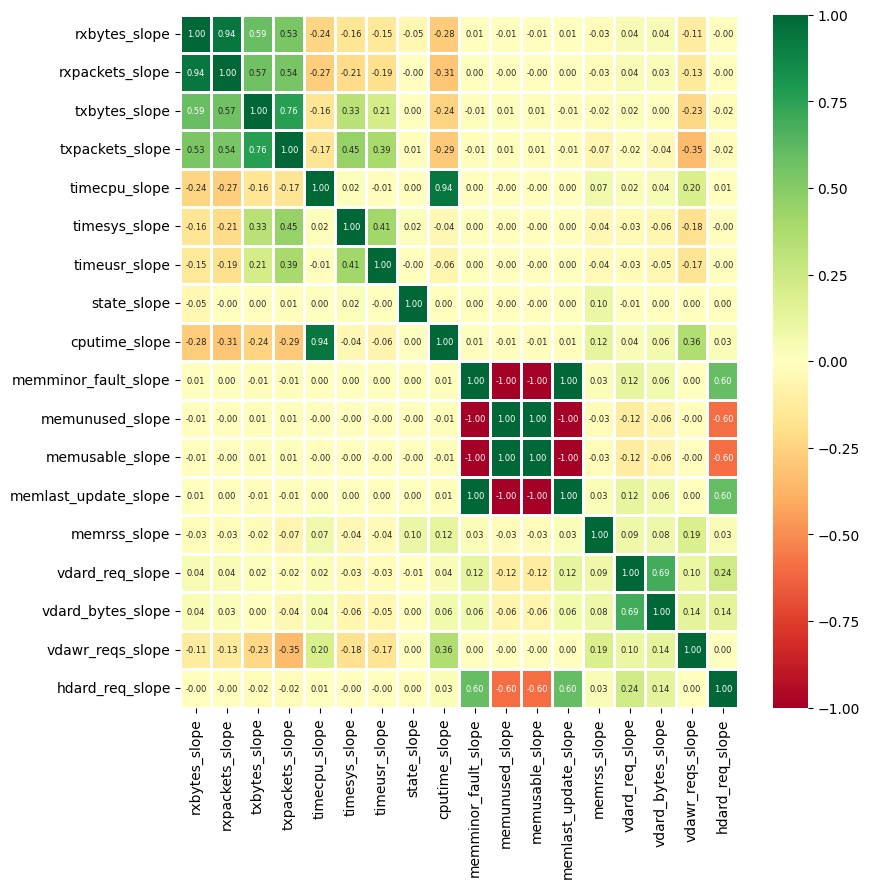

In [42]:
#Plot correlation matrix
plt.figure(figsize=(9, 9))
sns.heatmap(X_resampled.corr(), linewidth=1, annot=True,fmt=".2f",cmap="RdYlGn", annot_kws={"size":6})
plt.show()


In [49]:
# Initialize MinMaxScaler
scaler = MinMaxScaler()
# Fit and transform the DataFrame
X_train = scaler.fit_transform(X_resampled)
# scaling the X test
X_test = scaler.transform (Xa_test)

In [50]:
X_train.shape

(11650, 18)

**FEEDFOWARD NEURAL NETWORK (FFNN) IMPLEMENTATION AFTER BALANCING THE TARGET VARIABLE**

In [57]:
fnn_model = tf.keras.models.Sequential([
    tf.keras.layers.Dense(19, activation='relu', input_shape=(18,)),
    tf.keras.layers.Dense(19, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')  # Output layer with sigmoid activation for binary classification
])

In [58]:
# Compile the model
fnn_model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

In [59]:
# Train the model
fnn_history = fnn_model.fit(X_train, y_resampled, validation_data=(X_test, y_test), verbose=1, epochs=20, batch_size=32)

Epoch 1/20
365/365 [==============================] - 2s 3ms/step - loss: 0.1624 - accuracy: 0.9533 - val_loss: 0.0209 - val_accuracy: 0.9953
Epoch 2/20
365/365 [==============================] - 1s 2ms/step - loss: 0.0108 - accuracy: 0.9982 - val_loss: 0.0216 - val_accuracy: 0.9953
Epoch 3/20
365/365 [==============================] - 1s 2ms/step - loss: 0.0088 - accuracy: 0.9985 - val_loss: 0.0220 - val_accuracy: 0.9953
Epoch 4/20
365/365 [==============================] - 1s 2ms/step - loss: 0.0086 - accuracy: 0.9983 - val_loss: 0.0223 - val_accuracy: 0.9953
Epoch 5/20
365/365 [==============================] - 1s 4ms/step - loss: 0.0080 - accuracy: 0.9985 - val_loss: 0.0187 - val_accuracy: 0.9953
Epoch 6/20
365/365 [==============================] - 1s 4ms/step - loss: 0.0078 - accuracy: 0.9985 - val_loss: 0.0140 - val_accuracy: 0.9958
Epoch 7/20
365/365 [==============================] - 1s 4ms/step - loss: 0.0076 - accuracy: 0.9985 - val_loss: 0.0141 - val_accuracy: 0.9958
Epoch 

# **Model evaluation**

In [61]:
# model evaluation for using the test dataset for the feedfoward neural network
fnn_loss, fnn_accuracy = fnn_model.evaluate(X_test, y_test, verbose=0)
print ("Loss=%.4f" %fnn_loss)
print ("Accuracy=%.4f" %fnn_accuracy)

Loss=0.0122
Accuracy=0.9964


In [62]:
# predicting the test results
y_predfnn= fnn_model.predict(X_test)
y_predfnn = np.round(y_predfnn)

60/60 [==============================] - 0s 1ms/step


**ANN**

In [ ]:
# Initialize MinMaxScaler
scaler = MinMaxScaler()

# Fit and transform the DataFrame
Xn = scaler.fit_transform(X_resampled)


# Convert the scaled data back to a DataFrame
X = pd.DataFrame(Xn, columns=Xa.columns)

**USING THE RANDOM FOREST CLASSIFIER TO HELP GET THE FEATURE IMPORTANCE**

In [ ]:
model = RandomForestClassifier()
model.fit(X, y)

feature_importance = model.feature_importances_

#Create a DataFrame to display feature importance
feature_importance_dataframe = pd.DataFrame({'Feature': X.columns, 'Importance': feature_importance})

# Sort feature importance in descending order
feature_importance_dataframe = feature_importance_dataframe.sort_values(by='Importance', ascending=False)

feature_importance_dataframe


,Feature,Importance
3,txpackets_slope,0.415489
2,txbytes_slope,0.244382
0,rxbytes_slope,0.098142
16,vdawr_reqs_slope,0.081762
1,rxpackets_slope,0.060364
6,timeusr_slope,0.049282
5,timesys_slope,0.038904
4,timecpu_slope,0.004543
8,cputime_slope,0.003150
13,memrss_slope,0.002445


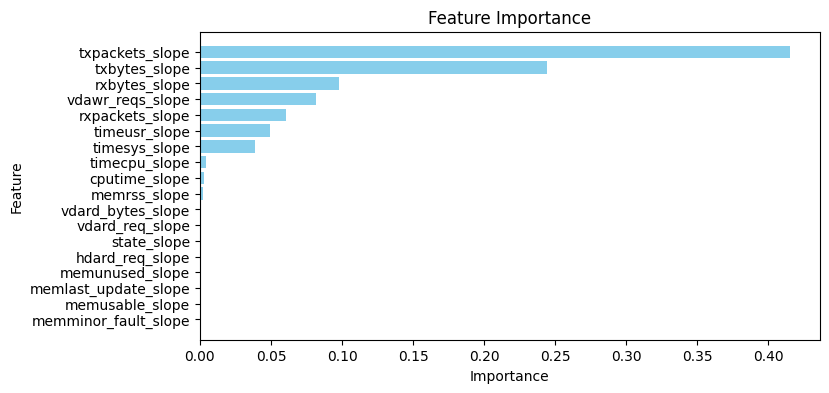

In [ ]:
# Create a bar graph
plt.figure(figsize=(8, 4))
plt.barh(feature_importance_dataframe['Feature'], feature_importance_dataframe['Importance'], color='skyblue')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importance')
plt.gca().invert_yaxis()  # Invert y-axis to display highest importance at the top
plt.show()

In [ ]:
# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
print("Before OverSampling, counts of label '1': {}".format(sum(y_train == 1)))
print("Before OverSampling, counts of label '0': {} \n".format(sum(y_train == 0)))

Before OverSampling, counts of label '1': 5829
Before OverSampling, counts of label '0': 1846 



In [ ]:
# Distribution of target variable before sampling
print("Class distribution before resampling:", Counter(y))

Class distribution before resampling: Counter({1: 7288, 0: 2306})


In [ ]:
# Apply SMOTE to oversample the minority class
smote = SMOTE(sampling_strategy='auto', random_state=42)
smtX_train, smty_train = smote.fit_resample(X, y)

In [ ]:
# Print the target class distribution after resampling
print("Class distribution after resampling:", Counter(smty_train))

Class distribution after resampling: Counter({1: 7288, 0: 7288})


### **FEEDFOWARD NEURAL NETWORK (FFNN) IMPLEMENTATION BEFORE BALANCING THE TARGET**

In [ ]:
fnn_model = tf.keras.models.Sequential([
    tf.keras.layers.Dense(100, activation='relu', input_shape=(18,)),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')  # Output layer with sigmoid activation for binary classification
])

In [ ]:
# Compile the model
fnn_model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

In [ ]:
# Train the model
fnn_history = fnn_model.fit(smtX_train, smty_train,validation_data=(X_test, y_test), verbose=1, epochs=50, batch_size=32)

Epoch 1/50
456/456 [==============================] - 1s 3ms/step - loss: 0.0035 - accuracy: 0.9990 - val_loss: 0.0061 - val_accuracy: 0.9979
Epoch 2/50
456/456 [==============================] - 1s 3ms/step - loss: 0.0035 - accuracy: 0.9990 - val_loss: 0.0070 - val_accuracy: 0.9979
Epoch 3/50
456/456 [==============================] - 1s 3ms/step - loss: 0.0032 - accuracy: 0.9990 - val_loss: 0.0049 - val_accuracy: 0.9990
Epoch 4/50
456/456 [==============================] - 1s 3ms/step - loss: 0.0033 - accuracy: 0.9992 - val_loss: 0.0054 - val_accuracy: 0.9979
Epoch 5/50
456/456 [==============================] - 1s 3ms/step - loss: 0.0034 - accuracy: 0.9991 - val_loss: 0.0051 - val_accuracy: 0.9984
Epoch 6/50
456/456 [==============================] - 2s 4ms/step - loss: 0.0031 - accuracy: 0.9993 - val_loss: 0.0063 - val_accuracy: 0.9984
Epoch 7/50
456/456 [==============================] - 2s 4ms/step - loss: 0.0033 - accuracy: 0.9990 - val_loss: 0.0078 - val_accuracy: 0.9979
Epoch 

### **Model Evaluation**

In [ ]:
# model evaluation for using the test dataset for the feedfoward neural network
fnn_loss, fnn_accuracy = fnn_model.evaluate(X_test, y_test, verbose=0)
print ("Loss=%.4f" %fnn_loss)
print ("Accuracy=%.4f" %fnn_accuracy)

Loss=0.0048
Accuracy=0.9979


In [ ]:
# predicting the test results
y_predfnn= fnn_model.predict(X_test)
y_predfnn = np.round(y_predfnn)


60/60 [==============================] - 0s 1ms/step


In [ ]:
fnn_history.history.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

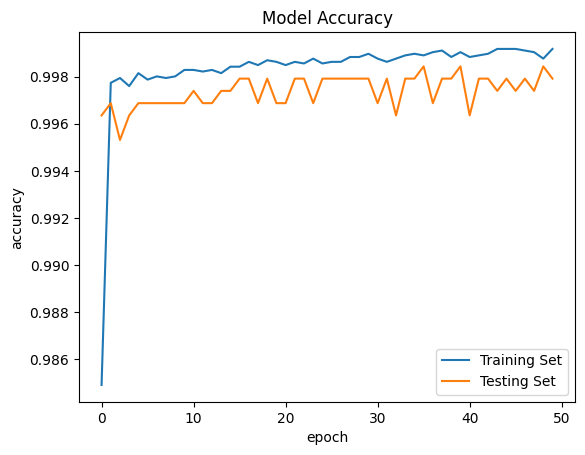

In [ ]:
plt.plot(fnn_history.history['accuracy'])
plt.plot(fnn_history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['Training Set','Testing Set'], loc = 'lower right')

In [ ]:
# Calculate confusion matrix
cm = confusion_matrix(y_test, y_predfnn)

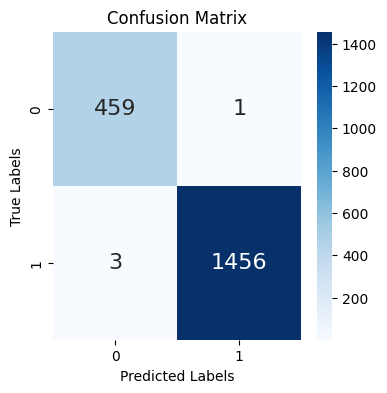

In [ ]:
# Plot confusion matrix
plt.figure(figsize=(4, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', annot_kws={'size': 16})
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

In [ ]:
# Generate classification report
report = classification_report(y_test, y_predfnn)

# Print the classification report
print("Classification Report:")
print(report)

Classification Report:
              precision    recall  f1-score   support

           0       0.99      1.00      1.00       460
           1       1.00      1.00      1.00      1459

    accuracy                           1.00      1919
   macro avg       1.00      1.00      1.00      1919
weighted avg       1.00      1.00      1.00      1919



In [ ]:
# train the blackbox (feed Foward Neural Network)
model_fnn = MLPClassifier(hidden_layer_sizes=(100,), max_iter=10, random_state=42)
model_fnn.fit(smtX_train, smty_train)

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


MLPClassifier(max_iter=10, random_state=42)

In [ ]:
X_test = pd.DataFrame(X_test)
smtX_train.columns = pd.Index(smtX_train.columns)

feature_names = list(smtX_train.columns)

In [ ]:
#converts this the training dataframe into a 2D- array
smtX_train_np = smtX_train.to_numpy()

In [ ]:
#converts this the training dataframe into a 2D- array
smty_train_np = smty_train.to_numpy()

In [ ]:
# instantiating the expaliner for feedforward neural network using the LIME XAI technique
explainer = lime.lime_tabular.LimeTabularExplainer(smtX_train_np, feature_names=feature_names,class_names = ['Normal','Attack'],verbose=True, mode='classification')
explainer

In [ ]:
# converts the testing dataframe into a 2-D array
X_test_np = X_test.to_numpy()

In [ ]:
# converts the testing dataframe into a 2-D array
y_test_np = y_test.to_numpy()

In [ ]:
# Generate explanationsfor feedforward neural network
explanation = explainer.explain_instance(X_test_np[45],model_fnn.predict_proba,num_features=7)
explanation.show_in_notebook()

explanation = explainer.explain_instance(X_test_np[49],model_fnn.predict_proba,num_features=7)

explanation.show_in_notebook()
explanation = explainer.explain_instance(X_test_np[367],model_fnn.predict_proba,num_features=7)

explanation.show_in_notebook()


Intercept 1.030389308136375
Prediction_local [-0.09183354]
Right: 0.0009912284185523575


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(


Intercept 0.32341065130700225
Prediction_local [0.9971218]
Right: 0.9984543118962982


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(


Intercept 0.43380129695508135
Prediction_local [1.01894728]
Right: 0.9995724368706799


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(


### **CONVOLUTIONAL NEURAL NETWORK (CNN) IMPLEMENTATION**

In [ ]:
# Reshape the features for CNN input
X_train = X_train.values.reshape(-1, X_train.shape[1], 1)
X_test = X_test.values.reshape(-1, X_test.shape[1], 1)

In [ ]:
# Build the CNN model
cnn_model = tf.keras.Sequential([
    tf.keras.layers.Conv1D(100, kernel_size=3, activation='relu', input_shape=(X_train.shape[1], 1)),
    tf.keras.layers.MaxPooling1D(pool_size=2),
    tf.keras.layers.Conv1D(32, kernel_size=3, activation='relu'),
    tf.keras.layers.MaxPooling1D(pool_size=2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(100, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

In [ ]:
# Compile the model
cnn_model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

In [ ]:
# Train the model
cnn_history = cnn_model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test), verbose=1)

Epoch 1/50
240/240 [==============================] - 6s 17ms/step - loss: 0.1251 - accuracy: 0.9487 - val_loss: 0.0181 - val_accuracy: 0.9964
Epoch 2/50
240/240 [==============================] - 3s 12ms/step - loss: 0.0098 - accuracy: 0.9978 - val_loss: 0.0163 - val_accuracy: 0.9969
Epoch 3/50
240/240 [==============================] - 3s 14ms/step - loss: 0.0110 - accuracy: 0.9975 - val_loss: 0.0159 - val_accuracy: 0.9953
Epoch 4/50
240/240 [==============================] - 2s 7ms/step - loss: 0.0102 - accuracy: 0.9977 - val_loss: 0.0135 - val_accuracy: 0.9974
Epoch 5/50
240/240 [==============================] - 2s 8ms/step - loss: 0.0084 - accuracy: 0.9982 - val_loss: 0.0131 - val_accuracy: 0.9974
Epoch 6/50
240/240 [==============================] - 3s 10ms/step - loss: 0.0095 - accuracy: 0.9983 - val_loss: 0.0117 - val_accuracy: 0.9969
Epoch 7/50
240/240 [==============================] - 3s 10ms/step - loss: 0.0079 - accuracy: 0.9984 - val_loss: 0.0121 - val_accuracy: 0.9974
E

In [ ]:
# model evaluation
cnn_loss, cnn_accuracy = cnn_model.evaluate(X_test, y_test, verbose=0)
print ("Loss=%.4f" %cnn_loss)
print ("Accuracy=%.4f" %cnn_accuracy)

Loss=0.0132
Accuracy=0.9974


In [ ]:
y_predcnn= cnn_model.predict(X_test)
y_predcnn=(y_predcnn>= 0.5)

60/60 [==============================] - 0s 3ms/step


In [ ]:
cm_cnn = confusion_matrix(y_test, y_predcnn)
cm_cnn

array([[ 458,    2],
       [   3, 1456]])

In [ ]:
y_predcnn= cnn_model.predict(X_test)
y_predcnn = np.round(y_predcnn)

60/60 [==============================] - 0s 2ms/step


In [ ]:
# Calculate confusion matrix
cm_cnn = confusion_matrix(y_test, y_predcnn)

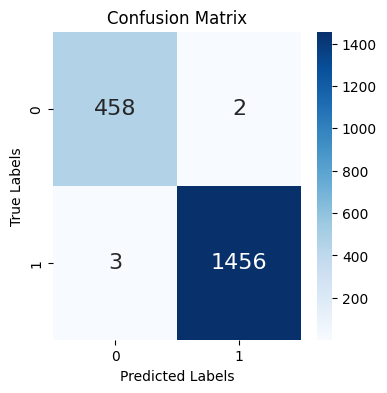

In [ ]:
# Plot confusion matrix performance of the convolutional neural network
plt.figure(figsize=(4, 4))
sns.heatmap(cm_cnn, annot=True, fmt='d', cmap='Blues', annot_kws={'size': 16})
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

In [ ]:
# Generate classification report
report_cnn = classification_report(y_test, y_predfnn)

# Print the classification report
print("Classification Report:")
print(report_cnn)

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.99      0.99       460
           1       1.00      1.00      1.00      1459

    accuracy                           1.00      1919
   macro avg       1.00      1.00      1.00      1919
weighted avg       1.00      1.00      1.00      1919



In [ ]:
plt.plot(cnn_history.history['accuracy'], label='CNN Training Accuracy')
plt.plot(history.history['accuracy'], label='FNN Training Accuracy')

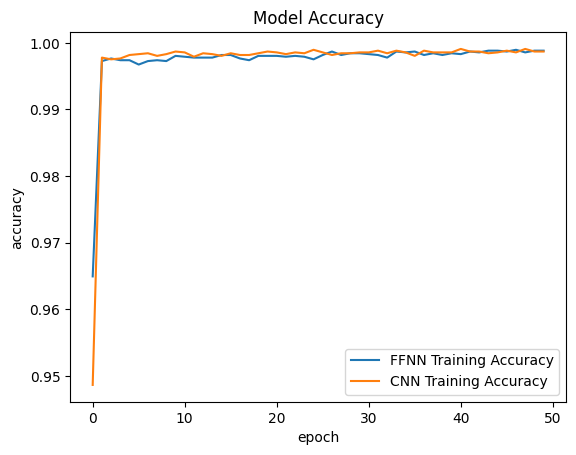

In [ ]:
plt.plot(fnn_history.history['accuracy'],label='FFNN Training Accuracy')
plt.plot(cnn_history.history['accuracy'],label='CNN Training Accuracy')
plt.title('Model Accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend()
plt.show()

### **RECURRENT NEURAL NETWORK (RNN) IMPLEMENTATION**

In [ ]:
# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Reshape the features for RNN input
X_train_rnn = np.expand_dims(X_train.values, axis=2)
X_test_rnn = np.expand_dims(X_test.values, axis=2)

In [ ]:
# Build the RNN model
rnn_model = tf.keras.Sequential([
    tf.keras.layers.SimpleRNN(100, activation='relu', input_shape= (X_train_rnn.shape[1], X_train_rnn.shape[2])),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

In [ ]:
# Compile the model
rnn_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [ ]:
# Train the model
rnn_history = rnn_model.fit(X_train_rnn, y_train, epochs=50, batch_size=32, validation_data=(X_test_rnn, y_test), verbose=1)

Epoch 1/50
240/240 [==============================] - 3s 7ms/step - loss: 0.1566 - accuracy: 0.9365 - val_loss: 0.0192 - val_accuracy: 0.9948
Epoch 2/50
240/240 [==============================] - 1s 6ms/step - loss: 0.0135 - accuracy: 0.9965 - val_loss: 0.0144 - val_accuracy: 0.9964
Epoch 3/50
240/240 [==============================] - 2s 7ms/step - loss: 0.0110 - accuracy: 0.9969 - val_loss: 0.0138 - val_accuracy: 0.9958
Epoch 4/50
240/240 [==============================] - 2s 9ms/step - loss: 0.0111 - accuracy: 0.9969 - val_loss: 0.0143 - val_accuracy: 0.9964
Epoch 5/50
240/240 [==============================] - 2s 6ms/step - loss: 0.0090 - accuracy: 0.9975 - val_loss: 0.0144 - val_accuracy: 0.9958
Epoch 6/50
240/240 [==============================] - 2s 6ms/step - loss: 0.0088 - accuracy: 0.9975 - val_loss: 0.0152 - val_accuracy: 0.9964
Epoch 7/50
240/240 [==============================] - 1s 6ms/step - loss: 0.0079 - accuracy: 0.9975 - val_loss: 0.0147 - val_accuracy: 0.9969
Epoch 

In [ ]:
# model evaluation
rnn_loss, rnn_accuracy = rnn_model.evaluate(X_test, y_test, verbose=0)
print ("Loss=%.4f" %rnn_loss)
print ("Accuracy=%.4f" %rnn_accuracy)

Loss=0.0126
Accuracy=0.9969


In [ ]:
 rnn_accuracy = rnn_model.evaluate(X_test_rnn, y_test, verbose=0)

In [ ]:
# model evaluation
rnn_loss, rnn_accuracy = rnn_model.evaluate(X_test, y_test, verbose=0)
print ("Loss=%.4f" %rnn_loss)
print ("Accuracy=%.4f" %rnn_accuracy)

Loss=0.0126
Accuracy=0.9969


In [ ]:
y_predrnn= rnn_model.predict(X_test)
y_predrnn = np.round(y_predrnn)

60/60 [==============================] - 0s 3ms/step


In [ ]:
# Calculate confusion matrix
cm_rnn = confusion_matrix(y_test, y_predrnn)
cm_rnn

array([[ 457,    3],
       [   3, 1456]])

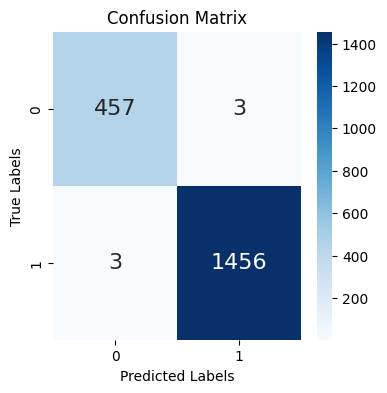

In [ ]:
# Plot confusion matrix for performance of recurrent neural network
plt.figure(figsize=(4, 4))
sns.heatmap(cm_rnn, annot=True, fmt='d', cmap='Blues', annot_kws={'size': 16})
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

In [ ]:
# Generate classification report
report_rnn = classification_report(y_test, y_predrnn)

# Print the classification report
print("Classification Report:")
print(report_rnn )

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.99      0.99       460
           1       1.00      1.00      1.00      1459

    accuracy                           1.00      1919
   macro avg       1.00      1.00      1.00      1919
weighted avg       1.00      1.00      1.00      1919



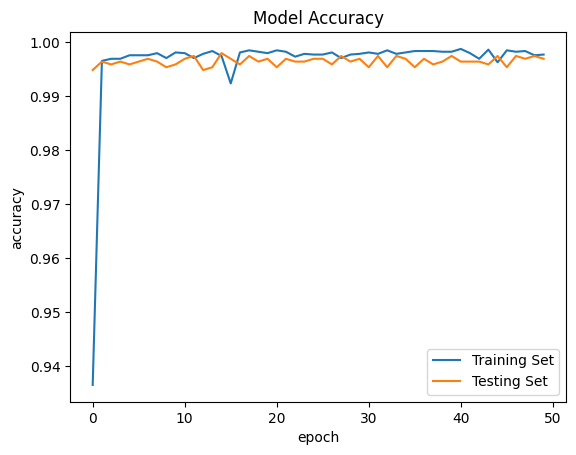

In [ ]:
plt.plot(rnn_history.history['accuracy'])
plt.plot(rnn_history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['Training Set','Testing Set'], loc = 'lower right')

### **LONG SHORT TERM MEMORY NEURAL NETWORK (LSTM) IMPLEMENTATION**

In [ ]:
# Reshape the features for LSTM input
X_train_lstm = np.expand_dims(X_train.values, axis=2)
X_test_lstm = np.expand_dims(X_test.values, axis=2)

In [ ]:
# Define model architecture
model_lstm = Sequential()
model_lstm.add(LSTM(64, input_shape=(X_train_lstm.shape[1], X_train_lstm.shape[2]), return_sequences=True))
model_lstm.add(Dense(1, activation='sigmoid'))

In [ ]:
# compile the model
model_lstm.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

In [ ]:
# Train the model
lstm_history = model_lstm.fit(X_train_lstm, y_train, epochs=50, batch_size=32, validation_data=(X_test_lstm, y_test), verbose=1)

Epoch 1/50
240/240 [==============================] - 7s 14ms/step - loss: 0.4371 - accuracy: 0.8198 - val_loss: 0.2881 - val_accuracy: 0.8947
Epoch 2/50
240/240 [==============================] - 4s 15ms/step - loss: 0.2576 - accuracy: 0.9051 - val_loss: 0.2216 - val_accuracy: 0.9213
Epoch 3/50
240/240 [==============================] - 3s 13ms/step - loss: 0.1921 - accuracy: 0.9270 - val_loss: 0.1694 - val_accuracy: 0.9364
Epoch 4/50
240/240 [==============================] - 3s 11ms/step - loss: 0.2078 - accuracy: 0.9277 - val_loss: 0.1715 - val_accuracy: 0.9337
Epoch 5/50
240/240 [==============================] - 3s 14ms/step - loss: 0.1530 - accuracy: 0.9394 - val_loss: 0.1440 - val_accuracy: 0.9469
Epoch 6/50
240/240 [==============================] - 3s 12ms/step - loss: 0.1356 - accuracy: 0.9480 - val_loss: 0.1971 - val_accuracy: 0.9433
Epoch 7/50
240/240 [==============================] - 4s 15ms/step - loss: 0.1564 - accuracy: 0.9448 - val_loss: 0.1346 - val_accuracy: 0.9538

In [ ]:
# model evaluation
lstm_loss, lstm_accuracy = model_lstm.evaluate(X_test, y_test, verbose=0)
print ("Loss=%.4f" %lstm_loss)
print ("Accuracy=%.4f" %lstm_accuracy)

Loss=0.0873
Accuracy=0.9722


In [ ]:
y_predlstm= model_lstm.predict(X_test)
y_predlstm = np.round(y_predlstm)

60/60 [==============================] - 1s 4ms/step


In [ ]:
y_predlstm = y_predlstm.reshape(-1, 1)

In [ ]:
y_test

9100    0
7384    0
7249    1
8558    0
6605    1
       ..
8991    0
1226    1
2752    1
3777    1
96      1
Name: Status_new, Length: 1919, dtype: int64

In [ ]:
if y_test.shape[0] > y_predlstm.shape[0]:
    y_test = y_test[:y_predlstm.shape[0]]
elif y_predlstm.shape[0] > y_test.shape[0]:
    y_predlstm = y_predlstm[:y_test.shape[0]]

In [ ]:
conf_matrix = confusion_matrix(y_test, y_predlstm)
conf_matrix

array([[ 126,  334],
       [ 372, 1087]])

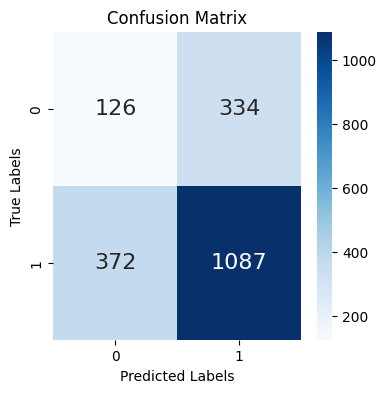

In [ ]:
# Plot confusion matrix for performance of recurrent neural network
plt.figure(figsize=(4, 4))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', annot_kws={'size': 16})
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

In [ ]:
# Generate classification report
report_lstm = classification_report(y_test,y_predlstm)

# Print the classification report
print("Classification Report:")
print(report_lstm )

Classification Report:
              precision    recall  f1-score   support

           0       0.25      0.27      0.26       460
           1       0.76      0.75      0.75      1459

    accuracy                           0.63      1919
   macro avg       0.51      0.51      0.51      1919
weighted avg       0.64      0.63      0.64      1919



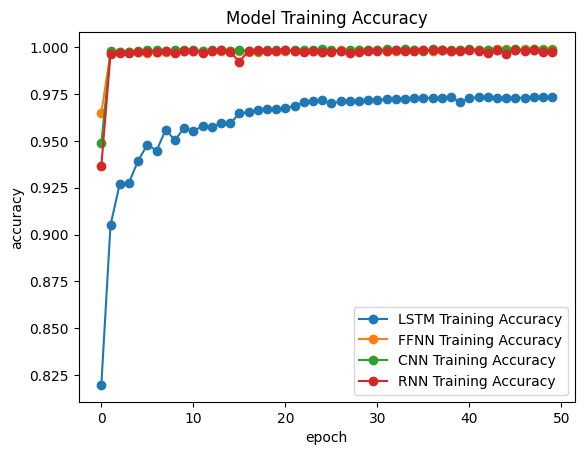

In [ ]:
plt.plot(lstm_history.history['accuracy'],label='LSTM Training Accuracy',marker='o')
plt.plot(fnn_history.history['accuracy'],label='FFNN Training Accuracy',marker='o')
plt.plot(cnn_history.history['accuracy'],label='CNN Training Accuracy',marker='o')
plt.plot(rnn_history.history['accuracy'],label='RNN Training Accuracy',marker='o')
plt.title('Model Training Accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend()
plt.show()

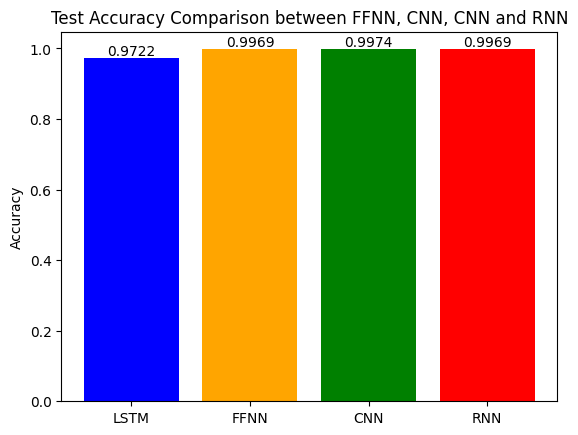

In [ ]:
plt.bar(['LSTM','FFNN', 'CNN', 'RNN',], [lstm_accuracy,fnn_accuracy,cnn_accuracy,rnn_accuracy], color=['blue','orange', 'green','red',])
plt.ylabel('Accuracy')
plt.title('Test Accuracy Comparison between FFNN, CNN, CNN and RNN')

for i, accuracy1 in enumerate([lstm_accuracy,fnn_accuracy,cnn_accuracy,rnn_accuracy]):
    plt.text(i, accuracy1, f'{accuracy1:.4f}', ha='center', va='bottom')

plt.show()
plt.show()
# Annotate bars with accuracy values


# **Application of SHAP exaplainable AI on Recurrent Neural Network**

36/36 [==============================] - 0s 4ms/step


PermutationExplainer explainer:   0%|          | 3/1919 [00:00<?, ?it/s]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   0%|          | 5/1919 [00:12<28:44,  1.11it/s]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   0%|          | 6/1919 [00:14<39:10,  1.23s/it]

33/33 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   0%|          | 7/1919 [00:16<47:49,  1.50s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   0%|          | 8/1919 [00:18<54:22,  1.71s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   0%|          | 9/1919 [00:20<56:31,  1.78s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:   1%|          | 10/1919 [00:23<1:04:13,  2.02s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   1%|          | 11/1919 [00:25<1:05:31,  2.06s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   1%|          | 12/1919 [00:27<1:07:18,  2.12s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   1%|          | 13/1919 [00:29<1:06:10,  2.08s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   1%|          | 14/1919 [00:31<1:02:58,  1.98s/it]

40/40 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   1%|          | 15/1919 [00:33<1:04:20,  2.03s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:   1%|          | 16/1919 [00:35<1:06:13,  2.09s/it]

40/40 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   1%|          | 17/1919 [00:38<1:09:43,  2.20s/it]

31/31 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   1%|          | 18/1919 [00:39<1:01:34,  1.94s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   1%|          | 19/1919 [00:40<56:29,  1.78s/it]  

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   1%|          | 20/1919 [00:42<59:01,  1.86s/it]

40/40 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   1%|          | 21/1919 [00:44<1:00:41,  1.92s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   1%|          | 22/1919 [00:47<1:03:29,  2.01s/it]

41/41 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   1%|          | 23/1919 [00:49<1:08:45,  2.18s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   1%|▏         | 24/1919 [00:51<1:06:48,  2.12s/it]

44/44 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   1%|▏         | 25/1919 [00:54<1:09:10,  2.19s/it]

32/32 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   1%|▏         | 26/1919 [00:55<1:02:32,  1.98s/it]

32/32 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   1%|▏         | 27/1919 [00:57<1:01:15,  1.94s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   1%|▏         | 28/1919 [00:59<1:04:51,  2.06s/it]

30/30 [==============================] - 0s 4ms/step


PermutationExplainer explainer:   2%|▏         | 29/1919 [01:01<1:02:10,  1.97s/it]

35/35 [==============================] - 0s 4ms/step


PermutationExplainer explainer:   2%|▏         | 30/1919 [01:04<1:08:10,  2.17s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   2%|▏         | 31/1919 [01:05<1:01:58,  1.97s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   2%|▏         | 32/1919 [01:07<59:30,  1.89s/it]  

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   2%|▏         | 33/1919 [01:09<56:53,  1.81s/it]

32/32 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   2%|▏         | 34/1919 [01:10<52:30,  1.67s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   2%|▏         | 35/1919 [01:12<56:17,  1.79s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:   2%|▏         | 36/1919 [01:14<57:08,  1.82s/it]

36/36 [==============================] - 0s 4ms/step


PermutationExplainer explainer:   2%|▏         | 37/1919 [01:16<1:02:38,  2.00s/it]

33/33 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   2%|▏         | 38/1919 [01:18<59:40,  1.90s/it]  

33/33 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   2%|▏         | 39/1919 [01:19<54:32,  1.74s/it]

35/35 [==============================] - 0s 2ms/step


PermutationExplainer explainer:   2%|▏         | 40/1919 [01:21<55:06,  1.76s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   2%|▏         | 41/1919 [01:23<55:27,  1.77s/it]

41/41 [==============================] - 0s 2ms/step


PermutationExplainer explainer:   2%|▏         | 42/1919 [01:25<59:32,  1.90s/it]

31/31 [==============================] - 0s 5ms/step


PermutationExplainer explainer:   2%|▏         | 43/1919 [01:27<1:02:56,  2.01s/it]

38/38 [==============================] - 0s 5ms/step


PermutationExplainer explainer:   2%|▏         | 44/1919 [01:30<1:12:17,  2.31s/it]

36/36 [==============================] - 0s 2ms/step


PermutationExplainer explainer:   2%|▏         | 45/1919 [01:33<1:15:07,  2.41s/it]

38/38 [==============================] - 0s 2ms/step


PermutationExplainer explainer:   2%|▏         | 46/1919 [01:35<1:10:03,  2.24s/it]

41/41 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   2%|▏         | 47/1919 [01:37<1:07:32,  2.16s/it]

42/42 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   3%|▎         | 48/1919 [01:39<1:05:40,  2.11s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   3%|▎         | 49/1919 [01:40<1:01:36,  1.98s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:   3%|▎         | 50/1919 [01:42<1:00:41,  1.95s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   3%|▎         | 51/1919 [01:45<1:06:12,  2.13s/it]

40/40 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   3%|▎         | 52/1919 [01:47<1:06:19,  2.13s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   3%|▎         | 53/1919 [01:49<1:02:02,  1.99s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   3%|▎         | 54/1919 [01:50<59:11,  1.90s/it]  

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   3%|▎         | 55/1919 [01:52<55:37,  1.79s/it]

40/40 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   3%|▎         | 56/1919 [01:54<58:11,  1.87s/it]

41/41 [==============================] - 0s 4ms/step


PermutationExplainer explainer:   3%|▎         | 57/1919 [01:56<1:03:08,  2.03s/it]

41/41 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   3%|▎         | 58/1919 [01:59<1:06:22,  2.14s/it]

44/44 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   3%|▎         | 59/1919 [02:01<1:03:39,  2.05s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   3%|▎         | 60/1919 [02:02<1:00:10,  1.94s/it]

41/41 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   3%|▎         | 61/1919 [02:04<1:01:18,  1.98s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   3%|▎         | 62/1919 [02:07<1:02:25,  2.02s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   3%|▎         | 63/1919 [02:08<56:45,  1.83s/it]  

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   3%|▎         | 64/1919 [02:10<1:00:56,  1.97s/it]

38/38 [==============================] - 0s 2ms/step


PermutationExplainer explainer:   3%|▎         | 65/1919 [02:12<1:02:33,  2.02s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   3%|▎         | 66/1919 [02:15<1:04:55,  2.10s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   3%|▎         | 67/1919 [02:17<1:03:03,  2.04s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   4%|▎         | 68/1919 [02:19<1:03:37,  2.06s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   4%|▎         | 69/1919 [02:20<59:20,  1.92s/it]  

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:   4%|▎         | 70/1919 [02:23<1:05:30,  2.13s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   4%|▎         | 71/1919 [02:25<1:07:37,  2.20s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   4%|▍         | 72/1919 [02:27<1:02:13,  2.02s/it]

41/41 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   4%|▍         | 73/1919 [02:29<1:02:46,  2.04s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   4%|▍         | 74/1919 [02:31<1:02:17,  2.03s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   4%|▍         | 75/1919 [02:33<1:01:36,  2.00s/it]

41/41 [==============================] - 0s 4ms/step


PermutationExplainer explainer:   4%|▍         | 76/1919 [02:35<1:04:09,  2.09s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:   4%|▍         | 77/1919 [02:38<1:07:29,  2.20s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   4%|▍         | 78/1919 [02:40<1:08:23,  2.23s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   4%|▍         | 79/1919 [02:42<1:03:45,  2.08s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   4%|▍         | 80/1919 [02:43<1:00:42,  1.98s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   4%|▍         | 81/1919 [02:45<1:00:06,  1.96s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   4%|▍         | 82/1919 [02:48<1:02:30,  2.04s/it]

33/33 [==============================] - 0s 4ms/step


PermutationExplainer explainer:   4%|▍         | 83/1919 [02:50<1:04:24,  2.11s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   4%|▍         | 84/1919 [02:52<1:06:46,  2.18s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   4%|▍         | 85/1919 [02:54<1:02:33,  2.05s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   4%|▍         | 86/1919 [02:56<1:01:31,  2.01s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   5%|▍         | 87/1919 [02:58<59:52,  1.96s/it]  

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   5%|▍         | 88/1919 [03:00<59:44,  1.96s/it]

38/38 [==============================] - 0s 5ms/step


PermutationExplainer explainer:   5%|▍         | 89/1919 [03:02<1:02:46,  2.06s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:   5%|▍         | 90/1919 [03:05<1:13:07,  2.40s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   5%|▍         | 91/1919 [03:07<1:12:55,  2.39s/it]

40/40 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   5%|▍         | 92/1919 [03:10<1:11:58,  2.36s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   5%|▍         | 93/1919 [03:11<1:05:45,  2.16s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   5%|▍         | 94/1919 [03:14<1:04:47,  2.13s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   5%|▍         | 95/1919 [03:16<1:03:28,  2.09s/it]

36/36 [==============================] - 0s 4ms/step


PermutationExplainer explainer:   5%|▌         | 96/1919 [03:18<1:07:54,  2.23s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   5%|▌         | 97/1919 [03:21<1:10:08,  2.31s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   5%|▌         | 98/1919 [03:23<1:07:02,  2.21s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   5%|▌         | 99/1919 [03:25<1:05:50,  2.17s/it]

42/42 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   5%|▌         | 100/1919 [03:27<1:04:44,  2.14s/it]

31/31 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   5%|▌         | 101/1919 [03:29<1:03:19,  2.09s/it]

40/40 [==============================] - 0s 4ms/step


PermutationExplainer explainer:   5%|▌         | 102/1919 [03:31<1:04:48,  2.14s/it]

32/32 [==============================] - 0s 4ms/step


PermutationExplainer explainer:   5%|▌         | 103/1919 [03:33<1:07:28,  2.23s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   5%|▌         | 104/1919 [03:35<1:05:58,  2.18s/it]

31/31 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   5%|▌         | 105/1919 [03:37<1:00:22,  2.00s/it]

41/41 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   6%|▌         | 106/1919 [03:39<1:00:06,  1.99s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   6%|▌         | 107/1919 [03:41<59:36,  1.97s/it]  

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   6%|▌         | 108/1919 [03:43<57:36,  1.91s/it]

33/33 [==============================] - 0s 4ms/step


PermutationExplainer explainer:   6%|▌         | 109/1919 [03:45<1:01:46,  2.05s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   6%|▌         | 110/1919 [03:48<1:06:04,  2.19s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   6%|▌         | 111/1919 [03:49<1:03:01,  2.09s/it]

42/42 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   6%|▌         | 112/1919 [03:51<1:02:07,  2.06s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   6%|▌         | 113/1919 [03:53<1:02:02,  2.06s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   6%|▌         | 114/1919 [03:55<1:00:55,  2.02s/it]

36/36 [==============================] - 0s 4ms/step


PermutationExplainer explainer:   6%|▌         | 115/1919 [03:57<57:32,  1.91s/it]  

37/37 [==============================] - 0s 5ms/step


PermutationExplainer explainer:   6%|▌         | 116/1919 [04:00<1:03:28,  2.11s/it]

33/33 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   6%|▌         | 117/1919 [04:02<1:01:42,  2.05s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   6%|▌         | 118/1919 [04:04<1:02:41,  2.09s/it]

33/33 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   6%|▌         | 119/1919 [04:06<1:02:22,  2.08s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   6%|▋         | 120/1919 [04:08<1:02:54,  2.10s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   6%|▋         | 121/1919 [04:10<1:00:51,  2.03s/it]

41/41 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   6%|▋         | 122/1919 [04:13<1:06:51,  2.23s/it]

41/41 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   6%|▋         | 123/1919 [04:15<1:09:46,  2.33s/it]

33/33 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   6%|▋         | 124/1919 [04:17<1:04:30,  2.16s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   7%|▋         | 125/1919 [04:19<1:01:40,  2.06s/it]

31/31 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   7%|▋         | 126/1919 [04:20<55:40,  1.86s/it]  

32/32 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   7%|▋         | 127/1919 [04:22<51:54,  1.74s/it]

40/40 [==============================] - 0s 5ms/step


PermutationExplainer explainer:   7%|▋         | 128/1919 [04:24<56:37,  1.90s/it]

41/41 [==============================] - 0s 5ms/step


PermutationExplainer explainer:   7%|▋         | 129/1919 [04:27<1:04:28,  2.16s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   7%|▋         | 130/1919 [04:29<1:05:52,  2.21s/it]

33/33 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   7%|▋         | 131/1919 [04:30<1:00:31,  2.03s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   7%|▋         | 132/1919 [04:32<59:57,  2.01s/it]  

40/40 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   7%|▋         | 133/1919 [04:34<59:45,  2.01s/it]

40/40 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   7%|▋         | 134/1919 [04:36<58:18,  1.96s/it]

34/34 [==============================] - 0s 5ms/step


PermutationExplainer explainer:   7%|▋         | 135/1919 [04:39<1:04:01,  2.15s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   7%|▋         | 136/1919 [04:41<1:01:42,  2.08s/it]

43/43 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   7%|▋         | 137/1919 [04:43<1:01:29,  2.07s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   7%|▋         | 138/1919 [04:45<59:46,  2.01s/it]  

40/40 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   7%|▋         | 139/1919 [04:47<58:45,  1.98s/it]

40/40 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   7%|▋         | 140/1919 [04:49<58:44,  1.98s/it]

34/34 [==============================] - 0s 5ms/step


PermutationExplainer explainer:   7%|▋         | 141/1919 [04:51<58:42,  1.98s/it]

33/33 [==============================] - 0s 4ms/step


PermutationExplainer explainer:   7%|▋         | 142/1919 [04:53<1:02:52,  2.12s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   7%|▋         | 143/1919 [04:55<59:19,  2.00s/it]  

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   8%|▊         | 144/1919 [04:57<58:59,  1.99s/it]

31/31 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   8%|▊         | 145/1919 [04:58<56:28,  1.91s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   8%|▊         | 146/1919 [05:00<56:30,  1.91s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   8%|▊         | 147/1919 [05:02<57:59,  1.96s/it]

35/35 [==============================] - 0s 4ms/step


PermutationExplainer explainer:   8%|▊         | 148/1919 [05:05<1:03:45,  2.16s/it]

40/40 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   8%|▊         | 149/1919 [05:07<1:04:41,  2.19s/it]

33/33 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   8%|▊         | 150/1919 [05:09<56:54,  1.93s/it]  

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   8%|▊         | 151/1919 [05:11<57:31,  1.95s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   8%|▊         | 152/1919 [05:13<57:33,  1.95s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   8%|▊         | 153/1919 [05:14<55:08,  1.87s/it]

32/32 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   8%|▊         | 154/1919 [05:16<55:10,  1.88s/it]

41/41 [==============================] - 0s 4ms/step


PermutationExplainer explainer:   8%|▊         | 155/1919 [05:19<1:00:11,  2.05s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   8%|▊         | 156/1919 [05:21<1:00:11,  2.05s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   8%|▊         | 157/1919 [05:22<57:43,  1.97s/it]  

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   8%|▊         | 158/1919 [05:25<58:58,  2.01s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   8%|▊         | 159/1919 [05:26<56:22,  1.92s/it]

39/39 [==============================] - 0s 4ms/step


PermutationExplainer explainer:   8%|▊         | 160/1919 [05:28<58:31,  2.00s/it]

37/37 [==============================] - 0s 6ms/step


PermutationExplainer explainer:   8%|▊         | 161/1919 [05:31<1:03:19,  2.16s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   8%|▊         | 162/1919 [05:34<1:07:29,  2.30s/it]

41/41 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   8%|▊         | 163/1919 [05:36<1:07:15,  2.30s/it]

40/40 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   9%|▊         | 164/1919 [05:38<1:02:25,  2.13s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   9%|▊         | 165/1919 [05:40<1:02:05,  2.12s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   9%|▊         | 166/1919 [05:41<57:36,  1.97s/it]  

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   9%|▊         | 167/1919 [05:43<53:38,  1.84s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:   9%|▉         | 168/1919 [05:45<55:45,  1.91s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:   9%|▉         | 169/1919 [05:48<1:02:22,  2.14s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   9%|▉         | 170/1919 [05:50<1:01:22,  2.11s/it]

43/43 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   9%|▉         | 171/1919 [05:52<1:01:48,  2.12s/it]

32/32 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   9%|▉         | 172/1919 [05:53<56:39,  1.95s/it]  

43/43 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   9%|▉         | 173/1919 [05:55<57:08,  1.96s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   9%|▉         | 174/1919 [05:58<59:23,  2.04s/it]

33/33 [==============================] - 0s 4ms/step


PermutationExplainer explainer:   9%|▉         | 175/1919 [06:00<1:02:18,  2.14s/it]

33/33 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   9%|▉         | 176/1919 [06:02<1:02:48,  2.16s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   9%|▉         | 177/1919 [06:04<1:00:41,  2.09s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   9%|▉         | 178/1919 [06:06<1:00:40,  2.09s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   9%|▉         | 179/1919 [06:08<1:01:47,  2.13s/it]

31/31 [==============================] - 0s 3ms/step


PermutationExplainer explainer:   9%|▉         | 180/1919 [06:10<56:59,  1.97s/it]  

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:   9%|▉         | 181/1919 [06:12<57:07,  1.97s/it]

41/41 [==============================] - 0s 4ms/step


PermutationExplainer explainer:   9%|▉         | 182/1919 [06:15<1:03:40,  2.20s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  10%|▉         | 183/1919 [06:17<1:02:37,  2.16s/it]

42/42 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  10%|▉         | 184/1919 [06:19<1:02:28,  2.16s/it]

33/33 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  10%|▉         | 185/1919 [06:21<57:22,  1.99s/it]  

32/32 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  10%|▉         | 186/1919 [06:22<54:06,  1.87s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  10%|▉         | 187/1919 [06:24<54:55,  1.90s/it]

32/32 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  10%|▉         | 188/1919 [06:26<56:20,  1.95s/it]

30/30 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  10%|▉         | 189/1919 [06:28<58:38,  2.03s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  10%|▉         | 190/1919 [06:30<54:36,  1.90s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  10%|▉         | 191/1919 [06:32<57:40,  2.00s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  10%|█         | 192/1919 [06:34<57:26,  2.00s/it]

41/41 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  10%|█         | 193/1919 [06:36<55:53,  1.94s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  10%|█         | 194/1919 [06:38<54:48,  1.91s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  10%|█         | 195/1919 [06:40<1:00:02,  2.09s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  10%|█         | 196/1919 [06:42<59:18,  2.07s/it]  

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  10%|█         | 197/1919 [06:44<55:39,  1.94s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  10%|█         | 198/1919 [06:46<52:42,  1.84s/it]

33/33 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  10%|█         | 199/1919 [06:47<48:40,  1.70s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  10%|█         | 200/1919 [06:49<50:30,  1.76s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  10%|█         | 201/1919 [06:51<51:25,  1.80s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  11%|█         | 202/1919 [06:53<53:03,  1.85s/it]

32/32 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  11%|█         | 203/1919 [06:55<57:14,  2.00s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  11%|█         | 204/1919 [06:57<56:26,  1.97s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  11%|█         | 205/1919 [06:59<55:00,  1.93s/it]

32/32 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  11%|█         | 206/1919 [07:00<52:03,  1.82s/it]

30/30 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  11%|█         | 207/1919 [07:02<48:29,  1.70s/it]

40/40 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  11%|█         | 208/1919 [07:04<49:45,  1.74s/it]

35/35 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  11%|█         | 209/1919 [07:06<54:05,  1.90s/it]

31/31 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  11%|█         | 210/1919 [07:09<1:00:50,  2.14s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  11%|█         | 211/1919 [07:11<1:03:33,  2.23s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  11%|█         | 212/1919 [07:13<1:01:55,  2.18s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  11%|█         | 213/1919 [07:15<58:42,  2.06s/it]  

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  11%|█         | 214/1919 [07:17<57:50,  2.04s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  11%|█         | 215/1919 [07:19<58:05,  2.05s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  11%|█▏        | 216/1919 [07:22<1:02:33,  2.20s/it]

41/41 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  11%|█▏        | 217/1919 [07:24<1:05:42,  2.32s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  11%|█▏        | 218/1919 [07:26<1:03:59,  2.26s/it]

32/32 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  11%|█▏        | 219/1919 [07:29<1:03:51,  2.25s/it]

41/41 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  11%|█▏        | 220/1919 [07:31<1:04:00,  2.26s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  12%|█▏        | 221/1919 [07:33<1:03:52,  2.26s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  12%|█▏        | 222/1919 [07:35<58:09,  2.06s/it]  

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  12%|█▏        | 223/1919 [07:37<58:48,  2.08s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  12%|█▏        | 224/1919 [07:39<1:01:45,  2.19s/it]

43/43 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  12%|█▏        | 225/1919 [07:41<1:00:08,  2.13s/it]

40/40 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  12%|█▏        | 226/1919 [07:43<1:00:51,  2.16s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  12%|█▏        | 227/1919 [07:46<1:00:39,  2.15s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  12%|█▏        | 228/1919 [07:48<1:01:20,  2.18s/it]

35/35 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  12%|█▏        | 229/1919 [07:50<1:04:28,  2.29s/it]

32/32 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  12%|█▏        | 230/1919 [07:53<1:05:38,  2.33s/it]

32/32 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  12%|█▏        | 231/1919 [07:54<1:00:01,  2.13s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  12%|█▏        | 232/1919 [07:56<58:12,  2.07s/it]  

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  12%|█▏        | 233/1919 [07:58<56:41,  2.02s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  12%|█▏        | 234/1919 [08:00<56:08,  2.00s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  12%|█▏        | 235/1919 [08:03<58:31,  2.09s/it]

36/36 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  12%|█▏        | 236/1919 [08:05<1:04:21,  2.29s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  12%|█▏        | 237/1919 [08:07<1:02:00,  2.21s/it]

41/41 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  12%|█▏        | 238/1919 [08:09<1:01:03,  2.18s/it]

32/32 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  12%|█▏        | 239/1919 [08:12<1:01:08,  2.18s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  13%|█▎        | 240/1919 [08:14<1:00:37,  2.17s/it]

33/33 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  13%|█▎        | 241/1919 [08:16<1:00:48,  2.17s/it]

34/34 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  13%|█▎        | 242/1919 [08:19<1:05:18,  2.34s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  13%|█▎        | 243/1919 [08:20<1:01:01,  2.18s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  13%|█▎        | 244/1919 [08:23<1:00:07,  2.15s/it]

42/42 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  13%|█▎        | 245/1919 [08:25<1:00:22,  2.16s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  13%|█▎        | 246/1919 [08:27<1:01:18,  2.20s/it]

33/33 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  13%|█▎        | 247/1919 [08:29<1:00:02,  2.15s/it]

34/34 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  13%|█▎        | 248/1919 [08:32<1:02:14,  2.23s/it]

33/33 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  13%|█▎        | 249/1919 [08:33<1:00:00,  2.16s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  13%|█▎        | 250/1919 [08:35<56:49,  2.04s/it]  

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  13%|█▎        | 251/1919 [08:37<57:12,  2.06s/it]

43/43 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  13%|█▎        | 252/1919 [08:39<57:13,  2.06s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  13%|█▎        | 253/1919 [08:41<56:51,  2.05s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  13%|█▎        | 254/1919 [08:44<59:56,  2.16s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  13%|█▎        | 255/1919 [08:46<1:02:44,  2.26s/it]

30/30 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  13%|█▎        | 256/1919 [08:48<57:59,  2.09s/it]  

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  13%|█▎        | 257/1919 [08:50<55:45,  2.01s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  13%|█▎        | 258/1919 [08:52<54:09,  1.96s/it]

40/40 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  13%|█▎        | 259/1919 [08:54<53:32,  1.94s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  14%|█▎        | 260/1919 [08:56<55:11,  2.00s/it]

39/39 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  14%|█▎        | 261/1919 [08:58<1:00:29,  2.19s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  14%|█▎        | 262/1919 [09:01<1:00:10,  2.18s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  14%|█▎        | 263/1919 [09:03<59:29,  2.16s/it]  

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  14%|█▍        | 264/1919 [09:05<1:00:04,  2.18s/it]

42/42 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  14%|█▍        | 265/1919 [09:07<57:09,  2.07s/it]  

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  14%|█▍        | 266/1919 [09:09<56:54,  2.07s/it]

35/35 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  14%|█▍        | 267/1919 [09:11<57:22,  2.08s/it]

32/32 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  14%|█▍        | 268/1919 [09:13<59:58,  2.18s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  14%|█▍        | 269/1919 [09:15<59:15,  2.15s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  14%|█▍        | 270/1919 [09:17<55:53,  2.03s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  14%|█▍        | 271/1919 [09:19<56:42,  2.06s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  14%|█▍        | 272/1919 [09:21<54:04,  1.97s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  14%|█▍        | 273/1919 [09:23<55:43,  2.03s/it]

40/40 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  14%|█▍        | 274/1919 [09:26<1:00:44,  2.22s/it]

41/41 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  14%|█▍        | 275/1919 [09:28<1:00:42,  2.22s/it]

36/36 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  14%|█▍        | 276/1919 [09:30<1:00:44,  2.22s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  14%|█▍        | 277/1919 [09:33<1:02:34,  2.29s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  14%|█▍        | 278/1919 [09:35<1:01:24,  2.25s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  15%|█▍        | 279/1919 [09:37<1:00:46,  2.22s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  15%|█▍        | 280/1919 [09:39<1:02:14,  2.28s/it]

30/30 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  15%|█▍        | 281/1919 [09:41<56:57,  2.09s/it]  

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  15%|█▍        | 282/1919 [09:43<52:20,  1.92s/it]

33/33 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  15%|█▍        | 283/1919 [09:44<49:26,  1.81s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  15%|█▍        | 284/1919 [09:46<50:45,  1.86s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  15%|█▍        | 285/1919 [09:48<51:23,  1.89s/it]

41/41 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  15%|█▍        | 286/1919 [09:50<55:00,  2.02s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  15%|█▍        | 287/1919 [09:53<56:48,  2.09s/it]

29/29 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  15%|█▌        | 288/1919 [09:55<57:38,  2.12s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  15%|█▌        | 289/1919 [09:57<57:17,  2.11s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  15%|█▌        | 290/1919 [09:59<57:51,  2.13s/it]

43/43 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  15%|█▌        | 291/1919 [10:01<59:35,  2.20s/it]

42/42 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  15%|█▌        | 292/1919 [10:03<56:16,  2.08s/it]

40/40 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  15%|█▌        | 293/1919 [10:06<59:12,  2.19s/it]

41/41 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  15%|█▌        | 294/1919 [10:08<1:00:25,  2.23s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  15%|█▌        | 295/1919 [10:10<58:29,  2.16s/it]  

40/40 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  15%|█▌        | 296/1919 [10:12<58:25,  2.16s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  15%|█▌        | 297/1919 [10:14<57:02,  2.11s/it]

42/42 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  16%|█▌        | 298/1919 [10:16<58:14,  2.16s/it]

39/39 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  16%|█▌        | 299/1919 [10:19<59:01,  2.19s/it]

36/36 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  16%|█▌        | 300/1919 [10:21<1:01:34,  2.28s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  16%|█▌        | 301/1919 [10:23<58:31,  2.17s/it]  

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  16%|█▌        | 302/1919 [10:25<57:45,  2.14s/it]

30/30 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  16%|█▌        | 303/1919 [10:27<53:13,  1.98s/it]

33/33 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  16%|█▌        | 304/1919 [10:28<49:17,  1.83s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  16%|█▌        | 305/1919 [10:30<51:33,  1.92s/it]

40/40 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  16%|█▌        | 306/1919 [10:33<56:00,  2.08s/it]

44/44 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  16%|█▌        | 307/1919 [10:36<1:03:31,  2.36s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  16%|█▌        | 308/1919 [10:38<1:01:39,  2.30s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  16%|█▌        | 309/1919 [10:40<1:00:28,  2.25s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  16%|█▌        | 310/1919 [10:42<55:13,  2.06s/it]  

40/40 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  16%|█▌        | 311/1919 [10:44<56:50,  2.12s/it]

40/40 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  16%|█▋        | 312/1919 [10:46<57:20,  2.14s/it]

41/41 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  16%|█▋        | 313/1919 [10:49<1:01:20,  2.29s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  16%|█▋        | 314/1919 [10:51<58:40,  2.19s/it]  

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  16%|█▋        | 315/1919 [10:53<56:27,  2.11s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  16%|█▋        | 316/1919 [10:55<54:46,  2.05s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  17%|█▋        | 317/1919 [10:57<55:29,  2.08s/it]

36/36 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  17%|█▋        | 318/1919 [10:59<57:28,  2.15s/it]

35/35 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  17%|█▋        | 319/1919 [11:02<1:00:37,  2.27s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  17%|█▋        | 320/1919 [11:04<59:05,  2.22s/it]  

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  17%|█▋        | 321/1919 [11:06<57:13,  2.15s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  17%|█▋        | 322/1919 [11:08<56:34,  2.13s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  17%|█▋        | 323/1919 [11:10<57:33,  2.16s/it]

33/33 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  17%|█▋        | 324/1919 [11:13<1:01:08,  2.30s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  17%|█▋        | 325/1919 [11:15<1:01:56,  2.33s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  17%|█▋        | 326/1919 [11:17<1:02:00,  2.34s/it]

40/40 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  17%|█▋        | 327/1919 [11:20<1:01:44,  2.33s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  17%|█▋        | 328/1919 [11:22<1:00:15,  2.27s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  17%|█▋        | 329/1919 [11:24<57:58,  2.19s/it]  

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  17%|█▋        | 330/1919 [11:26<54:44,  2.07s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  17%|█▋        | 331/1919 [11:28<55:50,  2.11s/it]

40/40 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  17%|█▋        | 332/1919 [11:31<1:00:51,  2.30s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  17%|█▋        | 333/1919 [11:33<59:15,  2.24s/it]  

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  17%|█▋        | 334/1919 [11:35<59:25,  2.25s/it]

40/40 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  17%|█▋        | 335/1919 [11:37<59:08,  2.24s/it]

32/32 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  18%|█▊        | 336/1919 [11:39<58:10,  2.21s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  18%|█▊        | 337/1919 [11:42<59:08,  2.24s/it]

37/37 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  18%|█▊        | 338/1919 [11:44<1:01:38,  2.34s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  18%|█▊        | 339/1919 [11:46<59:02,  2.24s/it]  

40/40 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  18%|█▊        | 340/1919 [11:48<58:35,  2.23s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  18%|█▊        | 341/1919 [11:51<57:17,  2.18s/it]

29/29 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  18%|█▊        | 342/1919 [11:53<55:52,  2.13s/it]

39/39 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  18%|█▊        | 343/1919 [11:55<58:15,  2.22s/it]

33/33 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  18%|█▊        | 344/1919 [11:57<59:39,  2.27s/it]

31/31 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  18%|█▊        | 345/1919 [12:00<58:22,  2.23s/it]

40/40 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  18%|█▊        | 346/1919 [12:02<57:39,  2.20s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  18%|█▊        | 347/1919 [12:04<55:53,  2.13s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  18%|█▊        | 348/1919 [12:06<56:48,  2.17s/it]

42/42 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  18%|█▊        | 349/1919 [12:08<55:19,  2.11s/it]

33/33 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  18%|█▊        | 350/1919 [12:10<58:18,  2.23s/it]

33/33 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  18%|█▊        | 351/1919 [12:12<55:52,  2.14s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  18%|█▊        | 352/1919 [12:14<53:46,  2.06s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  18%|█▊        | 353/1919 [12:16<53:45,  2.06s/it]

43/43 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  18%|█▊        | 354/1919 [12:18<52:09,  2.00s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  18%|█▊        | 355/1919 [12:20<53:06,  2.04s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  19%|█▊        | 356/1919 [12:22<52:58,  2.03s/it]

35/35 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  19%|█▊        | 357/1919 [12:25<55:18,  2.12s/it]

31/31 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  19%|█▊        | 358/1919 [12:26<52:45,  2.03s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  19%|█▊        | 359/1919 [12:28<52:14,  2.01s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  19%|█▉        | 360/1919 [12:30<51:13,  1.97s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  19%|█▉        | 361/1919 [12:32<50:59,  1.96s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  19%|█▉        | 362/1919 [12:34<49:03,  1.89s/it]

36/36 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  19%|█▉        | 363/1919 [12:36<50:56,  1.96s/it]

35/35 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  19%|█▉        | 364/1919 [12:38<54:21,  2.10s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  19%|█▉        | 365/1919 [12:40<52:53,  2.04s/it]

31/31 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  19%|█▉        | 366/1919 [12:42<51:42,  2.00s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  19%|█▉        | 367/1919 [12:44<52:37,  2.03s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  19%|█▉        | 368/1919 [12:46<50:43,  1.96s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  19%|█▉        | 369/1919 [12:48<50:14,  1.94s/it]

35/35 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  19%|█▉        | 370/1919 [12:50<51:02,  1.98s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  19%|█▉        | 371/1919 [12:53<54:27,  2.11s/it]

44/44 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  19%|█▉        | 372/1919 [12:55<56:47,  2.20s/it]

40/40 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  19%|█▉        | 373/1919 [12:57<56:12,  2.18s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  19%|█▉        | 374/1919 [12:59<57:12,  2.22s/it]

33/33 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  20%|█▉        | 375/1919 [13:01<54:28,  2.12s/it]

39/39 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  20%|█▉        | 376/1919 [13:04<55:53,  2.17s/it]

34/34 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  20%|█▉        | 377/1919 [13:06<58:05,  2.26s/it]

40/40 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  20%|█▉        | 378/1919 [13:08<58:32,  2.28s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  20%|█▉        | 379/1919 [13:10<56:05,  2.19s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  20%|█▉        | 380/1919 [13:12<55:48,  2.18s/it]

41/41 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  20%|█▉        | 381/1919 [13:14<54:20,  2.12s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  20%|█▉        | 382/1919 [13:17<54:09,  2.11s/it]

33/33 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  20%|█▉        | 383/1919 [13:19<57:40,  2.25s/it]

32/32 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  20%|██        | 384/1919 [13:21<54:48,  2.14s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  20%|██        | 385/1919 [13:23<52:59,  2.07s/it]

33/33 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  20%|██        | 386/1919 [13:25<51:04,  2.00s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  20%|██        | 387/1919 [13:27<52:13,  2.05s/it]

40/40 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  20%|██        | 388/1919 [13:29<53:40,  2.10s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  20%|██        | 389/1919 [13:31<54:41,  2.14s/it]

36/36 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  20%|██        | 390/1919 [13:34<58:04,  2.28s/it]

37/37 [==============================] - 0s 6ms/step


PermutationExplainer explainer:  20%|██        | 391/1919 [13:37<1:04:36,  2.54s/it]

31/31 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  20%|██        | 392/1919 [13:39<1:02:19,  2.45s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  20%|██        | 393/1919 [13:41<59:09,  2.33s/it]  

41/41 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  21%|██        | 394/1919 [13:44<58:28,  2.30s/it]

31/31 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  21%|██        | 395/1919 [13:46<1:00:36,  2.39s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  21%|██        | 396/1919 [13:49<1:01:05,  2.41s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  21%|██        | 397/1919 [13:51<59:12,  2.33s/it]  

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  21%|██        | 398/1919 [13:53<58:35,  2.31s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  21%|██        | 399/1919 [13:55<57:16,  2.26s/it]

33/33 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  21%|██        | 400/1919 [13:57<55:59,  2.21s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  21%|██        | 401/1919 [14:00<59:39,  2.36s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  21%|██        | 402/1919 [14:03<1:01:36,  2.44s/it]

44/44 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  21%|██        | 403/1919 [14:05<1:01:57,  2.45s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  21%|██        | 404/1919 [14:07<1:00:19,  2.39s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  21%|██        | 405/1919 [14:09<55:59,  2.22s/it]  

33/33 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  21%|██        | 406/1919 [14:11<53:57,  2.14s/it]

37/37 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  21%|██        | 407/1919 [14:14<56:05,  2.23s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  21%|██▏       | 408/1919 [14:16<58:04,  2.31s/it]

41/41 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  21%|██▏       | 409/1919 [14:18<57:53,  2.30s/it]

32/32 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  21%|██▏       | 410/1919 [14:20<51:41,  2.06s/it]

41/41 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  21%|██▏       | 411/1919 [14:22<53:51,  2.14s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  21%|██▏       | 412/1919 [14:24<53:41,  2.14s/it]

40/40 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  22%|██▏       | 413/1919 [14:27<54:39,  2.18s/it]

40/40 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  22%|██▏       | 414/1919 [14:29<57:42,  2.30s/it]

28/28 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  22%|██▏       | 415/1919 [14:31<54:56,  2.19s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  22%|██▏       | 416/1919 [14:33<55:18,  2.21s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  22%|██▏       | 417/1919 [14:36<56:48,  2.27s/it]

42/42 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  22%|██▏       | 418/1919 [14:38<57:11,  2.29s/it]

33/33 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  22%|██▏       | 419/1919 [14:40<55:20,  2.21s/it]

37/37 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  22%|██▏       | 420/1919 [14:43<57:27,  2.30s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  22%|██▏       | 421/1919 [14:45<54:58,  2.20s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  22%|██▏       | 422/1919 [14:47<52:59,  2.12s/it]

41/41 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  22%|██▏       | 423/1919 [14:49<52:53,  2.12s/it]

31/31 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  22%|██▏       | 424/1919 [14:50<48:54,  1.96s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  22%|██▏       | 425/1919 [14:53<52:08,  2.09s/it]

34/34 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  22%|██▏       | 426/1919 [14:55<53:11,  2.14s/it]

39/39 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  22%|██▏       | 427/1919 [14:57<56:02,  2.25s/it]

30/30 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  22%|██▏       | 428/1919 [15:00<55:09,  2.22s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  22%|██▏       | 429/1919 [15:01<51:10,  2.06s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  22%|██▏       | 430/1919 [15:03<49:30,  1.99s/it]

40/40 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  22%|██▏       | 431/1919 [15:05<50:27,  2.03s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  23%|██▎       | 432/1919 [15:07<50:08,  2.02s/it]

35/35 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  23%|██▎       | 433/1919 [15:10<52:13,  2.11s/it]

42/42 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  23%|██▎       | 434/1919 [15:12<56:33,  2.28s/it]

32/32 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  23%|██▎       | 435/1919 [15:14<53:38,  2.17s/it]

41/41 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  23%|██▎       | 436/1919 [15:17<59:29,  2.41s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  23%|██▎       | 437/1919 [15:19<57:34,  2.33s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  23%|██▎       | 438/1919 [15:21<54:49,  2.22s/it]

38/38 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  23%|██▎       | 439/1919 [15:24<56:51,  2.31s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  23%|██▎       | 440/1919 [15:26<58:25,  2.37s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  23%|██▎       | 441/1919 [15:28<54:37,  2.22s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  23%|██▎       | 442/1919 [15:30<52:06,  2.12s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  23%|██▎       | 443/1919 [15:32<52:05,  2.12s/it]

33/33 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  23%|██▎       | 444/1919 [15:34<52:01,  2.12s/it]

40/40 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  23%|██▎       | 445/1919 [15:36<51:49,  2.11s/it]

36/36 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  23%|██▎       | 446/1919 [15:39<52:38,  2.14s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  23%|██▎       | 447/1919 [15:41<53:52,  2.20s/it]

33/33 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  23%|██▎       | 448/1919 [15:43<53:45,  2.19s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  23%|██▎       | 449/1919 [15:45<52:19,  2.14s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  23%|██▎       | 450/1919 [15:47<49:30,  2.02s/it]

33/33 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  24%|██▎       | 451/1919 [15:49<50:11,  2.05s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  24%|██▎       | 452/1919 [15:52<54:03,  2.21s/it]

39/39 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  24%|██▎       | 453/1919 [15:54<56:35,  2.32s/it]

31/31 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  24%|██▎       | 454/1919 [15:56<52:55,  2.17s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  24%|██▎       | 455/1919 [15:59<56:23,  2.31s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  24%|██▍       | 456/1919 [16:01<54:57,  2.25s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  24%|██▍       | 457/1919 [16:03<54:27,  2.24s/it]

36/36 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  24%|██▍       | 458/1919 [16:06<57:28,  2.36s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  24%|██▍       | 459/1919 [16:08<1:01:07,  2.51s/it]

33/33 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  24%|██▍       | 460/1919 [16:10<57:11,  2.35s/it]  

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  24%|██▍       | 461/1919 [16:13<57:31,  2.37s/it]

44/44 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  24%|██▍       | 462/1919 [16:15<57:55,  2.39s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  24%|██▍       | 463/1919 [16:17<57:15,  2.36s/it]

42/42 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  24%|██▍       | 464/1919 [16:21<1:04:57,  2.68s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  24%|██▍       | 465/1919 [16:23<1:00:01,  2.48s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  24%|██▍       | 466/1919 [16:25<55:01,  2.27s/it]  

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  24%|██▍       | 467/1919 [16:27<55:49,  2.31s/it]

43/43 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  24%|██▍       | 468/1919 [16:29<55:12,  2.28s/it]

37/37 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  24%|██▍       | 469/1919 [16:32<56:35,  2.34s/it]

33/33 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  24%|██▍       | 470/1919 [16:35<59:33,  2.47s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  25%|██▍       | 471/1919 [16:37<56:49,  2.35s/it]

33/33 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  25%|██▍       | 472/1919 [16:39<54:22,  2.25s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  25%|██▍       | 473/1919 [16:41<53:05,  2.20s/it]

33/33 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  25%|██▍       | 474/1919 [16:43<53:52,  2.24s/it]

36/36 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  25%|██▍       | 475/1919 [16:46<55:11,  2.29s/it]

40/40 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  25%|██▍       | 476/1919 [16:49<1:02:18,  2.59s/it]

44/44 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  25%|██▍       | 477/1919 [16:51<59:01,  2.46s/it]  

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  25%|██▍       | 478/1919 [16:53<57:14,  2.38s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  25%|██▍       | 479/1919 [16:56<57:45,  2.41s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  25%|██▌       | 480/1919 [16:58<54:56,  2.29s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  25%|██▌       | 481/1919 [17:01<1:01:19,  2.56s/it]

32/32 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  25%|██▌       | 482/1919 [17:03<57:12,  2.39s/it]  

31/31 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  25%|██▌       | 483/1919 [17:04<51:23,  2.15s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  25%|██▌       | 484/1919 [17:06<50:59,  2.13s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  25%|██▌       | 485/1919 [17:09<51:49,  2.17s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  25%|██▌       | 486/1919 [17:11<50:32,  2.12s/it]

38/38 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  25%|██▌       | 487/1919 [17:13<53:31,  2.24s/it]

35/35 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  25%|██▌       | 488/1919 [17:16<55:52,  2.34s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  25%|██▌       | 489/1919 [17:18<53:36,  2.25s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  26%|██▌       | 490/1919 [17:20<52:06,  2.19s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  26%|██▌       | 491/1919 [17:22<52:30,  2.21s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  26%|██▌       | 492/1919 [17:24<51:45,  2.18s/it]

39/39 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  26%|██▌       | 493/1919 [17:26<51:48,  2.18s/it]

30/30 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  26%|██▌       | 494/1919 [17:29<53:42,  2.26s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  26%|██▌       | 495/1919 [17:31<53:10,  2.24s/it]

32/32 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  26%|██▌       | 496/1919 [17:33<53:06,  2.24s/it]

32/32 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  26%|██▌       | 497/1919 [17:36<54:40,  2.31s/it]

33/33 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  26%|██▌       | 498/1919 [17:38<53:06,  2.24s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  26%|██▌       | 499/1919 [17:40<50:00,  2.11s/it]

31/31 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  26%|██▌       | 500/1919 [17:42<52:19,  2.21s/it]

42/42 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  26%|██▌       | 501/1919 [17:45<55:41,  2.36s/it]

31/31 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  26%|██▌       | 502/1919 [17:47<53:29,  2.26s/it]

32/32 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  26%|██▌       | 503/1919 [17:49<51:57,  2.20s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  26%|██▋       | 504/1919 [17:51<50:07,  2.13s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  26%|██▋       | 505/1919 [17:53<50:21,  2.14s/it]

40/40 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  26%|██▋       | 506/1919 [17:56<55:47,  2.37s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  26%|██▋       | 507/1919 [17:58<54:40,  2.32s/it]

33/33 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  26%|██▋       | 508/1919 [18:00<52:56,  2.25s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  27%|██▋       | 509/1919 [18:02<52:04,  2.22s/it]

32/32 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  27%|██▋       | 510/1919 [18:04<48:46,  2.08s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  27%|██▋       | 511/1919 [18:06<48:32,  2.07s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  27%|██▋       | 512/1919 [18:09<50:08,  2.14s/it]

41/41 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  27%|██▋       | 513/1919 [18:12<58:05,  2.48s/it]

31/31 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  27%|██▋       | 514/1919 [18:13<52:06,  2.23s/it]

32/32 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  27%|██▋       | 515/1919 [18:16<51:29,  2.20s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  27%|██▋       | 516/1919 [18:17<49:32,  2.12s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  27%|██▋       | 517/1919 [18:19<48:03,  2.06s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  27%|██▋       | 518/1919 [18:21<47:18,  2.03s/it]

38/38 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  27%|██▋       | 519/1919 [18:24<50:23,  2.16s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  27%|██▋       | 520/1919 [18:26<52:54,  2.27s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  27%|██▋       | 521/1919 [18:28<49:47,  2.14s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  27%|██▋       | 522/1919 [18:30<48:44,  2.09s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  27%|██▋       | 523/1919 [18:32<46:17,  1.99s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  27%|██▋       | 524/1919 [18:34<47:40,  2.05s/it]

31/31 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  27%|██▋       | 525/1919 [18:36<48:40,  2.09s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  27%|██▋       | 526/1919 [18:40<57:49,  2.49s/it]

41/41 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  27%|██▋       | 527/1919 [18:42<55:48,  2.41s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  28%|██▊       | 528/1919 [18:44<52:55,  2.28s/it]

35/35 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  28%|██▊       | 529/1919 [18:46<50:56,  2.20s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  28%|██▊       | 530/1919 [18:48<52:24,  2.26s/it]

35/35 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  28%|██▊       | 531/1919 [18:51<52:25,  2.27s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  28%|██▊       | 532/1919 [18:53<54:12,  2.35s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  28%|██▊       | 533/1919 [18:55<50:34,  2.19s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  28%|██▊       | 534/1919 [18:57<50:07,  2.17s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  28%|██▊       | 535/1919 [18:59<49:25,  2.14s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  28%|██▊       | 536/1919 [19:01<48:12,  2.09s/it]

35/35 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  28%|██▊       | 537/1919 [19:03<49:11,  2.14s/it]

38/38 [==============================] - 0s 6ms/step


PermutationExplainer explainer:  28%|██▊       | 538/1919 [19:06<55:10,  2.40s/it]

41/41 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  28%|██▊       | 539/1919 [19:09<54:28,  2.37s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  28%|██▊       | 540/1919 [19:11<50:59,  2.22s/it]

40/40 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  28%|██▊       | 541/1919 [19:13<50:33,  2.20s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  28%|██▊       | 542/1919 [19:15<48:53,  2.13s/it]

42/42 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  28%|██▊       | 543/1919 [19:17<51:34,  2.25s/it]

34/34 [==============================] - 0s 6ms/step


PermutationExplainer explainer:  28%|██▊       | 544/1919 [19:20<57:21,  2.50s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  28%|██▊       | 545/1919 [19:24<1:04:48,  2.83s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  28%|██▊       | 546/1919 [19:26<59:42,  2.61s/it]  

41/41 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  29%|██▊       | 547/1919 [19:28<56:55,  2.49s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  29%|██▊       | 548/1919 [19:30<55:18,  2.42s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  29%|██▊       | 549/1919 [19:33<54:43,  2.40s/it]

34/34 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  29%|██▊       | 550/1919 [19:35<53:12,  2.33s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  29%|██▊       | 551/1919 [19:38<57:51,  2.54s/it]

32/32 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  29%|██▉       | 552/1919 [19:40<55:00,  2.41s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  29%|██▉       | 553/1919 [19:42<51:44,  2.27s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  29%|██▉       | 554/1919 [19:44<49:57,  2.20s/it]

32/32 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  29%|██▉       | 555/1919 [19:46<50:06,  2.20s/it]

39/39 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  29%|██▉       | 556/1919 [19:49<50:31,  2.22s/it]

30/30 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  29%|██▉       | 557/1919 [19:51<51:53,  2.29s/it]

41/41 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  29%|██▉       | 558/1919 [19:53<51:35,  2.27s/it]

41/41 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  29%|██▉       | 559/1919 [19:56<53:31,  2.36s/it]

42/42 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  29%|██▉       | 560/1919 [19:58<54:00,  2.38s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  29%|██▉       | 561/1919 [20:00<50:17,  2.22s/it]

43/43 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  29%|██▉       | 562/1919 [20:02<51:02,  2.26s/it]

37/37 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  29%|██▉       | 563/1919 [20:05<53:57,  2.39s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  29%|██▉       | 564/1919 [20:07<51:50,  2.30s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  29%|██▉       | 565/1919 [20:09<50:50,  2.25s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  29%|██▉       | 566/1919 [20:11<49:49,  2.21s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  30%|██▉       | 567/1919 [20:14<49:14,  2.19s/it]

40/40 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  30%|██▉       | 568/1919 [20:16<51:08,  2.27s/it]

44/44 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  30%|██▉       | 569/1919 [20:19<58:15,  2.59s/it]

41/41 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  30%|██▉       | 570/1919 [20:22<55:34,  2.47s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  30%|██▉       | 571/1919 [20:24<52:28,  2.34s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  30%|██▉       | 572/1919 [20:26<50:01,  2.23s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  30%|██▉       | 573/1919 [20:28<51:00,  2.27s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  30%|██▉       | 574/1919 [20:30<51:59,  2.32s/it]

41/41 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  30%|██▉       | 575/1919 [20:33<54:01,  2.41s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  30%|███       | 576/1919 [20:35<52:13,  2.33s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  30%|███       | 577/1919 [20:37<50:32,  2.26s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  30%|███       | 578/1919 [20:39<47:43,  2.14s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  30%|███       | 579/1919 [20:42<49:23,  2.21s/it]

36/36 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  30%|███       | 580/1919 [20:44<50:41,  2.27s/it]

41/41 [==============================] - 0s 6ms/step


PermutationExplainer explainer:  30%|███       | 581/1919 [20:46<51:45,  2.32s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  30%|███       | 582/1919 [20:49<53:30,  2.40s/it]

33/33 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  30%|███       | 583/1919 [20:50<47:40,  2.14s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  30%|███       | 584/1919 [20:53<47:40,  2.14s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  30%|███       | 585/1919 [20:54<45:23,  2.04s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  31%|███       | 586/1919 [20:57<45:28,  2.05s/it]

33/33 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  31%|███       | 587/1919 [20:59<47:57,  2.16s/it]

44/44 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  31%|███       | 588/1919 [21:02<53:55,  2.43s/it]

41/41 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  31%|███       | 589/1919 [21:04<52:22,  2.36s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  31%|███       | 590/1919 [21:06<49:44,  2.25s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  31%|███       | 591/1919 [21:08<48:03,  2.17s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  31%|███       | 592/1919 [21:10<47:29,  2.15s/it]

35/35 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  31%|███       | 593/1919 [21:13<48:18,  2.19s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  31%|███       | 594/1919 [21:15<51:49,  2.35s/it]

31/31 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  31%|███       | 595/1919 [21:17<48:54,  2.22s/it]

29/29 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  31%|███       | 596/1919 [21:19<47:11,  2.14s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  31%|███       | 597/1919 [21:21<46:15,  2.10s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  31%|███       | 598/1919 [21:23<47:19,  2.15s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  31%|███       | 599/1919 [21:25<44:52,  2.04s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  31%|███▏      | 600/1919 [21:28<48:47,  2.22s/it]

41/41 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  31%|███▏      | 601/1919 [21:31<54:51,  2.50s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  31%|███▏      | 602/1919 [21:33<51:29,  2.35s/it]

33/33 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  31%|███▏      | 603/1919 [21:35<50:10,  2.29s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  31%|███▏      | 604/1919 [21:37<49:35,  2.26s/it]

33/33 [==============================] - 0s 6ms/step


PermutationExplainer explainer:  32%|███▏      | 605/1919 [21:40<50:11,  2.29s/it]

39/39 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  32%|███▏      | 606/1919 [21:43<54:23,  2.49s/it]

33/33 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  32%|███▏      | 607/1919 [21:45<56:46,  2.60s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  32%|███▏      | 608/1919 [21:48<56:51,  2.60s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  32%|███▏      | 609/1919 [21:50<52:44,  2.42s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  32%|███▏      | 610/1919 [21:52<49:32,  2.27s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  32%|███▏      | 611/1919 [21:54<47:29,  2.18s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  32%|███▏      | 612/1919 [21:56<48:54,  2.25s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  32%|███▏      | 613/1919 [21:59<49:36,  2.28s/it]

33/33 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  32%|███▏      | 614/1919 [22:01<48:06,  2.21s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  32%|███▏      | 615/1919 [22:03<45:37,  2.10s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  32%|███▏      | 616/1919 [22:04<43:46,  2.02s/it]

32/32 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  32%|███▏      | 617/1919 [22:06<42:18,  1.95s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  32%|███▏      | 618/1919 [22:08<42:12,  1.95s/it]

40/40 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  32%|███▏      | 619/1919 [22:11<45:10,  2.08s/it]

34/34 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  32%|███▏      | 620/1919 [22:13<47:55,  2.21s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  32%|███▏      | 621/1919 [22:16<49:24,  2.28s/it]

40/40 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  32%|███▏      | 622/1919 [22:17<46:15,  2.14s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  32%|███▏      | 623/1919 [22:19<44:45,  2.07s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  33%|███▎      | 624/1919 [22:21<43:35,  2.02s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  33%|███▎      | 625/1919 [22:23<44:42,  2.07s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  33%|███▎      | 626/1919 [22:26<46:38,  2.16s/it]

30/30 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  33%|███▎      | 627/1919 [22:28<48:42,  2.26s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  33%|███▎      | 628/1919 [22:30<48:05,  2.24s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  33%|███▎      | 629/1919 [22:33<47:57,  2.23s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  33%|███▎      | 630/1919 [22:35<46:46,  2.18s/it]

30/30 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  33%|███▎      | 631/1919 [22:37<46:25,  2.16s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  33%|███▎      | 632/1919 [22:39<46:10,  2.15s/it]

35/35 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  33%|███▎      | 633/1919 [22:42<51:41,  2.41s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  33%|███▎      | 634/1919 [22:44<50:02,  2.34s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  33%|███▎      | 635/1919 [22:46<47:04,  2.20s/it]

41/41 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  33%|███▎      | 636/1919 [22:48<46:46,  2.19s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  33%|███▎      | 637/1919 [22:50<45:04,  2.11s/it]

33/33 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  33%|███▎      | 638/1919 [22:52<41:57,  1.97s/it]

40/40 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  33%|███▎      | 639/1919 [22:54<47:10,  2.21s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  33%|███▎      | 640/1919 [22:57<48:55,  2.30s/it]

41/41 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  33%|███▎      | 641/1919 [22:59<48:59,  2.30s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  33%|███▎      | 642/1919 [23:01<47:25,  2.23s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  34%|███▎      | 643/1919 [23:03<46:24,  2.18s/it]

42/42 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  34%|███▎      | 644/1919 [23:05<45:36,  2.15s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  34%|███▎      | 645/1919 [23:08<46:01,  2.17s/it]

44/44 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  34%|███▎      | 646/1919 [23:11<52:08,  2.46s/it]

32/32 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  34%|███▎      | 647/1919 [23:13<49:29,  2.33s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  34%|███▍      | 648/1919 [23:15<46:34,  2.20s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  34%|███▍      | 649/1919 [23:17<45:16,  2.14s/it]

33/33 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  34%|███▍      | 650/1919 [23:19<47:58,  2.27s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  34%|███▍      | 651/1919 [23:23<55:12,  2.61s/it]

40/40 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  34%|███▍      | 652/1919 [23:25<55:22,  2.62s/it]

33/33 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  34%|███▍      | 653/1919 [23:27<51:59,  2.46s/it]

32/32 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  34%|███▍      | 654/1919 [23:29<48:02,  2.28s/it]

41/41 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  34%|███▍      | 655/1919 [23:31<46:52,  2.22s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  34%|███▍      | 656/1919 [23:33<45:31,  2.16s/it]

36/36 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  34%|███▍      | 657/1919 [23:36<46:05,  2.19s/it]

44/44 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  34%|███▍      | 658/1919 [23:38<48:28,  2.31s/it]

32/32 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  34%|███▍      | 659/1919 [23:40<47:35,  2.27s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  34%|███▍      | 660/1919 [23:43<47:36,  2.27s/it]

30/30 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  34%|███▍      | 661/1919 [23:45<46:14,  2.21s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  34%|███▍      | 662/1919 [23:47<45:10,  2.16s/it]

35/35 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  35%|███▍      | 663/1919 [23:49<45:52,  2.19s/it]

32/32 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  35%|███▍      | 664/1919 [23:52<48:37,  2.32s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  35%|███▍      | 665/1919 [23:54<46:19,  2.22s/it]

31/31 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  35%|███▍      | 666/1919 [23:56<46:24,  2.22s/it]

42/42 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  35%|███▍      | 667/1919 [23:58<46:37,  2.23s/it]

41/41 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  35%|███▍      | 668/1919 [24:00<44:30,  2.13s/it]

41/41 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  35%|███▍      | 669/1919 [24:02<44:10,  2.12s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  35%|███▍      | 670/1919 [24:05<46:27,  2.23s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  35%|███▍      | 671/1919 [24:07<47:07,  2.27s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  35%|███▌      | 672/1919 [24:09<46:28,  2.24s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  35%|███▌      | 673/1919 [24:11<42:04,  2.03s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  35%|███▌      | 674/1919 [24:13<43:15,  2.08s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  35%|███▌      | 675/1919 [24:15<41:19,  1.99s/it]

34/34 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  35%|███▌      | 676/1919 [24:17<44:00,  2.12s/it]

36/36 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  35%|███▌      | 677/1919 [24:20<46:14,  2.23s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  35%|███▌      | 678/1919 [24:22<44:51,  2.17s/it]

30/30 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  35%|███▌      | 679/1919 [24:23<41:03,  1.99s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  35%|███▌      | 680/1919 [24:25<42:16,  2.05s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  35%|███▌      | 681/1919 [24:28<48:32,  2.35s/it]

41/41 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  36%|███▌      | 682/1919 [24:31<50:33,  2.45s/it]

40/40 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  36%|███▌      | 683/1919 [24:34<55:11,  2.68s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  36%|███▌      | 684/1919 [24:36<51:01,  2.48s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  36%|███▌      | 685/1919 [24:39<50:38,  2.46s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  36%|███▌      | 686/1919 [24:41<48:07,  2.34s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  36%|███▌      | 687/1919 [24:43<46:50,  2.28s/it]

40/40 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  36%|███▌      | 688/1919 [24:46<49:24,  2.41s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  36%|███▌      | 689/1919 [24:49<53:35,  2.61s/it]

40/40 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  36%|███▌      | 690/1919 [24:51<53:15,  2.60s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  36%|███▌      | 691/1919 [24:54<51:55,  2.54s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  36%|███▌      | 692/1919 [24:56<50:08,  2.45s/it]

39/39 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  36%|███▌      | 693/1919 [24:58<48:41,  2.38s/it]

37/37 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  36%|███▌      | 694/1919 [25:01<51:27,  2.52s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  36%|███▌      | 695/1919 [25:03<50:17,  2.47s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  36%|███▋      | 696/1919 [25:06<48:38,  2.39s/it]

36/36 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  36%|███▋      | 697/1919 [25:08<47:10,  2.32s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  36%|███▋      | 698/1919 [25:10<46:57,  2.31s/it]

37/37 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  36%|███▋      | 699/1919 [25:13<47:50,  2.35s/it]

32/32 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  36%|███▋      | 700/1919 [25:15<48:07,  2.37s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  37%|███▋      | 701/1919 [25:17<49:06,  2.42s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  37%|███▋      | 702/1919 [25:20<47:46,  2.36s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  37%|███▋      | 703/1919 [25:22<47:18,  2.33s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  37%|███▋      | 704/1919 [25:24<46:56,  2.32s/it]

44/44 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  37%|███▋      | 705/1919 [25:27<48:38,  2.40s/it]

39/39 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  37%|███▋      | 706/1919 [25:29<49:46,  2.46s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  37%|███▋      | 707/1919 [25:32<50:14,  2.49s/it]

36/36 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  37%|███▋      | 708/1919 [25:34<47:14,  2.34s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  37%|███▋      | 709/1919 [25:36<44:28,  2.21s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  37%|███▋      | 710/1919 [25:38<46:42,  2.32s/it]

36/36 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  37%|███▋      | 711/1919 [25:42<53:19,  2.65s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  37%|███▋      | 712/1919 [25:44<52:56,  2.63s/it]

32/32 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  37%|███▋      | 713/1919 [25:47<49:59,  2.49s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  37%|███▋      | 714/1919 [25:49<48:00,  2.39s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  37%|███▋      | 715/1919 [25:51<45:23,  2.26s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  37%|███▋      | 716/1919 [25:53<44:25,  2.22s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  37%|███▋      | 717/1919 [25:55<43:21,  2.16s/it]

35/35 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  37%|███▋      | 718/1919 [25:57<45:15,  2.26s/it]

31/31 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  37%|███▋      | 719/1919 [26:00<44:46,  2.24s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  38%|███▊      | 720/1919 [26:02<44:07,  2.21s/it]

33/33 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  38%|███▊      | 721/1919 [26:04<42:49,  2.14s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  38%|███▊      | 722/1919 [26:06<43:18,  2.17s/it]

33/33 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  38%|███▊      | 723/1919 [26:08<43:07,  2.16s/it]

39/39 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  38%|███▊      | 724/1919 [26:10<43:22,  2.18s/it]

41/41 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  38%|███▊      | 725/1919 [26:13<46:17,  2.33s/it]

32/32 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  38%|███▊      | 726/1919 [26:15<43:48,  2.20s/it]

44/44 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  38%|███▊      | 727/1919 [26:17<44:07,  2.22s/it]

40/40 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  38%|███▊      | 728/1919 [26:19<42:52,  2.16s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  38%|███▊      | 729/1919 [26:21<43:49,  2.21s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  38%|███▊      | 730/1919 [26:23<42:19,  2.14s/it]

32/32 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  38%|███▊      | 731/1919 [26:26<43:19,  2.19s/it]

31/31 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  38%|███▊      | 732/1919 [26:28<43:56,  2.22s/it]

40/40 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  38%|███▊      | 733/1919 [26:30<45:08,  2.28s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  38%|███▊      | 734/1919 [26:33<43:30,  2.20s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  38%|███▊      | 735/1919 [26:35<42:35,  2.16s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  38%|███▊      | 736/1919 [26:37<43:08,  2.19s/it]

32/32 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  38%|███▊      | 737/1919 [26:39<43:27,  2.21s/it]

39/39 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  38%|███▊      | 738/1919 [26:42<45:38,  2.32s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  39%|███▊      | 739/1919 [26:44<44:20,  2.25s/it]

32/32 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  39%|███▊      | 740/1919 [26:46<42:44,  2.18s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  39%|███▊      | 741/1919 [26:48<41:54,  2.13s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  39%|███▊      | 742/1919 [26:50<41:32,  2.12s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  39%|███▊      | 743/1919 [26:52<39:53,  2.03s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  39%|███▉      | 744/1919 [26:54<42:31,  2.17s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  39%|███▉      | 745/1919 [26:57<44:21,  2.27s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  39%|███▉      | 746/1919 [26:59<44:19,  2.27s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  39%|███▉      | 747/1919 [27:01<43:46,  2.24s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  39%|███▉      | 748/1919 [27:04<44:33,  2.28s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  39%|███▉      | 749/1919 [27:05<41:55,  2.15s/it]

36/36 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  39%|███▉      | 750/1919 [27:08<42:41,  2.19s/it]

33/33 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  39%|███▉      | 751/1919 [27:10<43:46,  2.25s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  39%|███▉      | 752/1919 [27:12<43:28,  2.23s/it]

31/31 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  39%|███▉      | 753/1919 [27:14<41:52,  2.16s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  39%|███▉      | 754/1919 [27:16<42:23,  2.18s/it]

36/36 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  39%|███▉      | 755/1919 [27:19<41:59,  2.16s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  39%|███▉      | 756/1919 [27:21<43:47,  2.26s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  39%|███▉      | 757/1919 [27:24<48:00,  2.48s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  39%|███▉      | 758/1919 [27:26<47:05,  2.43s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  40%|███▉      | 759/1919 [27:28<44:33,  2.30s/it]

40/40 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  40%|███▉      | 760/1919 [27:31<44:19,  2.29s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  40%|███▉      | 761/1919 [27:33<43:30,  2.25s/it]

40/40 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  40%|███▉      | 762/1919 [27:35<43:02,  2.23s/it]

34/34 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  40%|███▉      | 763/1919 [27:37<43:29,  2.26s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  40%|███▉      | 764/1919 [27:40<46:21,  2.41s/it]

32/32 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  40%|███▉      | 765/1919 [27:42<43:02,  2.24s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  40%|███▉      | 766/1919 [27:44<42:29,  2.21s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  40%|███▉      | 767/1919 [27:46<41:12,  2.15s/it]

33/33 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  40%|████      | 768/1919 [27:48<40:01,  2.09s/it]

41/41 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  40%|████      | 769/1919 [27:50<41:28,  2.16s/it]

33/33 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  40%|████      | 770/1919 [27:53<43:08,  2.25s/it]

41/41 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  40%|████      | 771/1919 [27:55<44:59,  2.35s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  40%|████      | 772/1919 [27:57<43:21,  2.27s/it]

31/31 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  40%|████      | 773/1919 [27:59<42:02,  2.20s/it]

33/33 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  40%|████      | 774/1919 [28:01<40:30,  2.12s/it]

41/41 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  40%|████      | 775/1919 [28:04<41:08,  2.16s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  40%|████      | 776/1919 [28:06<43:04,  2.26s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  40%|████      | 777/1919 [28:09<44:25,  2.33s/it]

40/40 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  41%|████      | 778/1919 [28:11<43:39,  2.30s/it]

40/40 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  41%|████      | 779/1919 [28:13<40:36,  2.14s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  41%|████      | 780/1919 [28:15<42:08,  2.22s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  41%|████      | 781/1919 [28:17<41:14,  2.17s/it]

35/35 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  41%|████      | 782/1919 [28:19<41:46,  2.20s/it]

41/41 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  41%|████      | 783/1919 [28:22<46:06,  2.44s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  41%|████      | 784/1919 [28:25<45:24,  2.40s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  41%|████      | 785/1919 [28:27<44:26,  2.35s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  41%|████      | 786/1919 [28:29<42:37,  2.26s/it]

31/31 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  41%|████      | 787/1919 [28:31<41:00,  2.17s/it]

41/41 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  41%|████      | 788/1919 [28:34<43:12,  2.29s/it]

35/35 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  41%|████      | 789/1919 [28:36<44:54,  2.38s/it]

42/42 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  41%|████      | 790/1919 [28:38<44:30,  2.37s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  41%|████      | 791/1919 [28:41<43:22,  2.31s/it]

32/32 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  41%|████▏     | 792/1919 [28:43<41:34,  2.21s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  41%|████▏     | 793/1919 [28:45<42:22,  2.26s/it]

35/35 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  41%|████▏     | 794/1919 [28:47<43:37,  2.33s/it]

35/35 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  41%|████▏     | 795/1919 [28:50<44:35,  2.38s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  41%|████▏     | 796/1919 [28:53<46:16,  2.47s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  42%|████▏     | 797/1919 [28:55<44:56,  2.40s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  42%|████▏     | 798/1919 [28:57<43:51,  2.35s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  42%|████▏     | 799/1919 [29:00<44:07,  2.36s/it]

36/36 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  42%|████▏     | 800/1919 [29:01<41:49,  2.24s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  42%|████▏     | 801/1919 [29:05<48:42,  2.61s/it]

33/33 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  42%|████▏     | 802/1919 [29:07<46:02,  2.47s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  42%|████▏     | 803/1919 [29:09<44:57,  2.42s/it]

41/41 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  42%|████▏     | 804/1919 [29:12<44:42,  2.41s/it]

33/33 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  42%|████▏     | 805/1919 [29:14<42:30,  2.29s/it]

31/31 [==============================] - 0s 6ms/step


PermutationExplainer explainer:  42%|████▏     | 806/1919 [29:16<42:29,  2.29s/it]

42/42 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  42%|████▏     | 807/1919 [29:19<47:33,  2.57s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  42%|████▏     | 808/1919 [29:21<43:25,  2.35s/it]

39/39 [==============================] - 0s 11ms/step


PermutationExplainer explainer:  42%|████▏     | 809/1919 [29:24<45:32,  2.46s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  42%|████▏     | 810/1919 [29:26<43:59,  2.38s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  42%|████▏     | 811/1919 [29:28<41:32,  2.25s/it]

32/32 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  42%|████▏     | 812/1919 [29:30<42:02,  2.28s/it]

41/41 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  42%|████▏     | 813/1919 [29:33<43:30,  2.36s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  42%|████▏     | 814/1919 [29:35<41:11,  2.24s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  42%|████▏     | 815/1919 [29:37<42:26,  2.31s/it]

43/43 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  43%|████▎     | 816/1919 [29:41<49:38,  2.70s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  43%|████▎     | 817/1919 [29:43<45:30,  2.48s/it]

40/40 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  43%|████▎     | 818/1919 [29:46<46:38,  2.54s/it]

41/41 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  43%|████▎     | 819/1919 [29:48<45:32,  2.48s/it]

30/30 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  43%|████▎     | 820/1919 [29:50<41:39,  2.27s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  43%|████▎     | 821/1919 [29:52<40:38,  2.22s/it]

41/41 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  43%|████▎     | 822/1919 [29:54<41:08,  2.25s/it]

41/41 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  43%|████▎     | 823/1919 [29:56<40:17,  2.21s/it]

37/37 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  43%|████▎     | 824/1919 [29:58<39:49,  2.18s/it]

38/38 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  43%|████▎     | 825/1919 [30:01<41:14,  2.26s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  43%|████▎     | 826/1919 [30:03<42:14,  2.32s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  43%|████▎     | 827/1919 [30:05<41:35,  2.29s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  43%|████▎     | 828/1919 [30:08<42:04,  2.31s/it]

35/35 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  43%|████▎     | 829/1919 [30:10<40:32,  2.23s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  43%|████▎     | 830/1919 [30:12<41:57,  2.31s/it]

38/38 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  43%|████▎     | 831/1919 [30:15<43:16,  2.39s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  43%|████▎     | 832/1919 [30:17<43:33,  2.40s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  43%|████▎     | 833/1919 [30:19<41:06,  2.27s/it]

41/41 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  43%|████▎     | 834/1919 [30:22<40:41,  2.25s/it]

33/33 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  44%|████▎     | 835/1919 [30:24<39:19,  2.18s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  44%|████▎     | 836/1919 [30:25<37:57,  2.10s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  44%|████▎     | 837/1919 [30:28<39:24,  2.19s/it]

37/37 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  44%|████▎     | 838/1919 [30:30<41:36,  2.31s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  44%|████▎     | 839/1919 [30:32<39:26,  2.19s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  44%|████▍     | 840/1919 [30:35<39:26,  2.19s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  44%|████▍     | 841/1919 [30:37<38:50,  2.16s/it]

33/33 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  44%|████▍     | 842/1919 [30:39<39:56,  2.23s/it]

43/43 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  44%|████▍     | 843/1919 [30:42<45:03,  2.51s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  44%|████▍     | 844/1919 [30:45<46:02,  2.57s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  44%|████▍     | 845/1919 [30:47<44:06,  2.46s/it]

32/32 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  44%|████▍     | 846/1919 [30:49<42:04,  2.35s/it]

41/41 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  44%|████▍     | 847/1919 [30:51<40:45,  2.28s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  44%|████▍     | 848/1919 [30:53<39:10,  2.19s/it]

41/41 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  44%|████▍     | 849/1919 [30:56<40:12,  2.25s/it]

42/42 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  44%|████▍     | 850/1919 [30:58<42:30,  2.39s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  44%|████▍     | 851/1919 [31:01<41:44,  2.34s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  44%|████▍     | 852/1919 [31:03<41:20,  2.32s/it]

31/31 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  44%|████▍     | 853/1919 [31:05<39:17,  2.21s/it]

42/42 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  45%|████▍     | 854/1919 [31:07<38:10,  2.15s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  45%|████▍     | 855/1919 [31:09<39:29,  2.23s/it]

37/37 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  45%|████▍     | 856/1919 [31:12<41:08,  2.32s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  45%|████▍     | 857/1919 [31:14<41:51,  2.36s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  45%|████▍     | 858/1919 [31:17<41:10,  2.33s/it]

40/40 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  45%|████▍     | 859/1919 [31:19<42:03,  2.38s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  45%|████▍     | 860/1919 [31:21<41:37,  2.36s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  45%|████▍     | 861/1919 [31:24<40:31,  2.30s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  45%|████▍     | 862/1919 [31:26<40:41,  2.31s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  45%|████▍     | 863/1919 [31:28<40:38,  2.31s/it]

31/31 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  45%|████▌     | 864/1919 [31:30<38:45,  2.20s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  45%|████▌     | 865/1919 [31:32<38:26,  2.19s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  45%|████▌     | 866/1919 [31:34<37:48,  2.15s/it]

40/40 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  45%|████▌     | 867/1919 [31:36<37:21,  2.13s/it]

40/40 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  45%|████▌     | 868/1919 [31:39<38:32,  2.20s/it]

37/37 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  45%|████▌     | 869/1919 [31:41<39:44,  2.27s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  45%|████▌     | 870/1919 [31:44<40:36,  2.32s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  45%|████▌     | 871/1919 [31:46<40:31,  2.32s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  45%|████▌     | 872/1919 [31:48<38:55,  2.23s/it]

40/40 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  45%|████▌     | 873/1919 [31:50<39:56,  2.29s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  46%|████▌     | 874/1919 [31:52<38:13,  2.20s/it]

43/43 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  46%|████▌     | 875/1919 [31:56<43:41,  2.51s/it]

31/31 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  46%|████▌     | 876/1919 [31:58<40:56,  2.36s/it]

42/42 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  46%|████▌     | 877/1919 [32:00<41:03,  2.36s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  46%|████▌     | 878/1919 [32:02<38:56,  2.24s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  46%|████▌     | 879/1919 [32:04<38:14,  2.21s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  46%|████▌     | 880/1919 [32:06<37:20,  2.16s/it]

35/35 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  46%|████▌     | 881/1919 [32:09<38:44,  2.24s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  46%|████▌     | 882/1919 [32:11<39:15,  2.27s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  46%|████▌     | 883/1919 [32:13<38:03,  2.20s/it]

33/33 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  46%|████▌     | 884/1919 [32:15<37:23,  2.17s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  46%|████▌     | 885/1919 [32:17<35:59,  2.09s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  46%|████▌     | 886/1919 [32:19<36:51,  2.14s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  46%|████▌     | 887/1919 [32:22<37:29,  2.18s/it]

41/41 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  46%|████▋     | 888/1919 [32:25<43:15,  2.52s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  46%|████▋     | 889/1919 [32:27<41:31,  2.42s/it]

33/33 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  46%|████▋     | 890/1919 [32:29<39:47,  2.32s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  46%|████▋     | 891/1919 [32:31<38:38,  2.26s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  46%|████▋     | 892/1919 [32:33<36:56,  2.16s/it]

33/33 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  47%|████▋     | 893/1919 [32:35<35:36,  2.08s/it]

36/36 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  47%|████▋     | 894/1919 [32:37<37:25,  2.19s/it]

43/43 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  47%|████▋     | 895/1919 [32:40<39:37,  2.32s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  47%|████▋     | 896/1919 [32:42<38:16,  2.24s/it]

33/33 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  47%|████▋     | 897/1919 [32:44<37:25,  2.20s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  47%|████▋     | 898/1919 [32:46<36:25,  2.14s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  47%|████▋     | 899/1919 [32:48<36:17,  2.13s/it]

39/39 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  47%|████▋     | 900/1919 [32:51<39:59,  2.36s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  47%|████▋     | 901/1919 [32:54<40:17,  2.37s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  47%|████▋     | 902/1919 [32:56<39:18,  2.32s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  47%|████▋     | 903/1919 [32:58<39:34,  2.34s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  47%|████▋     | 904/1919 [33:00<38:00,  2.25s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  47%|████▋     | 905/1919 [33:02<37:14,  2.20s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  47%|████▋     | 906/1919 [33:05<41:40,  2.47s/it]

41/41 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  47%|████▋     | 907/1919 [33:09<46:58,  2.78s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  47%|████▋     | 908/1919 [33:11<44:43,  2.65s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  47%|████▋     | 909/1919 [33:13<42:08,  2.50s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  47%|████▋     | 910/1919 [33:15<39:20,  2.34s/it]

32/32 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  47%|████▋     | 911/1919 [33:18<39:48,  2.37s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  48%|████▊     | 912/1919 [33:21<41:35,  2.48s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  48%|████▊     | 913/1919 [33:23<41:56,  2.50s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  48%|████▊     | 914/1919 [33:26<43:13,  2.58s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  48%|████▊     | 915/1919 [33:28<41:02,  2.45s/it]

41/41 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  48%|████▊     | 916/1919 [33:31<42:18,  2.53s/it]

40/40 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  48%|████▊     | 917/1919 [33:34<47:44,  2.86s/it]

36/36 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  48%|████▊     | 918/1919 [33:37<45:50,  2.75s/it]

42/42 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  48%|████▊     | 919/1919 [33:40<48:09,  2.89s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  48%|████▊     | 920/1919 [33:42<45:06,  2.71s/it]

40/40 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  48%|████▊     | 921/1919 [33:45<43:31,  2.62s/it]

33/33 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  48%|████▊     | 922/1919 [33:47<43:10,  2.60s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  48%|████▊     | 923/1919 [33:50<42:41,  2.57s/it]

40/40 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  48%|████▊     | 924/1919 [33:52<42:04,  2.54s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  48%|████▊     | 925/1919 [33:54<39:48,  2.40s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  48%|████▊     | 926/1919 [33:57<38:29,  2.33s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  48%|████▊     | 927/1919 [33:59<37:54,  2.29s/it]

37/37 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  48%|████▊     | 928/1919 [34:01<38:51,  2.35s/it]

44/44 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  48%|████▊     | 929/1919 [34:05<44:09,  2.68s/it]

40/40 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  48%|████▊     | 930/1919 [34:07<41:10,  2.50s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  49%|████▊     | 931/1919 [34:09<39:01,  2.37s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  49%|████▊     | 932/1919 [34:11<38:15,  2.33s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  49%|████▊     | 933/1919 [34:13<37:58,  2.31s/it]

41/41 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  49%|████▊     | 934/1919 [34:16<39:11,  2.39s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  49%|████▊     | 935/1919 [34:18<39:48,  2.43s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  49%|████▉     | 936/1919 [34:20<37:43,  2.30s/it]

37/37 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  49%|████▉     | 937/1919 [34:23<37:28,  2.29s/it]

41/41 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  49%|████▉     | 938/1919 [34:25<37:52,  2.32s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  49%|████▉     | 939/1919 [34:27<36:47,  2.25s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  49%|████▉     | 940/1919 [34:29<36:26,  2.23s/it]

35/35 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  49%|████▉     | 941/1919 [34:32<38:16,  2.35s/it]

32/32 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  49%|████▉     | 942/1919 [34:34<36:59,  2.27s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  49%|████▉     | 943/1919 [34:36<37:03,  2.28s/it]

32/32 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  49%|████▉     | 944/1919 [34:39<36:49,  2.27s/it]

33/33 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  49%|████▉     | 945/1919 [34:41<36:32,  2.25s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  49%|████▉     | 946/1919 [34:43<36:34,  2.26s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  49%|████▉     | 947/1919 [34:46<38:08,  2.35s/it]

31/31 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  49%|████▉     | 948/1919 [34:48<37:19,  2.31s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  49%|████▉     | 949/1919 [34:50<36:22,  2.25s/it]

43/43 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  50%|████▉     | 950/1919 [34:52<35:43,  2.21s/it]

33/33 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  50%|████▉     | 951/1919 [34:54<34:19,  2.13s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  50%|████▉     | 952/1919 [34:56<34:14,  2.12s/it]

34/34 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  50%|████▉     | 953/1919 [34:59<36:13,  2.25s/it]

39/39 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  50%|████▉     | 954/1919 [35:01<37:24,  2.33s/it]

29/29 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  50%|████▉     | 955/1919 [35:03<36:47,  2.29s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  50%|████▉     | 956/1919 [35:05<34:45,  2.17s/it]

42/42 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  50%|████▉     | 957/1919 [35:08<34:50,  2.17s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  50%|████▉     | 958/1919 [35:10<35:33,  2.22s/it]

37/37 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  50%|████▉     | 959/1919 [35:12<35:36,  2.23s/it]

40/40 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  50%|█████     | 960/1919 [35:15<39:08,  2.45s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  50%|█████     | 961/1919 [35:18<40:57,  2.57s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  50%|█████     | 962/1919 [35:20<40:13,  2.52s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  50%|█████     | 963/1919 [35:23<41:26,  2.60s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  50%|█████     | 964/1919 [35:25<38:56,  2.45s/it]

39/39 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  50%|█████     | 965/1919 [35:28<41:04,  2.58s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  50%|█████     | 966/1919 [35:30<39:51,  2.51s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  50%|█████     | 967/1919 [35:32<36:57,  2.33s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  50%|█████     | 968/1919 [35:34<35:20,  2.23s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  50%|█████     | 969/1919 [35:36<33:35,  2.12s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  51%|█████     | 970/1919 [35:38<34:12,  2.16s/it]

32/32 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  51%|█████     | 971/1919 [35:41<34:20,  2.17s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  51%|█████     | 972/1919 [35:43<35:26,  2.25s/it]

39/39 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  51%|█████     | 973/1919 [35:46<37:02,  2.35s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  51%|█████     | 974/1919 [35:48<35:27,  2.25s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  51%|█████     | 975/1919 [35:50<34:57,  2.22s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  51%|█████     | 976/1919 [35:52<34:03,  2.17s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  51%|█████     | 977/1919 [35:54<33:47,  2.15s/it]

40/40 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  51%|█████     | 978/1919 [35:56<35:20,  2.25s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  51%|█████     | 979/1919 [35:59<38:43,  2.47s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  51%|█████     | 980/1919 [36:02<36:40,  2.34s/it]

44/44 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  51%|█████     | 981/1919 [36:04<37:03,  2.37s/it]

33/33 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  51%|█████     | 982/1919 [36:06<35:56,  2.30s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  51%|█████     | 983/1919 [36:08<35:05,  2.25s/it]

37/37 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  51%|█████▏    | 984/1919 [36:10<34:53,  2.24s/it]

44/44 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  51%|█████▏    | 985/1919 [36:14<41:16,  2.65s/it]

40/40 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  51%|█████▏    | 986/1919 [36:16<38:09,  2.45s/it]

41/41 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  51%|█████▏    | 987/1919 [36:18<36:47,  2.37s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  51%|█████▏    | 988/1919 [36:20<35:44,  2.30s/it]

31/31 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  52%|█████▏    | 989/1919 [36:23<35:27,  2.29s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  52%|█████▏    | 990/1919 [36:25<36:06,  2.33s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  52%|█████▏    | 991/1919 [36:28<36:57,  2.39s/it]

31/31 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  52%|█████▏    | 992/1919 [36:30<35:17,  2.28s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  52%|█████▏    | 993/1919 [36:32<36:26,  2.36s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  52%|█████▏    | 994/1919 [36:34<35:28,  2.30s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  52%|█████▏    | 995/1919 [36:36<34:53,  2.27s/it]

40/40 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  52%|█████▏    | 996/1919 [36:39<37:27,  2.44s/it]

36/36 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  52%|█████▏    | 997/1919 [36:42<37:35,  2.45s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  52%|█████▏    | 998/1919 [36:44<36:00,  2.35s/it]

41/41 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  52%|█████▏    | 999/1919 [36:46<35:23,  2.31s/it]

41/41 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  52%|█████▏    | 1000/1919 [36:48<35:20,  2.31s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  52%|█████▏    | 1001/1919 [36:51<34:20,  2.24s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  52%|█████▏    | 1002/1919 [36:53<34:05,  2.23s/it]

40/40 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  52%|█████▏    | 1003/1919 [36:55<35:07,  2.30s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  52%|█████▏    | 1004/1919 [36:58<35:47,  2.35s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  52%|█████▏    | 1005/1919 [37:00<35:27,  2.33s/it]

32/32 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  52%|█████▏    | 1006/1919 [37:02<34:19,  2.26s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  52%|█████▏    | 1007/1919 [37:04<33:14,  2.19s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  53%|█████▎    | 1008/1919 [37:06<31:51,  2.10s/it]

40/40 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  53%|█████▎    | 1009/1919 [37:08<33:51,  2.23s/it]

40/40 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  53%|█████▎    | 1010/1919 [37:11<37:27,  2.47s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  53%|█████▎    | 1011/1919 [37:14<35:45,  2.36s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  53%|█████▎    | 1012/1919 [37:16<34:06,  2.26s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  53%|█████▎    | 1013/1919 [37:18<32:54,  2.18s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  53%|█████▎    | 1014/1919 [37:20<32:40,  2.17s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  53%|█████▎    | 1015/1919 [37:22<33:47,  2.24s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  53%|█████▎    | 1016/1919 [37:25<38:05,  2.53s/it]

40/40 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  53%|█████▎    | 1017/1919 [37:28<36:39,  2.44s/it]

40/40 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  53%|█████▎    | 1018/1919 [37:30<34:55,  2.33s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  53%|█████▎    | 1019/1919 [37:31<32:06,  2.14s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  53%|█████▎    | 1020/1919 [37:34<32:32,  2.17s/it]

37/37 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  53%|█████▎    | 1021/1919 [37:36<34:11,  2.29s/it]

36/36 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  53%|█████▎    | 1022/1919 [37:39<37:37,  2.52s/it]

44/44 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  53%|█████▎    | 1023/1919 [37:43<43:02,  2.88s/it]

41/41 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  53%|█████▎    | 1024/1919 [37:45<39:45,  2.67s/it]

35/35 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  53%|█████▎    | 1025/1919 [37:47<37:30,  2.52s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  53%|█████▎    | 1026/1919 [37:50<36:30,  2.45s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  54%|█████▎    | 1027/1919 [37:52<35:49,  2.41s/it]

39/39 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  54%|█████▎    | 1028/1919 [37:54<36:30,  2.46s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  54%|█████▎    | 1029/1919 [37:57<35:55,  2.42s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  54%|█████▎    | 1030/1919 [37:59<35:21,  2.39s/it]

41/41 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  54%|█████▎    | 1031/1919 [38:01<34:16,  2.32s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  54%|█████▍    | 1032/1919 [38:04<34:46,  2.35s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  54%|█████▍    | 1033/1919 [38:06<34:09,  2.31s/it]

39/39 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  54%|█████▍    | 1034/1919 [38:09<35:17,  2.39s/it]

40/40 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  54%|█████▍    | 1035/1919 [38:11<35:57,  2.44s/it]

32/32 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  54%|█████▍    | 1036/1919 [38:13<33:03,  2.25s/it]

41/41 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  54%|█████▍    | 1037/1919 [38:15<33:32,  2.28s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  54%|█████▍    | 1038/1919 [38:17<32:17,  2.20s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  54%|█████▍    | 1039/1919 [38:19<32:10,  2.19s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  54%|█████▍    | 1040/1919 [38:22<34:00,  2.32s/it]

37/37 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  54%|█████▍    | 1041/1919 [38:25<35:02,  2.39s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  54%|█████▍    | 1042/1919 [38:27<33:50,  2.32s/it]

39/39 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  54%|█████▍    | 1043/1919 [38:29<32:59,  2.26s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  54%|█████▍    | 1044/1919 [38:31<32:30,  2.23s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  54%|█████▍    | 1045/1919 [38:33<32:39,  2.24s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  55%|█████▍    | 1046/1919 [38:36<32:36,  2.24s/it]

38/38 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  55%|█████▍    | 1047/1919 [38:38<33:01,  2.27s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  55%|█████▍    | 1048/1919 [38:40<34:01,  2.34s/it]

31/31 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  55%|█████▍    | 1049/1919 [38:42<32:49,  2.26s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  55%|█████▍    | 1050/1919 [38:44<31:38,  2.18s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  55%|█████▍    | 1051/1919 [38:47<31:11,  2.16s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  55%|█████▍    | 1052/1919 [38:49<31:40,  2.19s/it]

30/30 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  55%|█████▍    | 1053/1919 [38:51<32:55,  2.28s/it]

41/41 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  55%|█████▍    | 1054/1919 [38:54<36:32,  2.53s/it]

40/40 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  55%|█████▍    | 1055/1919 [38:57<35:44,  2.48s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  55%|█████▌    | 1056/1919 [38:59<35:17,  2.45s/it]

31/31 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  55%|█████▌    | 1057/1919 [39:01<34:13,  2.38s/it]

33/33 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  55%|█████▌    | 1058/1919 [39:03<32:50,  2.29s/it]

36/36 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  55%|█████▌    | 1059/1919 [39:06<31:49,  2.22s/it]

31/31 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  55%|█████▌    | 1060/1919 [39:08<32:51,  2.29s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  55%|█████▌    | 1061/1919 [39:10<33:22,  2.33s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  55%|█████▌    | 1062/1919 [39:13<33:04,  2.32s/it]

41/41 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  55%|█████▌    | 1063/1919 [39:15<32:49,  2.30s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  55%|█████▌    | 1064/1919 [39:17<33:08,  2.33s/it]

40/40 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  55%|█████▌    | 1065/1919 [39:21<38:11,  2.68s/it]

32/32 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  56%|█████▌    | 1066/1919 [39:23<37:17,  2.62s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  56%|█████▌    | 1067/1919 [39:26<35:41,  2.51s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  56%|█████▌    | 1068/1919 [39:28<33:21,  2.35s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  56%|█████▌    | 1069/1919 [39:30<33:05,  2.34s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  56%|█████▌    | 1070/1919 [39:32<32:27,  2.29s/it]

32/32 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  56%|█████▌    | 1071/1919 [39:34<30:39,  2.17s/it]

37/37 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  56%|█████▌    | 1072/1919 [39:36<32:10,  2.28s/it]

44/44 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  56%|█████▌    | 1073/1919 [39:40<36:18,  2.57s/it]

41/41 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  56%|█████▌    | 1074/1919 [39:42<35:11,  2.50s/it]

40/40 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  56%|█████▌    | 1075/1919 [39:44<34:10,  2.43s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  56%|█████▌    | 1076/1919 [39:46<32:48,  2.34s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  56%|█████▌    | 1077/1919 [39:49<32:58,  2.35s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  56%|█████▌    | 1078/1919 [39:51<33:17,  2.38s/it]

35/35 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  56%|█████▌    | 1079/1919 [39:54<33:20,  2.38s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  56%|█████▋    | 1080/1919 [39:56<32:45,  2.34s/it]

40/40 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  56%|█████▋    | 1081/1919 [39:58<32:23,  2.32s/it]

32/32 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  56%|█████▋    | 1082/1919 [40:00<32:03,  2.30s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  56%|█████▋    | 1083/1919 [40:03<32:29,  2.33s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  56%|█████▋    | 1084/1919 [40:05<31:51,  2.29s/it]

42/42 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  57%|█████▋    | 1085/1919 [40:08<34:14,  2.46s/it]

33/33 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  57%|█████▋    | 1086/1919 [40:10<33:35,  2.42s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  57%|█████▋    | 1087/1919 [40:13<33:13,  2.40s/it]

30/30 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  57%|█████▋    | 1088/1919 [40:15<31:25,  2.27s/it]

40/40 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  57%|█████▋    | 1089/1919 [40:17<31:18,  2.26s/it]

41/41 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  57%|█████▋    | 1090/1919 [40:19<32:04,  2.32s/it]

40/40 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  57%|█████▋    | 1091/1919 [40:22<33:12,  2.41s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  57%|█████▋    | 1092/1919 [40:24<32:59,  2.39s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  57%|█████▋    | 1093/1919 [40:26<31:39,  2.30s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  57%|█████▋    | 1094/1919 [40:29<31:43,  2.31s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  57%|█████▋    | 1095/1919 [40:31<31:31,  2.30s/it]

40/40 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  57%|█████▋    | 1096/1919 [40:33<32:06,  2.34s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  57%|█████▋    | 1097/1919 [40:36<33:23,  2.44s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  57%|█████▋    | 1098/1919 [40:39<34:38,  2.53s/it]

40/40 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  57%|█████▋    | 1099/1919 [40:41<33:41,  2.47s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  57%|█████▋    | 1100/1919 [40:43<32:19,  2.37s/it]

36/36 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  57%|█████▋    | 1101/1919 [40:45<31:17,  2.29s/it]

33/33 [==============================] - 0s 6ms/step


PermutationExplainer explainer:  57%|█████▋    | 1102/1919 [40:48<31:54,  2.34s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  57%|█████▋    | 1103/1919 [40:51<34:36,  2.55s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  58%|█████▊    | 1104/1919 [40:53<33:43,  2.48s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  58%|█████▊    | 1105/1919 [40:55<32:25,  2.39s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  58%|█████▊    | 1106/1919 [40:58<32:38,  2.41s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  58%|█████▊    | 1107/1919 [41:00<31:39,  2.34s/it]

36/36 [==============================] - 0s 6ms/step


PermutationExplainer explainer:  58%|█████▊    | 1108/1919 [41:02<32:16,  2.39s/it]

35/35 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  58%|█████▊    | 1109/1919 [41:05<33:10,  2.46s/it]

42/42 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  58%|█████▊    | 1110/1919 [41:08<34:31,  2.56s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  58%|█████▊    | 1111/1919 [41:10<33:26,  2.48s/it]

43/43 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  58%|█████▊    | 1112/1919 [41:12<32:44,  2.43s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  58%|█████▊    | 1113/1919 [41:15<31:31,  2.35s/it]

34/34 [==============================] - 0s 6ms/step


PermutationExplainer explainer:  58%|█████▊    | 1114/1919 [41:17<30:45,  2.29s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  58%|█████▊    | 1115/1919 [41:20<32:26,  2.42s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  58%|█████▊    | 1116/1919 [41:22<34:04,  2.55s/it]

32/32 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  58%|█████▊    | 1117/1919 [41:24<31:02,  2.32s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  58%|█████▊    | 1118/1919 [41:27<32:01,  2.40s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  58%|█████▊    | 1119/1919 [41:29<31:29,  2.36s/it]

35/35 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  58%|█████▊    | 1120/1919 [41:31<30:51,  2.32s/it]

37/37 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  58%|█████▊    | 1121/1919 [41:34<31:51,  2.39s/it]

40/40 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  58%|█████▊    | 1122/1919 [41:37<34:43,  2.61s/it]

32/32 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  59%|█████▊    | 1123/1919 [41:39<34:05,  2.57s/it]

35/35 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  59%|█████▊    | 1124/1919 [41:42<35:35,  2.69s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  59%|█████▊    | 1125/1919 [41:44<33:06,  2.50s/it]

39/39 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  59%|█████▊    | 1126/1919 [41:47<33:46,  2.56s/it]

35/35 [==============================] - 0s 6ms/step


PermutationExplainer explainer:  59%|█████▊    | 1127/1919 [41:50<33:55,  2.57s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  59%|█████▉    | 1128/1919 [41:52<33:25,  2.54s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  59%|█████▉    | 1129/1919 [41:55<32:43,  2.49s/it]

39/39 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  59%|█████▉    | 1130/1919 [41:57<31:35,  2.40s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  59%|█████▉    | 1131/1919 [41:59<31:11,  2.37s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  59%|█████▉    | 1132/1919 [42:01<31:00,  2.36s/it]

39/39 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  59%|█████▉    | 1133/1919 [42:06<39:12,  2.99s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  59%|█████▉    | 1134/1919 [42:08<36:47,  2.81s/it]

35/35 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  59%|█████▉    | 1135/1919 [42:11<35:29,  2.72s/it]

36/36 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  59%|█████▉    | 1136/1919 [42:13<34:34,  2.65s/it]

39/39 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  59%|█████▉    | 1137/1919 [42:16<34:23,  2.64s/it]

37/37 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  59%|█████▉    | 1138/1919 [42:19<36:19,  2.79s/it]

35/35 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  59%|█████▉    | 1139/1919 [42:22<35:53,  2.76s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  59%|█████▉    | 1140/1919 [42:24<34:53,  2.69s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  59%|█████▉    | 1141/1919 [42:27<34:23,  2.65s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  60%|█████▉    | 1142/1919 [42:29<34:22,  2.65s/it]

32/32 [==============================] - 0s 6ms/step


PermutationExplainer explainer:  60%|█████▉    | 1143/1919 [42:32<34:30,  2.67s/it]

33/33 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  60%|█████▉    | 1144/1919 [42:35<33:51,  2.62s/it]

35/35 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  60%|█████▉    | 1145/1919 [42:37<34:01,  2.64s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  60%|█████▉    | 1146/1919 [42:39<32:09,  2.50s/it]

29/29 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  60%|█████▉    | 1147/1919 [42:42<31:26,  2.44s/it]

40/40 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  60%|█████▉    | 1148/1919 [42:44<31:28,  2.45s/it]

36/36 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  60%|█████▉    | 1149/1919 [42:47<31:54,  2.49s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  60%|█████▉    | 1150/1919 [42:49<32:01,  2.50s/it]

36/36 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  60%|█████▉    | 1151/1919 [42:52<31:42,  2.48s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  60%|██████    | 1152/1919 [42:54<31:17,  2.45s/it]

42/42 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  60%|██████    | 1153/1919 [42:57<31:57,  2.50s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  60%|██████    | 1154/1919 [42:59<31:36,  2.48s/it]

35/35 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  60%|██████    | 1155/1919 [43:02<32:31,  2.55s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  60%|██████    | 1156/1919 [43:05<34:27,  2.71s/it]

42/42 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  60%|██████    | 1157/1919 [43:08<33:41,  2.65s/it]

40/40 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  60%|██████    | 1158/1919 [43:10<32:38,  2.57s/it]

31/31 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  60%|██████    | 1159/1919 [43:12<31:36,  2.50s/it]

35/35 [==============================] - 0s 6ms/step


PermutationExplainer explainer:  60%|██████    | 1160/1919 [43:15<32:33,  2.57s/it]

34/34 [==============================] - 0s 6ms/step


PermutationExplainer explainer:  61%|██████    | 1161/1919 [43:18<34:35,  2.74s/it]

42/42 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  61%|██████    | 1162/1919 [43:22<39:20,  3.12s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  61%|██████    | 1163/1919 [43:25<37:14,  2.96s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  61%|██████    | 1164/1919 [43:27<35:01,  2.78s/it]

36/36 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  61%|██████    | 1165/1919 [43:29<33:17,  2.65s/it]

40/40 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  61%|██████    | 1166/1919 [43:32<32:24,  2.58s/it]

39/39 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  61%|██████    | 1167/1919 [43:35<34:29,  2.75s/it]

35/35 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  61%|██████    | 1168/1919 [43:38<35:29,  2.84s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  61%|██████    | 1169/1919 [43:40<32:36,  2.61s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  61%|██████    | 1170/1919 [43:42<29:58,  2.40s/it]

35/35 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  61%|██████    | 1171/1919 [43:44<29:39,  2.38s/it]

42/42 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  61%|██████    | 1172/1919 [43:47<29:20,  2.36s/it]

34/34 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  61%|██████    | 1173/1919 [43:50<31:40,  2.55s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  61%|██████    | 1174/1919 [43:52<31:11,  2.51s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  61%|██████    | 1175/1919 [43:54<30:47,  2.48s/it]

36/36 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  61%|██████▏   | 1176/1919 [43:57<30:47,  2.49s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  61%|██████▏   | 1177/1919 [43:59<30:40,  2.48s/it]

38/38 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  61%|██████▏   | 1178/1919 [44:02<32:04,  2.60s/it]

34/34 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  61%|██████▏   | 1179/1919 [44:05<32:13,  2.61s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  61%|██████▏   | 1180/1919 [44:07<31:29,  2.56s/it]

36/36 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  62%|██████▏   | 1181/1919 [44:10<30:25,  2.47s/it]

36/36 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  62%|██████▏   | 1182/1919 [44:12<30:40,  2.50s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  62%|██████▏   | 1183/1919 [44:14<29:45,  2.43s/it]

35/35 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  62%|██████▏   | 1184/1919 [44:17<29:31,  2.41s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  62%|██████▏   | 1185/1919 [44:19<30:00,  2.45s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  62%|██████▏   | 1186/1919 [44:22<30:23,  2.49s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  62%|██████▏   | 1187/1919 [44:24<29:51,  2.45s/it]

40/40 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  62%|██████▏   | 1188/1919 [44:27<30:02,  2.47s/it]

33/33 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  62%|██████▏   | 1189/1919 [44:29<28:25,  2.34s/it]

39/39 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  62%|██████▏   | 1190/1919 [44:31<28:42,  2.36s/it]

38/38 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  62%|██████▏   | 1191/1919 [44:35<33:39,  2.77s/it]

40/40 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  62%|██████▏   | 1192/1919 [44:37<31:36,  2.61s/it]

42/42 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  62%|██████▏   | 1193/1919 [44:40<30:45,  2.54s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  62%|██████▏   | 1194/1919 [44:42<29:49,  2.47s/it]

41/41 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  62%|██████▏   | 1195/1919 [44:44<29:59,  2.49s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  62%|██████▏   | 1196/1919 [44:48<32:01,  2.66s/it]

32/32 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  62%|██████▏   | 1197/1919 [44:50<31:45,  2.64s/it]

42/42 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  62%|██████▏   | 1198/1919 [44:53<30:58,  2.58s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  62%|██████▏   | 1199/1919 [44:55<30:17,  2.52s/it]

31/31 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  63%|██████▎   | 1200/1919 [44:57<29:50,  2.49s/it]

31/31 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  63%|██████▎   | 1201/1919 [45:00<28:35,  2.39s/it]

37/37 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  63%|██████▎   | 1202/1919 [45:02<29:21,  2.46s/it]

37/37 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  63%|██████▎   | 1203/1919 [45:05<30:08,  2.53s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  63%|██████▎   | 1204/1919 [45:08<31:16,  2.63s/it]

33/33 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  63%|██████▎   | 1205/1919 [45:10<29:03,  2.44s/it]

31/31 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  63%|██████▎   | 1206/1919 [45:12<27:18,  2.30s/it]

39/39 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  63%|██████▎   | 1207/1919 [45:14<27:26,  2.31s/it]

38/38 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  63%|██████▎   | 1208/1919 [45:17<29:32,  2.49s/it]

37/37 [==============================] - 0s 6ms/step


PermutationExplainer explainer:  63%|██████▎   | 1209/1919 [45:20<31:09,  2.63s/it]

31/31 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  63%|██████▎   | 1210/1919 [45:22<28:18,  2.40s/it]

39/39 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  63%|██████▎   | 1211/1919 [45:24<28:31,  2.42s/it]

35/35 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  63%|██████▎   | 1212/1919 [45:27<29:20,  2.49s/it]

35/35 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  63%|██████▎   | 1213/1919 [45:29<28:25,  2.42s/it]

39/39 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  63%|██████▎   | 1214/1919 [45:32<29:27,  2.51s/it]

38/38 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  63%|██████▎   | 1215/1919 [45:36<34:29,  2.94s/it]

41/41 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  63%|██████▎   | 1216/1919 [45:39<35:50,  3.06s/it]

43/43 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  63%|██████▎   | 1217/1919 [45:42<33:56,  2.90s/it]

40/40 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  63%|██████▎   | 1218/1919 [45:44<32:21,  2.77s/it]

38/38 [==============================] - 0s 6ms/step


PermutationExplainer explainer:  64%|██████▎   | 1219/1919 [45:47<31:33,  2.70s/it]

32/32 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  64%|██████▎   | 1220/1919 [45:49<31:09,  2.68s/it]

32/32 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  64%|██████▎   | 1221/1919 [45:52<29:47,  2.56s/it]

35/35 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  64%|██████▎   | 1222/1919 [45:54<29:23,  2.53s/it]

31/31 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  64%|██████▎   | 1223/1919 [45:56<28:04,  2.42s/it]

42/42 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  64%|██████▍   | 1224/1919 [45:59<28:17,  2.44s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  64%|██████▍   | 1225/1919 [46:01<27:48,  2.40s/it]

33/33 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  64%|██████▍   | 1226/1919 [46:04<28:25,  2.46s/it]

33/33 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  64%|██████▍   | 1227/1919 [46:06<28:15,  2.45s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  64%|██████▍   | 1228/1919 [46:08<27:08,  2.36s/it]

39/39 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  64%|██████▍   | 1229/1919 [46:10<26:56,  2.34s/it]

39/39 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  64%|██████▍   | 1230/1919 [46:13<27:15,  2.37s/it]

36/36 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  64%|██████▍   | 1231/1919 [46:15<27:06,  2.36s/it]

33/33 [==============================] - 0s 6ms/step


PermutationExplainer explainer:  64%|██████▍   | 1232/1919 [46:18<28:18,  2.47s/it]

36/36 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  64%|██████▍   | 1233/1919 [46:21<30:40,  2.68s/it]

32/32 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  64%|██████▍   | 1234/1919 [46:23<29:20,  2.57s/it]

40/40 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  64%|██████▍   | 1235/1919 [46:26<29:04,  2.55s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  64%|██████▍   | 1236/1919 [46:28<27:59,  2.46s/it]

40/40 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  64%|██████▍   | 1237/1919 [46:30<27:00,  2.38s/it]

39/39 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  65%|██████▍   | 1238/1919 [46:33<28:15,  2.49s/it]

40/40 [==============================] - 0s 6ms/step


PermutationExplainer explainer:  65%|██████▍   | 1239/1919 [46:36<29:12,  2.58s/it]

32/32 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  65%|██████▍   | 1240/1919 [46:38<27:30,  2.43s/it]

40/40 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  65%|██████▍   | 1241/1919 [46:41<28:21,  2.51s/it]

31/31 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  65%|██████▍   | 1242/1919 [46:43<27:36,  2.45s/it]

32/32 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  65%|██████▍   | 1243/1919 [46:45<26:58,  2.39s/it]

38/38 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  65%|██████▍   | 1244/1919 [46:49<31:33,  2.81s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  65%|██████▍   | 1245/1919 [46:52<30:33,  2.72s/it]

35/35 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  65%|██████▍   | 1246/1919 [46:54<29:11,  2.60s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  65%|██████▍   | 1247/1919 [46:56<28:48,  2.57s/it]

43/43 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  65%|██████▌   | 1248/1919 [46:59<28:38,  2.56s/it]

38/38 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  65%|██████▌   | 1249/1919 [47:02<29:49,  2.67s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  65%|██████▌   | 1250/1919 [47:05<31:48,  2.85s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  65%|██████▌   | 1251/1919 [47:07<30:01,  2.70s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  65%|██████▌   | 1252/1919 [47:10<29:25,  2.65s/it]

35/35 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  65%|██████▌   | 1253/1919 [47:13<29:21,  2.64s/it]

36/36 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  65%|██████▌   | 1254/1919 [47:16<31:52,  2.88s/it]

38/38 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  65%|██████▌   | 1255/1919 [47:20<34:55,  3.16s/it]

43/43 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  65%|██████▌   | 1256/1919 [47:23<35:38,  3.23s/it]

33/33 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  66%|██████▌   | 1257/1919 [47:26<32:43,  2.97s/it]

36/36 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  66%|██████▌   | 1258/1919 [47:28<31:07,  2.83s/it]

36/36 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  66%|██████▌   | 1259/1919 [47:30<29:37,  2.69s/it]

37/37 [==============================] - 0s 6ms/step


PermutationExplainer explainer:  66%|██████▌   | 1260/1919 [47:34<33:06,  3.01s/it]

32/32 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  66%|██████▌   | 1261/1919 [47:36<30:24,  2.77s/it]

39/39 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  66%|██████▌   | 1262/1919 [47:39<28:59,  2.65s/it]

41/41 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  66%|██████▌   | 1263/1919 [47:41<28:21,  2.59s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  66%|██████▌   | 1264/1919 [47:44<27:33,  2.52s/it]

35/35 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  66%|██████▌   | 1265/1919 [47:46<26:59,  2.48s/it]

42/42 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  66%|██████▌   | 1266/1919 [47:50<31:28,  2.89s/it]

35/35 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  66%|██████▌   | 1267/1919 [47:52<30:05,  2.77s/it]

33/33 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  66%|██████▌   | 1268/1919 [47:55<29:06,  2.68s/it]

32/32 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  66%|██████▌   | 1269/1919 [47:57<27:26,  2.53s/it]

40/40 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  66%|██████▌   | 1270/1919 [47:59<26:20,  2.44s/it]

35/35 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  66%|██████▌   | 1271/1919 [48:02<26:52,  2.49s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  66%|██████▋   | 1272/1919 [48:05<28:52,  2.68s/it]

36/36 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  66%|██████▋   | 1273/1919 [48:07<28:00,  2.60s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  66%|██████▋   | 1274/1919 [48:10<27:30,  2.56s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  66%|██████▋   | 1275/1919 [48:12<26:39,  2.48s/it]

39/39 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  66%|██████▋   | 1276/1919 [48:14<25:45,  2.40s/it]

35/35 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  67%|██████▋   | 1277/1919 [48:17<26:24,  2.47s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  67%|██████▋   | 1278/1919 [48:20<28:51,  2.70s/it]

39/39 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  67%|██████▋   | 1279/1919 [48:23<28:20,  2.66s/it]

39/39 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  67%|██████▋   | 1280/1919 [48:25<27:45,  2.61s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  67%|██████▋   | 1281/1919 [48:28<26:41,  2.51s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  67%|██████▋   | 1282/1919 [48:30<26:21,  2.48s/it]

41/41 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  67%|██████▋   | 1283/1919 [48:33<29:06,  2.75s/it]

35/35 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  67%|██████▋   | 1284/1919 [48:36<27:36,  2.61s/it]

35/35 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  67%|██████▋   | 1285/1919 [48:38<26:43,  2.53s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  67%|██████▋   | 1286/1919 [48:40<26:23,  2.50s/it]

32/32 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  67%|██████▋   | 1287/1919 [48:42<25:00,  2.37s/it]

38/38 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  67%|██████▋   | 1288/1919 [48:45<25:22,  2.41s/it]

39/39 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  67%|██████▋   | 1289/1919 [48:48<26:23,  2.51s/it]

36/36 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  67%|██████▋   | 1290/1919 [48:50<26:22,  2.52s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  67%|██████▋   | 1291/1919 [48:53<26:31,  2.53s/it]

28/28 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  67%|██████▋   | 1292/1919 [48:55<25:04,  2.40s/it]

42/42 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  67%|██████▋   | 1293/1919 [48:57<25:35,  2.45s/it]

36/36 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  67%|██████▋   | 1294/1919 [49:00<26:11,  2.51s/it]

34/34 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  67%|██████▋   | 1295/1919 [49:03<26:31,  2.55s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  68%|██████▊   | 1296/1919 [49:05<26:09,  2.52s/it]

41/41 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  68%|██████▊   | 1297/1919 [49:08<26:05,  2.52s/it]

35/35 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  68%|██████▊   | 1298/1919 [49:10<25:18,  2.44s/it]

40/40 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  68%|██████▊   | 1299/1919 [49:13<25:28,  2.47s/it]

44/44 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  68%|██████▊   | 1300/1919 [49:16<27:44,  2.69s/it]

41/41 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  68%|██████▊   | 1301/1919 [49:19<29:33,  2.87s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  68%|██████▊   | 1302/1919 [49:21<27:05,  2.63s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  68%|██████▊   | 1303/1919 [49:23<26:06,  2.54s/it]

42/42 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  68%|██████▊   | 1304/1919 [49:26<25:57,  2.53s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  68%|██████▊   | 1305/1919 [49:30<29:15,  2.86s/it]

34/34 [==============================] - 0s 6ms/step


PermutationExplainer explainer:  68%|██████▊   | 1306/1919 [49:32<29:00,  2.84s/it]

35/35 [==============================] - 0s 6ms/step


PermutationExplainer explainer:  68%|██████▊   | 1307/1919 [49:36<30:23,  2.98s/it]

35/35 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  68%|██████▊   | 1308/1919 [49:38<29:23,  2.89s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  68%|██████▊   | 1309/1919 [49:41<27:43,  2.73s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  68%|██████▊   | 1310/1919 [49:43<26:19,  2.59s/it]

40/40 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  68%|██████▊   | 1311/1919 [49:45<25:39,  2.53s/it]

40/40 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  68%|██████▊   | 1312/1919 [49:48<27:03,  2.67s/it]

36/36 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  68%|██████▊   | 1313/1919 [49:51<26:44,  2.65s/it]

36/36 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  68%|██████▊   | 1314/1919 [49:53<26:24,  2.62s/it]

39/39 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  69%|██████▊   | 1315/1919 [49:56<25:05,  2.49s/it]

33/33 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  69%|██████▊   | 1316/1919 [49:58<24:20,  2.42s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  69%|██████▊   | 1317/1919 [50:00<24:12,  2.41s/it]

37/37 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  69%|██████▊   | 1318/1919 [50:04<26:27,  2.64s/it]

40/40 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  69%|██████▊   | 1319/1919 [50:07<27:32,  2.75s/it]

39/39 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  69%|██████▉   | 1320/1919 [50:09<26:11,  2.62s/it]

44/44 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  69%|██████▉   | 1321/1919 [50:11<25:41,  2.58s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  69%|██████▉   | 1322/1919 [50:14<24:48,  2.49s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  69%|██████▉   | 1323/1919 [50:16<24:32,  2.47s/it]

39/39 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  69%|██████▉   | 1324/1919 [50:19<27:03,  2.73s/it]

32/32 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  69%|██████▉   | 1325/1919 [50:22<26:16,  2.65s/it]

33/33 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  69%|██████▉   | 1326/1919 [50:24<24:57,  2.52s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  69%|██████▉   | 1327/1919 [50:27<24:39,  2.50s/it]

39/39 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  69%|██████▉   | 1328/1919 [50:29<24:35,  2.50s/it]

40/40 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  69%|██████▉   | 1329/1919 [50:32<25:22,  2.58s/it]

32/32 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  69%|██████▉   | 1330/1919 [50:35<25:56,  2.64s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  69%|██████▉   | 1331/1919 [50:37<24:59,  2.55s/it]

35/35 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  69%|██████▉   | 1332/1919 [50:39<24:43,  2.53s/it]

36/36 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  69%|██████▉   | 1333/1919 [50:42<23:56,  2.45s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  70%|██████▉   | 1334/1919 [50:44<23:27,  2.41s/it]

35/35 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  70%|██████▉   | 1335/1919 [50:47<23:55,  2.46s/it]

39/39 [==============================] - 0s 6ms/step


PermutationExplainer explainer:  70%|██████▉   | 1336/1919 [50:49<24:48,  2.55s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  70%|██████▉   | 1337/1919 [50:52<25:46,  2.66s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  70%|██████▉   | 1338/1919 [50:55<25:04,  2.59s/it]

31/31 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  70%|██████▉   | 1339/1919 [50:57<24:30,  2.54s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  70%|██████▉   | 1340/1919 [50:59<23:47,  2.46s/it]

38/38 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  70%|██████▉   | 1341/1919 [51:02<24:54,  2.59s/it]

35/35 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  70%|██████▉   | 1342/1919 [51:05<26:26,  2.75s/it]

41/41 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  70%|██████▉   | 1343/1919 [51:09<28:24,  2.96s/it]

33/33 [==============================] - 0s 7ms/step


PermutationExplainer explainer:  70%|███████   | 1344/1919 [51:13<30:48,  3.21s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  70%|███████   | 1345/1919 [51:15<27:55,  2.92s/it]

36/36 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  70%|███████   | 1346/1919 [51:18<29:06,  3.05s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  70%|███████   | 1347/1919 [51:21<27:33,  2.89s/it]

40/40 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  70%|███████   | 1348/1919 [51:23<26:17,  2.76s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  70%|███████   | 1349/1919 [51:26<25:25,  2.68s/it]

36/36 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  70%|███████   | 1350/1919 [51:28<24:49,  2.62s/it]

39/39 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  70%|███████   | 1351/1919 [51:31<25:18,  2.67s/it]

40/40 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  70%|███████   | 1352/1919 [51:34<26:42,  2.83s/it]

33/33 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  71%|███████   | 1353/1919 [51:36<24:51,  2.63s/it]

35/35 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  71%|███████   | 1354/1919 [51:39<23:39,  2.51s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  71%|███████   | 1355/1919 [51:41<23:09,  2.46s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  71%|███████   | 1356/1919 [51:43<22:59,  2.45s/it]

33/33 [==============================] - 0s 6ms/step


PermutationExplainer explainer:  71%|███████   | 1357/1919 [51:47<26:13,  2.80s/it]

36/36 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  71%|███████   | 1358/1919 [51:50<28:03,  3.00s/it]

36/36 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  71%|███████   | 1359/1919 [51:53<26:05,  2.80s/it]

40/40 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  71%|███████   | 1360/1919 [51:55<25:27,  2.73s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  71%|███████   | 1361/1919 [51:58<25:19,  2.72s/it]

37/37 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  71%|███████   | 1362/1919 [52:01<25:30,  2.75s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  71%|███████   | 1363/1919 [52:04<26:32,  2.86s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  71%|███████   | 1364/1919 [52:07<26:05,  2.82s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  71%|███████   | 1365/1919 [52:09<24:41,  2.67s/it]

33/33 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  71%|███████   | 1366/1919 [52:11<23:26,  2.54s/it]

38/38 [==============================] - 0s 6ms/step


PermutationExplainer explainer:  71%|███████   | 1367/1919 [52:14<23:33,  2.56s/it]

42/42 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  71%|███████▏  | 1368/1919 [52:18<27:58,  3.05s/it]

35/35 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  71%|███████▏  | 1369/1919 [52:21<26:55,  2.94s/it]

36/36 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  71%|███████▏  | 1370/1919 [52:23<24:57,  2.73s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  71%|███████▏  | 1371/1919 [52:25<24:26,  2.68s/it]

40/40 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  71%|███████▏  | 1372/1919 [52:28<24:15,  2.66s/it]

39/39 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  72%|███████▏  | 1373/1919 [52:31<25:17,  2.78s/it]

39/39 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  72%|███████▏  | 1374/1919 [52:34<25:04,  2.76s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  72%|███████▏  | 1375/1919 [52:36<23:50,  2.63s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  72%|███████▏  | 1376/1919 [52:38<22:54,  2.53s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  72%|███████▏  | 1377/1919 [52:41<22:30,  2.49s/it]

39/39 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  72%|███████▏  | 1378/1919 [52:43<22:47,  2.53s/it]

32/32 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  72%|███████▏  | 1379/1919 [52:47<26:33,  2.95s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  72%|███████▏  | 1380/1919 [52:50<24:43,  2.75s/it]

40/40 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  72%|███████▏  | 1381/1919 [52:52<24:08,  2.69s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  72%|███████▏  | 1382/1919 [52:54<22:40,  2.53s/it]

42/42 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  72%|███████▏  | 1383/1919 [52:57<22:46,  2.55s/it]

35/35 [==============================] - 0s 6ms/step


PermutationExplainer explainer:  72%|███████▏  | 1384/1919 [53:00<23:12,  2.60s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  72%|███████▏  | 1385/1919 [53:02<22:55,  2.58s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  72%|███████▏  | 1386/1919 [53:05<22:09,  2.50s/it]

40/40 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  72%|███████▏  | 1387/1919 [53:07<21:52,  2.47s/it]

39/39 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  72%|███████▏  | 1388/1919 [53:09<21:18,  2.41s/it]

39/39 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  72%|███████▏  | 1389/1919 [53:12<21:28,  2.43s/it]

36/36 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  72%|███████▏  | 1390/1919 [53:15<23:08,  2.62s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  72%|███████▏  | 1391/1919 [53:17<22:52,  2.60s/it]

39/39 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  73%|███████▎  | 1392/1919 [53:20<22:07,  2.52s/it]

43/43 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  73%|███████▎  | 1393/1919 [53:22<21:59,  2.51s/it]

36/36 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  73%|███████▎  | 1394/1919 [53:25<21:43,  2.48s/it]

35/35 [==============================] - 0s 6ms/step


PermutationExplainer explainer:  73%|███████▎  | 1395/1919 [53:27<22:35,  2.59s/it]

36/36 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  73%|███████▎  | 1396/1919 [53:31<25:19,  2.91s/it]

40/40 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  73%|███████▎  | 1397/1919 [53:34<25:18,  2.91s/it]

31/31 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  73%|███████▎  | 1398/1919 [53:36<23:00,  2.65s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  73%|███████▎  | 1399/1919 [53:38<21:28,  2.48s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  73%|███████▎  | 1400/1919 [53:40<20:10,  2.33s/it]

32/32 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  73%|███████▎  | 1401/1919 [53:42<19:34,  2.27s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  73%|███████▎  | 1402/1919 [53:45<21:12,  2.46s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  73%|███████▎  | 1403/1919 [53:48<23:29,  2.73s/it]

43/43 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  73%|███████▎  | 1404/1919 [53:51<22:56,  2.67s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  73%|███████▎  | 1405/1919 [53:53<21:57,  2.56s/it]

40/40 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  73%|███████▎  | 1406/1919 [53:56<21:43,  2.54s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  73%|███████▎  | 1407/1919 [53:58<20:55,  2.45s/it]

38/38 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  73%|███████▎  | 1408/1919 [54:01<23:22,  2.75s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  73%|███████▎  | 1409/1919 [54:04<22:22,  2.63s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  73%|███████▎  | 1410/1919 [54:06<21:58,  2.59s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  74%|███████▎  | 1411/1919 [54:09<21:19,  2.52s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  74%|███████▎  | 1412/1919 [54:11<20:51,  2.47s/it]

34/34 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  74%|███████▎  | 1413/1919 [54:13<20:37,  2.44s/it]

43/43 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  74%|███████▎  | 1414/1919 [54:17<24:22,  2.90s/it]

42/42 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  74%|███████▎  | 1415/1919 [54:20<23:11,  2.76s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  74%|███████▍  | 1416/1919 [54:22<22:09,  2.64s/it]

33/33 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  74%|███████▍  | 1417/1919 [54:24<20:54,  2.50s/it]

39/39 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  74%|███████▍  | 1418/1919 [54:27<20:43,  2.48s/it]

35/35 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  74%|███████▍  | 1419/1919 [54:30<22:10,  2.66s/it]

33/33 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  74%|███████▍  | 1420/1919 [54:32<21:41,  2.61s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  74%|███████▍  | 1421/1919 [54:35<21:03,  2.54s/it]

42/42 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  74%|███████▍  | 1422/1919 [54:37<20:42,  2.50s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  74%|███████▍  | 1423/1919 [54:40<20:23,  2.47s/it]

40/40 [==============================] - 0s 6ms/step


PermutationExplainer explainer:  74%|███████▍  | 1424/1919 [54:42<20:43,  2.51s/it]

44/44 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  74%|███████▍  | 1425/1919 [54:47<25:29,  3.10s/it]

35/35 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  74%|███████▍  | 1426/1919 [54:49<23:37,  2.87s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  74%|███████▍  | 1427/1919 [54:51<21:21,  2.60s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  74%|███████▍  | 1428/1919 [54:53<20:39,  2.52s/it]

36/36 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  74%|███████▍  | 1429/1919 [54:56<20:08,  2.47s/it]

36/36 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  75%|███████▍  | 1430/1919 [54:59<21:51,  2.68s/it]

36/36 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  75%|███████▍  | 1431/1919 [55:02<22:34,  2.78s/it]

32/32 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  75%|███████▍  | 1432/1919 [55:04<21:14,  2.62s/it]

35/35 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  75%|███████▍  | 1433/1919 [55:07<21:58,  2.71s/it]

39/39 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  75%|███████▍  | 1434/1919 [55:11<24:13,  3.00s/it]

39/39 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  75%|███████▍  | 1435/1919 [55:14<26:11,  3.25s/it]

33/33 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  75%|███████▍  | 1436/1919 [55:17<23:55,  2.97s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  75%|███████▍  | 1437/1919 [55:19<22:41,  2.82s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  75%|███████▍  | 1438/1919 [55:21<21:05,  2.63s/it]

39/39 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  75%|███████▍  | 1439/1919 [55:24<20:33,  2.57s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  75%|███████▌  | 1440/1919 [55:27<20:58,  2.63s/it]

44/44 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  75%|███████▌  | 1441/1919 [55:30<23:34,  2.96s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  75%|███████▌  | 1442/1919 [55:33<22:16,  2.80s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  75%|███████▌  | 1443/1919 [55:35<20:54,  2.64s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  75%|███████▌  | 1444/1919 [55:38<20:22,  2.57s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  75%|███████▌  | 1445/1919 [55:40<19:48,  2.51s/it]

35/35 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  75%|███████▌  | 1446/1919 [55:42<20:00,  2.54s/it]

41/41 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  75%|███████▌  | 1447/1919 [55:45<20:52,  2.65s/it]

42/42 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  75%|███████▌  | 1448/1919 [55:48<19:52,  2.53s/it]

31/31 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  76%|███████▌  | 1449/1919 [55:50<19:35,  2.50s/it]

40/40 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  76%|███████▌  | 1450/1919 [55:52<19:19,  2.47s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  76%|███████▌  | 1451/1919 [55:55<19:05,  2.45s/it]

42/42 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  76%|███████▌  | 1452/1919 [55:58<21:11,  2.72s/it]

40/40 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  76%|███████▌  | 1453/1919 [56:01<21:13,  2.73s/it]

35/35 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  76%|███████▌  | 1454/1919 [56:03<20:13,  2.61s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  76%|███████▌  | 1455/1919 [56:06<19:29,  2.52s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  76%|███████▌  | 1456/1919 [56:08<19:08,  2.48s/it]

32/32 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  76%|███████▌  | 1457/1919 [56:10<18:37,  2.42s/it]

41/41 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  76%|███████▌  | 1458/1919 [56:14<21:23,  2.78s/it]

39/39 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  76%|███████▌  | 1459/1919 [56:16<20:21,  2.66s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  76%|███████▌  | 1460/1919 [56:19<19:32,  2.55s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  76%|███████▌  | 1461/1919 [56:21<18:24,  2.41s/it]

39/39 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  76%|███████▌  | 1462/1919 [56:23<18:37,  2.45s/it]

36/36 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  76%|███████▌  | 1463/1919 [56:26<19:15,  2.53s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  76%|███████▋  | 1464/1919 [56:29<20:49,  2.75s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  76%|███████▋  | 1465/1919 [56:32<20:16,  2.68s/it]

33/33 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  76%|███████▋  | 1466/1919 [56:34<19:35,  2.60s/it]

32/32 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  76%|███████▋  | 1467/1919 [56:36<18:41,  2.48s/it]

36/36 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  76%|███████▋  | 1468/1919 [56:39<18:39,  2.48s/it]

38/38 [==============================] - 0s 6ms/step


PermutationExplainer explainer:  77%|███████▋  | 1469/1919 [56:42<19:19,  2.58s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  77%|███████▋  | 1470/1919 [56:45<20:45,  2.77s/it]

36/36 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  77%|███████▋  | 1471/1919 [56:47<19:54,  2.67s/it]

36/36 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  77%|███████▋  | 1472/1919 [56:50<19:21,  2.60s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  77%|███████▋  | 1473/1919 [56:52<19:04,  2.57s/it]

36/36 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  77%|███████▋  | 1474/1919 [56:55<18:49,  2.54s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  77%|███████▋  | 1475/1919 [56:58<21:07,  2.86s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  77%|███████▋  | 1476/1919 [57:00<19:37,  2.66s/it]

31/31 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  77%|███████▋  | 1477/1919 [57:03<19:02,  2.58s/it]

33/33 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  77%|███████▋  | 1478/1919 [57:05<18:19,  2.49s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  77%|███████▋  | 1479/1919 [57:07<17:38,  2.40s/it]

37/37 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  77%|███████▋  | 1480/1919 [57:10<18:19,  2.51s/it]

36/36 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  77%|███████▋  | 1481/1919 [57:13<18:51,  2.58s/it]

32/32 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  77%|███████▋  | 1482/1919 [57:15<18:18,  2.51s/it]

40/40 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  77%|███████▋  | 1483/1919 [57:18<18:14,  2.51s/it]

36/36 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  77%|███████▋  | 1484/1919 [57:21<20:09,  2.78s/it]

37/37 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  77%|███████▋  | 1485/1919 [57:24<19:53,  2.75s/it]

35/35 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  77%|███████▋  | 1486/1919 [57:27<20:27,  2.84s/it]

30/30 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  77%|███████▋  | 1487/1919 [57:30<20:28,  2.84s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  78%|███████▊  | 1488/1919 [57:32<19:00,  2.65s/it]

36/36 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  78%|███████▊  | 1489/1919 [57:34<18:06,  2.53s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  78%|███████▊  | 1490/1919 [57:37<18:02,  2.52s/it]

40/40 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  78%|███████▊  | 1491/1919 [57:39<17:52,  2.51s/it]

41/41 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  78%|███████▊  | 1492/1919 [57:43<20:01,  2.81s/it]

42/42 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  78%|███████▊  | 1493/1919 [57:45<19:16,  2.72s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  78%|███████▊  | 1494/1919 [57:48<18:35,  2.62s/it]

41/41 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  78%|███████▊  | 1495/1919 [57:50<18:20,  2.60s/it]

33/33 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  78%|███████▊  | 1496/1919 [57:52<17:37,  2.50s/it]

39/39 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  78%|███████▊  | 1497/1919 [57:56<19:40,  2.80s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  78%|███████▊  | 1498/1919 [57:59<19:48,  2.82s/it]

32/32 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  78%|███████▊  | 1499/1919 [58:01<18:25,  2.63s/it]

33/33 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  78%|███████▊  | 1500/1919 [58:03<17:41,  2.53s/it]

36/36 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  78%|███████▊  | 1501/1919 [58:05<17:09,  2.46s/it]

40/40 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  78%|███████▊  | 1502/1919 [58:08<17:15,  2.48s/it]

34/34 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  78%|███████▊  | 1503/1919 [58:11<18:26,  2.66s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  78%|███████▊  | 1504/1919 [58:14<18:01,  2.61s/it]

42/42 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  78%|███████▊  | 1505/1919 [58:16<17:51,  2.59s/it]

32/32 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  78%|███████▊  | 1506/1919 [58:18<17:09,  2.49s/it]

41/41 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  79%|███████▊  | 1507/1919 [58:21<16:47,  2.45s/it]

39/39 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  79%|███████▊  | 1508/1919 [58:23<16:50,  2.46s/it]

35/35 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  79%|███████▊  | 1509/1919 [58:27<18:48,  2.75s/it]

31/31 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  79%|███████▊  | 1510/1919 [58:29<17:53,  2.63s/it]

33/33 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  79%|███████▊  | 1511/1919 [58:31<17:05,  2.51s/it]

33/33 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  79%|███████▉  | 1512/1919 [58:34<16:49,  2.48s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  79%|███████▉  | 1513/1919 [58:36<16:48,  2.48s/it]

34/34 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  79%|███████▉  | 1514/1919 [58:39<16:46,  2.48s/it]

33/33 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  79%|███████▉  | 1515/1919 [58:41<17:26,  2.59s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  79%|███████▉  | 1516/1919 [58:44<16:37,  2.47s/it]

41/41 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  79%|███████▉  | 1517/1919 [58:46<16:16,  2.43s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  79%|███████▉  | 1518/1919 [58:48<16:15,  2.43s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  79%|███████▉  | 1519/1919 [58:51<16:09,  2.42s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  79%|███████▉  | 1520/1919 [58:53<16:37,  2.50s/it]

33/33 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  79%|███████▉  | 1521/1919 [58:56<16:23,  2.47s/it]

39/39 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  79%|███████▉  | 1522/1919 [58:59<16:58,  2.57s/it]

35/35 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  79%|███████▉  | 1523/1919 [59:01<16:59,  2.58s/it]

35/35 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  79%|███████▉  | 1524/1919 [59:04<17:23,  2.64s/it]

33/33 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  79%|███████▉  | 1525/1919 [59:06<16:34,  2.53s/it]

38/38 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  80%|███████▉  | 1526/1919 [59:09<17:34,  2.68s/it]

38/38 [==============================] - 0s 6ms/step


PermutationExplainer explainer:  80%|███████▉  | 1527/1919 [59:12<17:25,  2.67s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  80%|███████▉  | 1528/1919 [59:14<16:42,  2.56s/it]

42/42 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  80%|███████▉  | 1529/1919 [59:17<16:25,  2.53s/it]

40/40 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  80%|███████▉  | 1530/1919 [59:19<16:12,  2.50s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  80%|███████▉  | 1531/1919 [59:22<16:05,  2.49s/it]

29/29 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  80%|███████▉  | 1532/1919 [59:24<16:07,  2.50s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  80%|███████▉  | 1533/1919 [59:27<17:31,  2.72s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  80%|███████▉  | 1534/1919 [59:30<16:32,  2.58s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  80%|███████▉  | 1535/1919 [59:32<16:21,  2.56s/it]

32/32 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  80%|████████  | 1536/1919 [59:35<16:00,  2.51s/it]

35/35 [==============================] - 0s 6ms/step


PermutationExplainer explainer:  80%|████████  | 1537/1919 [59:37<15:51,  2.49s/it]

31/31 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  80%|████████  | 1538/1919 [59:39<15:34,  2.45s/it]

39/39 [==============================] - 0s 6ms/step


PermutationExplainer explainer:  80%|████████  | 1539/1919 [59:42<15:49,  2.50s/it]

39/39 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  80%|████████  | 1540/1919 [59:44<15:40,  2.48s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  80%|████████  | 1541/1919 [59:47<15:28,  2.46s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  80%|████████  | 1542/1919 [59:49<15:27,  2.46s/it]

32/32 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  80%|████████  | 1543/1919 [59:51<14:50,  2.37s/it]

33/33 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  80%|████████  | 1544/1919 [59:54<15:02,  2.41s/it]

40/40 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  81%|████████  | 1545/1919 [59:57<16:05,  2.58s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  81%|████████  | 1546/1919 [59:59<15:45,  2.54s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  81%|████████  | 1547/1919 [1:00:02<15:21,  2.48s/it]

36/36 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  81%|████████  | 1548/1919 [1:00:04<15:29,  2.50s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  81%|████████  | 1549/1919 [1:00:07<15:16,  2.48s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  81%|████████  | 1550/1919 [1:00:09<15:26,  2.51s/it]

40/40 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  81%|████████  | 1551/1919 [1:00:12<16:30,  2.69s/it]

41/41 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  81%|████████  | 1552/1919 [1:00:15<16:07,  2.64s/it]

43/43 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  81%|████████  | 1553/1919 [1:00:17<15:37,  2.56s/it]

33/33 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  81%|████████  | 1554/1919 [1:00:19<14:48,  2.43s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  81%|████████  | 1555/1919 [1:00:22<14:32,  2.40s/it]

38/38 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  81%|████████  | 1556/1919 [1:00:25<16:55,  2.80s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  81%|████████  | 1557/1919 [1:00:28<16:20,  2.71s/it]

40/40 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  81%|████████  | 1558/1919 [1:00:30<15:28,  2.57s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  81%|████████  | 1559/1919 [1:00:32<14:49,  2.47s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  81%|████████▏ | 1560/1919 [1:00:35<14:12,  2.37s/it]

36/36 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  81%|████████▏ | 1561/1919 [1:00:37<14:39,  2.46s/it]

33/33 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  81%|████████▏ | 1562/1919 [1:00:40<14:54,  2.51s/it]

31/31 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  81%|████████▏ | 1563/1919 [1:00:42<14:31,  2.45s/it]

35/35 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  82%|████████▏ | 1564/1919 [1:00:45<14:30,  2.45s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  82%|████████▏ | 1565/1919 [1:00:47<14:19,  2.43s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  82%|████████▏ | 1566/1919 [1:00:49<13:59,  2.38s/it]

37/37 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  82%|████████▏ | 1567/1919 [1:00:52<14:11,  2.42s/it]

39/39 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  82%|████████▏ | 1568/1919 [1:00:55<15:13,  2.60s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  82%|████████▏ | 1569/1919 [1:00:58<16:04,  2.76s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  82%|████████▏ | 1570/1919 [1:01:00<15:07,  2.60s/it]

40/40 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  82%|████████▏ | 1571/1919 [1:01:03<14:40,  2.53s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  82%|████████▏ | 1572/1919 [1:01:05<14:23,  2.49s/it]

36/36 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  82%|████████▏ | 1573/1919 [1:01:07<14:20,  2.49s/it]

34/34 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  82%|████████▏ | 1574/1919 [1:01:10<14:43,  2.56s/it]

39/39 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  82%|████████▏ | 1575/1919 [1:01:13<15:34,  2.72s/it]

41/41 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  82%|████████▏ | 1576/1919 [1:01:16<15:43,  2.75s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  82%|████████▏ | 1577/1919 [1:01:18<14:33,  2.56s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  82%|████████▏ | 1578/1919 [1:01:21<14:35,  2.57s/it]

35/35 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  82%|████████▏ | 1579/1919 [1:01:23<14:21,  2.53s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  82%|████████▏ | 1580/1919 [1:01:26<14:41,  2.60s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  82%|████████▏ | 1581/1919 [1:01:29<15:58,  2.84s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  82%|████████▏ | 1582/1919 [1:01:32<15:16,  2.72s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  82%|████████▏ | 1583/1919 [1:01:34<14:28,  2.59s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  83%|████████▎ | 1584/1919 [1:01:36<14:07,  2.53s/it]

37/37 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  83%|████████▎ | 1585/1919 [1:01:40<15:55,  2.86s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  83%|████████▎ | 1586/1919 [1:01:43<15:50,  2.85s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  83%|████████▎ | 1587/1919 [1:01:45<15:13,  2.75s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  83%|████████▎ | 1588/1919 [1:01:48<14:29,  2.63s/it]

32/32 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  83%|████████▎ | 1589/1919 [1:01:50<14:03,  2.55s/it]

34/34 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  83%|████████▎ | 1590/1919 [1:01:53<13:56,  2.54s/it]

35/35 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  83%|████████▎ | 1591/1919 [1:01:55<14:11,  2.60s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  83%|████████▎ | 1592/1919 [1:01:58<14:20,  2.63s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  83%|████████▎ | 1593/1919 [1:02:01<14:12,  2.62s/it]

41/41 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  83%|████████▎ | 1594/1919 [1:02:03<14:13,  2.63s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  83%|████████▎ | 1595/1919 [1:02:06<13:56,  2.58s/it]

37/37 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  83%|████████▎ | 1596/1919 [1:02:09<14:09,  2.63s/it]

41/41 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  83%|████████▎ | 1597/1919 [1:02:12<16:08,  3.01s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  83%|████████▎ | 1598/1919 [1:02:15<15:12,  2.84s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  83%|████████▎ | 1599/1919 [1:02:17<14:25,  2.70s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  83%|████████▎ | 1600/1919 [1:02:20<13:52,  2.61s/it]

36/36 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  83%|████████▎ | 1601/1919 [1:02:22<13:45,  2.60s/it]

40/40 [==============================] - 0s 6ms/step


PermutationExplainer explainer:  83%|████████▎ | 1602/1919 [1:02:25<14:39,  2.77s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  84%|████████▎ | 1603/1919 [1:02:28<14:36,  2.77s/it]

36/36 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  84%|████████▎ | 1604/1919 [1:02:31<13:54,  2.65s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  84%|████████▎ | 1605/1919 [1:02:33<13:08,  2.51s/it]

42/42 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  84%|████████▎ | 1606/1919 [1:02:35<13:14,  2.54s/it]

39/39 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  84%|████████▎ | 1607/1919 [1:02:38<13:16,  2.55s/it]

32/32 [==============================] - 0s 6ms/step


PermutationExplainer explainer:  84%|████████▍ | 1608/1919 [1:02:41<13:29,  2.60s/it]

36/36 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  84%|████████▍ | 1609/1919 [1:02:43<13:31,  2.62s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  84%|████████▍ | 1610/1919 [1:02:46<12:56,  2.51s/it]

40/40 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  84%|████████▍ | 1611/1919 [1:02:48<12:53,  2.51s/it]

36/36 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  84%|████████▍ | 1612/1919 [1:02:50<12:34,  2.46s/it]

43/43 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  84%|████████▍ | 1613/1919 [1:02:55<15:06,  2.96s/it]

34/34 [==============================] - 0s 6ms/step


PermutationExplainer explainer:  84%|████████▍ | 1614/1919 [1:02:57<14:43,  2.90s/it]

42/42 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  84%|████████▍ | 1615/1919 [1:03:00<14:46,  2.92s/it]

39/39 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  84%|████████▍ | 1616/1919 [1:03:03<14:12,  2.81s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  84%|████████▍ | 1617/1919 [1:03:05<13:47,  2.74s/it]

42/42 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  84%|████████▍ | 1618/1919 [1:03:08<13:27,  2.68s/it]

39/39 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  84%|████████▍ | 1619/1919 [1:03:11<14:12,  2.84s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  84%|████████▍ | 1620/1919 [1:03:14<14:17,  2.87s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  84%|████████▍ | 1621/1919 [1:03:16<13:06,  2.64s/it]

32/32 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  85%|████████▍ | 1622/1919 [1:03:18<12:11,  2.46s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  85%|████████▍ | 1623/1919 [1:03:21<12:05,  2.45s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  85%|████████▍ | 1624/1919 [1:03:23<11:51,  2.41s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  85%|████████▍ | 1625/1919 [1:03:26<12:06,  2.47s/it]

41/41 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  85%|████████▍ | 1626/1919 [1:03:29<13:03,  2.67s/it]

40/40 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  85%|████████▍ | 1627/1919 [1:03:31<12:43,  2.61s/it]

40/40 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  85%|████████▍ | 1628/1919 [1:03:34<12:14,  2.52s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  85%|████████▍ | 1629/1919 [1:03:36<11:40,  2.42s/it]

43/43 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  85%|████████▍ | 1630/1919 [1:03:38<11:34,  2.40s/it]

41/41 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  85%|████████▍ | 1631/1919 [1:03:42<13:00,  2.71s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  85%|████████▌ | 1632/1919 [1:03:44<12:31,  2.62s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  85%|████████▌ | 1633/1919 [1:03:46<12:18,  2.58s/it]

33/33 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  85%|████████▌ | 1634/1919 [1:03:49<11:30,  2.42s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  85%|████████▌ | 1635/1919 [1:03:51<11:40,  2.47s/it]

32/32 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  85%|████████▌ | 1636/1919 [1:03:53<11:26,  2.43s/it]

43/43 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  85%|████████▌ | 1637/1919 [1:03:57<13:40,  2.91s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  85%|████████▌ | 1638/1919 [1:04:00<12:45,  2.72s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  85%|████████▌ | 1639/1919 [1:04:02<12:09,  2.61s/it]

33/33 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  85%|████████▌ | 1640/1919 [1:04:04<11:40,  2.51s/it]

39/39 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  86%|████████▌ | 1641/1919 [1:04:07<11:34,  2.50s/it]

41/41 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  86%|████████▌ | 1642/1919 [1:04:10<12:45,  2.76s/it]

32/32 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  86%|████████▌ | 1643/1919 [1:04:13<12:17,  2.67s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  86%|████████▌ | 1644/1919 [1:04:15<11:32,  2.52s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  86%|████████▌ | 1645/1919 [1:04:17<11:08,  2.44s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  86%|████████▌ | 1646/1919 [1:04:19<11:04,  2.43s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  86%|████████▌ | 1647/1919 [1:04:22<11:06,  2.45s/it]

39/39 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  86%|████████▌ | 1648/1919 [1:04:25<11:23,  2.52s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  86%|████████▌ | 1649/1919 [1:04:27<11:29,  2.55s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  86%|████████▌ | 1650/1919 [1:04:29<10:56,  2.44s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  86%|████████▌ | 1651/1919 [1:04:32<10:40,  2.39s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  86%|████████▌ | 1652/1919 [1:04:34<10:25,  2.34s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  86%|████████▌ | 1653/1919 [1:04:36<10:17,  2.32s/it]

34/34 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  86%|████████▌ | 1654/1919 [1:04:39<10:29,  2.37s/it]

34/34 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  86%|████████▌ | 1655/1919 [1:04:42<11:29,  2.61s/it]

41/41 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  86%|████████▋ | 1656/1919 [1:04:44<11:19,  2.58s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  86%|████████▋ | 1657/1919 [1:04:47<10:46,  2.47s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  86%|████████▋ | 1658/1919 [1:04:49<10:38,  2.45s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  86%|████████▋ | 1659/1919 [1:04:51<10:33,  2.44s/it]

35/35 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  87%|████████▋ | 1660/1919 [1:04:54<10:40,  2.47s/it]

35/35 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  87%|████████▋ | 1661/1919 [1:04:57<10:47,  2.51s/it]

41/41 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  87%|████████▋ | 1662/1919 [1:05:00<11:18,  2.64s/it]

38/38 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  87%|████████▋ | 1663/1919 [1:05:02<11:09,  2.62s/it]

39/39 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  87%|████████▋ | 1664/1919 [1:05:06<12:13,  2.88s/it]

43/43 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  87%|████████▋ | 1665/1919 [1:05:08<12:12,  2.88s/it]

34/34 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  87%|████████▋ | 1666/1919 [1:05:11<11:45,  2.79s/it]

42/42 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  87%|████████▋ | 1667/1919 [1:05:14<11:21,  2.71s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  87%|████████▋ | 1668/1919 [1:05:16<10:45,  2.57s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  87%|████████▋ | 1669/1919 [1:05:18<10:22,  2.49s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  87%|████████▋ | 1670/1919 [1:05:20<09:56,  2.40s/it]

38/38 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  87%|████████▋ | 1671/1919 [1:05:23<10:04,  2.44s/it]

38/38 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  87%|████████▋ | 1672/1919 [1:05:26<10:29,  2.55s/it]

35/35 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  87%|████████▋ | 1673/1919 [1:05:29<11:01,  2.69s/it]

33/33 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  87%|████████▋ | 1674/1919 [1:05:31<10:11,  2.50s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  87%|████████▋ | 1675/1919 [1:05:33<10:01,  2.47s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  87%|████████▋ | 1676/1919 [1:05:35<09:54,  2.45s/it]

35/35 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  87%|████████▋ | 1677/1919 [1:05:38<10:02,  2.49s/it]

40/40 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  87%|████████▋ | 1678/1919 [1:05:41<10:17,  2.56s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  87%|████████▋ | 1679/1919 [1:05:44<10:40,  2.67s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  88%|████████▊ | 1680/1919 [1:05:46<10:08,  2.54s/it]

33/33 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  88%|████████▊ | 1681/1919 [1:05:48<09:46,  2.46s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  88%|████████▊ | 1682/1919 [1:05:51<09:50,  2.49s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  88%|████████▊ | 1683/1919 [1:05:53<09:21,  2.38s/it]

44/44 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  88%|████████▊ | 1684/1919 [1:05:57<11:17,  2.88s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  88%|████████▊ | 1685/1919 [1:06:00<10:48,  2.77s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  88%|████████▊ | 1686/1919 [1:06:02<10:27,  2.69s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  88%|████████▊ | 1687/1919 [1:06:04<10:05,  2.61s/it]

31/31 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  88%|████████▊ | 1688/1919 [1:06:07<09:34,  2.49s/it]

35/35 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  88%|████████▊ | 1689/1919 [1:06:09<09:23,  2.45s/it]

37/37 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  88%|████████▊ | 1690/1919 [1:06:12<09:50,  2.58s/it]

42/42 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  88%|████████▊ | 1691/1919 [1:06:14<09:43,  2.56s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  88%|████████▊ | 1692/1919 [1:06:17<09:35,  2.53s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  88%|████████▊ | 1693/1919 [1:06:19<09:19,  2.48s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  88%|████████▊ | 1694/1919 [1:06:22<09:10,  2.45s/it]

43/43 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  88%|████████▊ | 1695/1919 [1:06:25<10:23,  2.78s/it]

39/39 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  88%|████████▊ | 1696/1919 [1:06:28<10:34,  2.85s/it]

31/31 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  88%|████████▊ | 1697/1919 [1:06:30<09:42,  2.62s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  88%|████████▊ | 1698/1919 [1:06:32<09:14,  2.51s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  89%|████████▊ | 1699/1919 [1:06:35<09:11,  2.51s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  89%|████████▊ | 1700/1919 [1:06:37<08:56,  2.45s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  89%|████████▊ | 1701/1919 [1:06:40<09:33,  2.63s/it]

35/35 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  89%|████████▊ | 1702/1919 [1:06:43<10:01,  2.77s/it]

35/35 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  89%|████████▊ | 1703/1919 [1:06:46<09:53,  2.75s/it]

33/33 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  89%|████████▉ | 1704/1919 [1:06:49<09:49,  2.74s/it]

39/39 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  89%|████████▉ | 1705/1919 [1:06:51<09:19,  2.61s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  89%|████████▉ | 1706/1919 [1:06:54<09:22,  2.64s/it]

32/32 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  89%|████████▉ | 1707/1919 [1:06:56<09:16,  2.63s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  89%|████████▉ | 1708/1919 [1:06:59<09:09,  2.60s/it]

30/30 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  89%|████████▉ | 1709/1919 [1:07:01<08:38,  2.47s/it]

35/35 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  89%|████████▉ | 1710/1919 [1:07:03<08:21,  2.40s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  89%|████████▉ | 1711/1919 [1:07:06<08:20,  2.41s/it]

31/31 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  89%|████████▉ | 1712/1919 [1:07:08<07:57,  2.31s/it]

36/36 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  89%|████████▉ | 1713/1919 [1:07:11<08:57,  2.61s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  89%|████████▉ | 1714/1919 [1:07:14<09:05,  2.66s/it]

36/36 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  89%|████████▉ | 1715/1919 [1:07:16<08:41,  2.56s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  89%|████████▉ | 1716/1919 [1:07:19<08:24,  2.48s/it]

32/32 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  89%|████████▉ | 1717/1919 [1:07:21<08:21,  2.48s/it]

33/33 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  90%|████████▉ | 1718/1919 [1:07:24<08:18,  2.48s/it]

31/31 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  90%|████████▉ | 1719/1919 [1:07:26<08:17,  2.49s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  90%|████████▉ | 1720/1919 [1:07:29<08:22,  2.53s/it]

40/40 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  90%|████████▉ | 1721/1919 [1:07:31<08:09,  2.47s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  90%|████████▉ | 1722/1919 [1:07:33<07:46,  2.37s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  90%|████████▉ | 1723/1919 [1:07:36<07:44,  2.37s/it]

39/39 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  90%|████████▉ | 1724/1919 [1:07:38<07:31,  2.31s/it]

34/34 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  90%|████████▉ | 1725/1919 [1:07:41<07:57,  2.46s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  90%|████████▉ | 1726/1919 [1:07:43<08:17,  2.58s/it]

31/31 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  90%|████████▉ | 1727/1919 [1:07:46<07:52,  2.46s/it]

35/35 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  90%|█████████ | 1728/1919 [1:07:48<07:41,  2.42s/it]

39/39 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  90%|█████████ | 1729/1919 [1:07:50<07:43,  2.44s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  90%|█████████ | 1730/1919 [1:07:53<07:34,  2.40s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  90%|█████████ | 1731/1919 [1:07:56<07:54,  2.53s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  90%|█████████ | 1732/1919 [1:07:59<08:35,  2.76s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  90%|█████████ | 1733/1919 [1:08:01<08:02,  2.60s/it]

41/41 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  90%|█████████ | 1734/1919 [1:08:03<07:50,  2.54s/it]

39/39 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  90%|█████████ | 1735/1919 [1:08:06<07:46,  2.53s/it]

43/43 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  90%|█████████ | 1736/1919 [1:08:08<07:41,  2.52s/it]

39/39 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  91%|█████████ | 1737/1919 [1:08:12<08:10,  2.69s/it]

31/31 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  91%|█████████ | 1738/1919 [1:08:14<08:00,  2.65s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  91%|█████████ | 1739/1919 [1:08:17<07:52,  2.63s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  91%|█████████ | 1740/1919 [1:08:19<07:37,  2.56s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  91%|█████████ | 1741/1919 [1:08:22<07:27,  2.52s/it]

40/40 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  91%|█████████ | 1742/1919 [1:08:24<07:24,  2.51s/it]

37/37 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  91%|█████████ | 1743/1919 [1:08:28<08:14,  2.81s/it]

41/41 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  91%|█████████ | 1744/1919 [1:08:30<08:10,  2.80s/it]

40/40 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  91%|█████████ | 1745/1919 [1:08:33<07:50,  2.70s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  91%|█████████ | 1746/1919 [1:08:35<07:33,  2.62s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  91%|█████████ | 1747/1919 [1:08:38<07:21,  2.57s/it]

32/32 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  91%|█████████ | 1748/1919 [1:08:40<07:24,  2.60s/it]

32/32 [==============================] - 0s 6ms/step


PermutationExplainer explainer:  91%|█████████ | 1749/1919 [1:08:43<07:20,  2.59s/it]

35/35 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  91%|█████████ | 1750/1919 [1:08:46<07:21,  2.61s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  91%|█████████ | 1751/1919 [1:08:48<07:11,  2.57s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  91%|█████████▏| 1752/1919 [1:08:50<06:57,  2.50s/it]

36/36 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  91%|█████████▏| 1753/1919 [1:08:53<06:56,  2.51s/it]

32/32 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  91%|█████████▏| 1754/1919 [1:08:56<07:08,  2.60s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  91%|█████████▏| 1755/1919 [1:08:59<07:16,  2.66s/it]

35/35 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  92%|█████████▏| 1756/1919 [1:09:01<07:29,  2.76s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  92%|█████████▏| 1757/1919 [1:09:04<07:05,  2.62s/it]

39/39 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  92%|█████████▏| 1758/1919 [1:09:06<06:59,  2.61s/it]

36/36 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  92%|█████████▏| 1759/1919 [1:09:09<06:53,  2.58s/it]

30/30 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  92%|█████████▏| 1760/1919 [1:09:11<06:50,  2.58s/it]

37/37 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  92%|█████████▏| 1761/1919 [1:09:15<07:48,  2.96s/it]

32/32 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  92%|█████████▏| 1762/1919 [1:09:18<07:15,  2.78s/it]

30/30 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  92%|█████████▏| 1763/1919 [1:09:20<06:48,  2.62s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  92%|█████████▏| 1764/1919 [1:09:22<06:36,  2.56s/it]

39/39 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  92%|█████████▏| 1765/1919 [1:09:25<06:30,  2.54s/it]

35/35 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  92%|█████████▏| 1766/1919 [1:09:27<06:32,  2.57s/it]

35/35 [==============================] - 0s 6ms/step


PermutationExplainer explainer:  92%|█████████▏| 1767/1919 [1:09:30<06:49,  2.69s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  92%|█████████▏| 1768/1919 [1:09:33<06:32,  2.60s/it]

33/33 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  92%|█████████▏| 1769/1919 [1:09:35<06:20,  2.54s/it]

32/32 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  92%|█████████▏| 1770/1919 [1:09:37<06:01,  2.43s/it]

40/40 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  92%|█████████▏| 1771/1919 [1:09:40<06:03,  2.46s/it]

36/36 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  92%|█████████▏| 1772/1919 [1:09:42<05:54,  2.41s/it]

36/36 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  92%|█████████▏| 1773/1919 [1:09:45<06:20,  2.61s/it]

40/40 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  92%|█████████▏| 1774/1919 [1:09:48<06:28,  2.68s/it]

40/40 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  92%|█████████▏| 1775/1919 [1:09:51<06:20,  2.64s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  93%|█████████▎| 1776/1919 [1:09:53<06:05,  2.56s/it]

36/36 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  93%|█████████▎| 1777/1919 [1:09:55<05:54,  2.49s/it]

41/41 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  93%|█████████▎| 1778/1919 [1:09:59<06:23,  2.72s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  93%|█████████▎| 1779/1919 [1:10:02<06:40,  2.86s/it]

40/40 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  93%|█████████▎| 1780/1919 [1:10:04<06:23,  2.76s/it]

42/42 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  93%|█████████▎| 1781/1919 [1:10:07<06:05,  2.65s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  93%|█████████▎| 1782/1919 [1:10:09<05:56,  2.60s/it]

35/35 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  93%|█████████▎| 1783/1919 [1:10:12<05:47,  2.56s/it]

43/43 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  93%|█████████▎| 1784/1919 [1:10:15<06:19,  2.81s/it]

32/32 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  93%|█████████▎| 1785/1919 [1:10:18<06:03,  2.71s/it]

33/33 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  93%|█████████▎| 1786/1919 [1:10:20<05:42,  2.57s/it]

33/33 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  93%|█████████▎| 1787/1919 [1:10:22<05:34,  2.53s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  93%|█████████▎| 1788/1919 [1:10:25<05:28,  2.51s/it]

38/38 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  93%|█████████▎| 1789/1919 [1:10:28<05:38,  2.61s/it]

36/36 [==============================] - 0s 6ms/step


PermutationExplainer explainer:  93%|█████████▎| 1790/1919 [1:10:31<06:00,  2.80s/it]

35/35 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  93%|█████████▎| 1791/1919 [1:10:33<05:52,  2.76s/it]

41/41 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  93%|█████████▎| 1792/1919 [1:10:37<06:22,  3.01s/it]

36/36 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  93%|█████████▎| 1793/1919 [1:10:40<06:04,  2.90s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  93%|█████████▎| 1794/1919 [1:10:42<05:48,  2.79s/it]

35/35 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  94%|█████████▎| 1795/1919 [1:10:45<05:57,  2.88s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  94%|█████████▎| 1796/1919 [1:10:48<05:41,  2.78s/it]

41/41 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  94%|█████████▎| 1797/1919 [1:10:50<05:28,  2.69s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  94%|█████████▎| 1798/1919 [1:10:53<05:19,  2.64s/it]

39/39 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  94%|█████████▎| 1799/1919 [1:10:55<05:14,  2.62s/it]

44/44 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  94%|█████████▍| 1800/1919 [1:11:00<06:12,  3.13s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  94%|█████████▍| 1801/1919 [1:11:02<05:52,  2.99s/it]

42/42 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  94%|█████████▍| 1802/1919 [1:11:05<05:34,  2.86s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  94%|█████████▍| 1803/1919 [1:11:07<05:13,  2.70s/it]

31/31 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  94%|█████████▍| 1804/1919 [1:11:10<04:56,  2.58s/it]

31/31 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  94%|█████████▍| 1805/1919 [1:11:12<04:53,  2.58s/it]

41/41 [==============================] - 0s 6ms/step


PermutationExplainer explainer:  94%|█████████▍| 1806/1919 [1:11:15<05:10,  2.75s/it]

40/40 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  94%|█████████▍| 1807/1919 [1:11:18<05:19,  2.85s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  94%|█████████▍| 1808/1919 [1:11:21<05:00,  2.71s/it]

33/33 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  94%|█████████▍| 1809/1919 [1:11:23<04:41,  2.56s/it]

36/36 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  94%|█████████▍| 1810/1919 [1:11:26<04:39,  2.56s/it]

33/33 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  94%|█████████▍| 1811/1919 [1:11:29<05:17,  2.94s/it]

33/33 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  94%|█████████▍| 1812/1919 [1:11:32<05:07,  2.87s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  94%|█████████▍| 1813/1919 [1:11:35<04:53,  2.77s/it]

39/39 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  95%|█████████▍| 1814/1919 [1:11:37<04:46,  2.73s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  95%|█████████▍| 1815/1919 [1:11:40<04:34,  2.64s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  95%|█████████▍| 1816/1919 [1:11:42<04:30,  2.63s/it]

36/36 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  95%|█████████▍| 1817/1919 [1:11:46<04:47,  2.82s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  95%|█████████▍| 1818/1919 [1:11:48<04:42,  2.79s/it]

35/35 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  95%|█████████▍| 1819/1919 [1:11:51<04:23,  2.63s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  95%|█████████▍| 1820/1919 [1:11:53<04:14,  2.57s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  95%|█████████▍| 1821/1919 [1:11:55<04:04,  2.49s/it]

32/32 [==============================] - 0s 6ms/step


PermutationExplainer explainer:  95%|█████████▍| 1822/1919 [1:11:58<04:11,  2.59s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  95%|█████████▍| 1823/1919 [1:12:01<04:15,  2.66s/it]

31/31 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  95%|█████████▌| 1824/1919 [1:12:03<04:03,  2.57s/it]

33/33 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  95%|█████████▌| 1825/1919 [1:12:06<04:00,  2.56s/it]

33/33 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  95%|█████████▌| 1826/1919 [1:12:08<03:51,  2.48s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  95%|█████████▌| 1827/1919 [1:12:10<03:43,  2.43s/it]

40/40 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  95%|█████████▌| 1828/1919 [1:12:13<03:46,  2.49s/it]

40/40 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  95%|█████████▌| 1829/1919 [1:12:16<03:57,  2.64s/it]

31/31 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  95%|█████████▌| 1830/1919 [1:12:19<03:50,  2.59s/it]

41/41 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  95%|█████████▌| 1831/1919 [1:12:21<03:47,  2.58s/it]

41/41 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  95%|█████████▌| 1832/1919 [1:12:24<03:43,  2.57s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  96%|█████████▌| 1833/1919 [1:12:26<03:39,  2.55s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  96%|█████████▌| 1834/1919 [1:12:29<03:37,  2.56s/it]

38/38 [==============================] - 0s 6ms/step


PermutationExplainer explainer:  96%|█████████▌| 1835/1919 [1:12:32<03:51,  2.76s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  96%|█████████▌| 1836/1919 [1:12:34<03:40,  2.65s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  96%|█████████▌| 1837/1919 [1:12:37<03:25,  2.51s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  96%|█████████▌| 1838/1919 [1:12:39<03:23,  2.51s/it]

40/40 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  96%|█████████▌| 1839/1919 [1:12:42<03:21,  2.51s/it]

30/30 [==============================] - 0s 6ms/step


PermutationExplainer explainer:  96%|█████████▌| 1840/1919 [1:12:44<03:24,  2.59s/it]

40/40 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  96%|█████████▌| 1841/1919 [1:12:48<03:58,  3.06s/it]

32/32 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  96%|█████████▌| 1842/1919 [1:12:51<03:46,  2.94s/it]

36/36 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  96%|█████████▌| 1843/1919 [1:12:54<03:31,  2.78s/it]

36/36 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  96%|█████████▌| 1844/1919 [1:12:56<03:20,  2.67s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  96%|█████████▌| 1845/1919 [1:12:58<03:12,  2.61s/it]

39/39 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  96%|█████████▌| 1846/1919 [1:13:01<03:10,  2.61s/it]

36/36 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  96%|█████████▌| 1847/1919 [1:13:05<03:28,  2.90s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  96%|█████████▋| 1848/1919 [1:13:07<03:18,  2.80s/it]

43/43 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  96%|█████████▋| 1849/1919 [1:13:10<03:09,  2.71s/it]

39/39 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  96%|█████████▋| 1850/1919 [1:13:12<03:03,  2.66s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  96%|█████████▋| 1851/1919 [1:13:15<02:54,  2.56s/it]

34/34 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  97%|█████████▋| 1852/1919 [1:13:17<02:53,  2.58s/it]

38/38 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  97%|█████████▋| 1853/1919 [1:13:20<03:04,  2.80s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  97%|█████████▋| 1854/1919 [1:13:23<02:57,  2.73s/it]

40/40 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  97%|█████████▋| 1855/1919 [1:13:26<02:50,  2.66s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  97%|█████████▋| 1856/1919 [1:13:28<02:42,  2.58s/it]

40/40 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  97%|█████████▋| 1857/1919 [1:13:31<02:44,  2.65s/it]

40/40 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  97%|█████████▋| 1858/1919 [1:13:34<02:51,  2.81s/it]

36/36 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  97%|█████████▋| 1859/1919 [1:13:37<02:48,  2.82s/it]

40/40 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  97%|█████████▋| 1860/1919 [1:13:39<02:39,  2.71s/it]

39/39 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  97%|█████████▋| 1861/1919 [1:13:42<02:33,  2.64s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  97%|█████████▋| 1862/1919 [1:13:44<02:26,  2.56s/it]

41/41 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  97%|█████████▋| 1863/1919 [1:13:47<02:23,  2.57s/it]

34/34 [==============================] - 0s 6ms/step


PermutationExplainer explainer:  97%|█████████▋| 1864/1919 [1:13:50<02:36,  2.85s/it]

39/39 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  97%|█████████▋| 1865/1919 [1:13:53<02:31,  2.81s/it]

39/39 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  97%|█████████▋| 1866/1919 [1:13:55<02:21,  2.68s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  97%|█████████▋| 1867/1919 [1:13:58<02:14,  2.59s/it]

40/40 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  97%|█████████▋| 1868/1919 [1:14:00<02:11,  2.58s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  97%|█████████▋| 1869/1919 [1:14:03<02:12,  2.64s/it]

38/38 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  97%|█████████▋| 1870/1919 [1:14:06<02:12,  2.70s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  97%|█████████▋| 1871/1919 [1:14:08<02:05,  2.61s/it]

39/39 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  98%|█████████▊| 1872/1919 [1:14:11<02:01,  2.59s/it]

33/33 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  98%|█████████▊| 1873/1919 [1:14:13<01:52,  2.44s/it]

32/32 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  98%|█████████▊| 1874/1919 [1:14:15<01:47,  2.40s/it]

37/37 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  98%|█████████▊| 1875/1919 [1:14:18<01:50,  2.52s/it]

41/41 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  98%|█████████▊| 1876/1919 [1:14:21<01:56,  2.72s/it]

33/33 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  98%|█████████▊| 1877/1919 [1:14:24<01:51,  2.64s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  98%|█████████▊| 1878/1919 [1:14:28<02:06,  3.10s/it]

38/38 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  98%|█████████▊| 1879/1919 [1:14:30<01:54,  2.87s/it]

44/44 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  98%|█████████▊| 1880/1919 [1:14:33<01:51,  2.86s/it]

30/30 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  98%|█████████▊| 1881/1919 [1:14:35<01:43,  2.73s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  98%|█████████▊| 1882/1919 [1:14:38<01:41,  2.75s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  98%|█████████▊| 1883/1919 [1:14:41<01:36,  2.67s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  98%|█████████▊| 1884/1919 [1:14:43<01:31,  2.61s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  98%|█████████▊| 1885/1919 [1:14:46<01:26,  2.55s/it]

34/34 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  98%|█████████▊| 1886/1919 [1:14:48<01:24,  2.56s/it]

36/36 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  98%|█████████▊| 1887/1919 [1:14:51<01:26,  2.71s/it]

40/40 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  98%|█████████▊| 1888/1919 [1:14:54<01:26,  2.77s/it]

31/31 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  98%|█████████▊| 1889/1919 [1:14:56<01:19,  2.64s/it]

42/42 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  98%|█████████▊| 1890/1919 [1:14:59<01:15,  2.59s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  99%|█████████▊| 1891/1919 [1:15:01<01:10,  2.51s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  99%|█████████▊| 1892/1919 [1:15:04<01:10,  2.61s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  99%|█████████▊| 1893/1919 [1:15:07<01:13,  2.84s/it]

33/33 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  99%|█████████▊| 1894/1919 [1:15:10<01:06,  2.64s/it]

34/34 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  99%|█████████▊| 1895/1919 [1:15:12<01:01,  2.55s/it]

36/36 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  99%|█████████▉| 1896/1919 [1:15:14<00:58,  2.52s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  99%|█████████▉| 1897/1919 [1:15:17<00:55,  2.51s/it]

35/35 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  99%|█████████▉| 1898/1919 [1:15:20<00:53,  2.56s/it]

34/34 [==============================] - 0s 6ms/step


PermutationExplainer explainer:  99%|█████████▉| 1899/1919 [1:15:22<00:51,  2.59s/it]

36/36 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  99%|█████████▉| 1900/1919 [1:15:25<00:50,  2.66s/it]

43/43 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  99%|█████████▉| 1901/1919 [1:15:27<00:46,  2.59s/it]

30/30 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  99%|█████████▉| 1902/1919 [1:15:30<00:41,  2.47s/it]

32/32 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  99%|█████████▉| 1903/1919 [1:15:32<00:37,  2.34s/it]

36/36 [==============================] - 0s 6ms/step


PermutationExplainer explainer:  99%|█████████▉| 1904/1919 [1:15:34<00:36,  2.45s/it]

35/35 [==============================] - 0s 5ms/step


PermutationExplainer explainer:  99%|█████████▉| 1905/1919 [1:15:37<00:35,  2.54s/it]

38/38 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  99%|█████████▉| 1906/1919 [1:15:40<00:33,  2.57s/it]

37/37 [==============================] - 0s 3ms/step


PermutationExplainer explainer:  99%|█████████▉| 1907/1919 [1:15:42<00:29,  2.45s/it]

40/40 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  99%|█████████▉| 1908/1919 [1:15:44<00:26,  2.45s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer:  99%|█████████▉| 1909/1919 [1:15:47<00:24,  2.42s/it]

39/39 [==============================] - 0s 4ms/step


PermutationExplainer explainer: 100%|█████████▉| 1910/1919 [1:15:49<00:22,  2.46s/it]

34/34 [==============================] - 0s 5ms/step


PermutationExplainer explainer: 100%|█████████▉| 1911/1919 [1:15:52<00:20,  2.57s/it]

33/33 [==============================] - 0s 3ms/step


PermutationExplainer explainer: 100%|█████████▉| 1912/1919 [1:15:55<00:17,  2.56s/it]

35/35 [==============================] - 0s 4ms/step


PermutationExplainer explainer: 100%|█████████▉| 1913/1919 [1:15:57<00:15,  2.54s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer: 100%|█████████▉| 1914/1919 [1:16:00<00:12,  2.50s/it]

39/39 [==============================] - 0s 4ms/step


PermutationExplainer explainer: 100%|█████████▉| 1915/1919 [1:16:02<00:09,  2.49s/it]

35/35 [==============================] - 0s 5ms/step


PermutationExplainer explainer: 100%|█████████▉| 1916/1919 [1:16:05<00:07,  2.54s/it]

37/37 [==============================] - 0s 4ms/step


PermutationExplainer explainer: 100%|█████████▉| 1917/1919 [1:16:08<00:05,  2.83s/it]

39/39 [==============================] - 0s 4ms/step


PermutationExplainer explainer: 100%|█████████▉| 1918/1919 [1:16:11<00:02,  2.74s/it]

34/34 [==============================] - 0s 4ms/step


PermutationExplainer explainer: 100%|██████████| 1919/1919 [1:16:13<00:00,  2.68s/it]

33/33 [==============================] - 0s 4ms/step


PermutationExplainer explainer: 1920it [1:16:16,  2.39s/it]


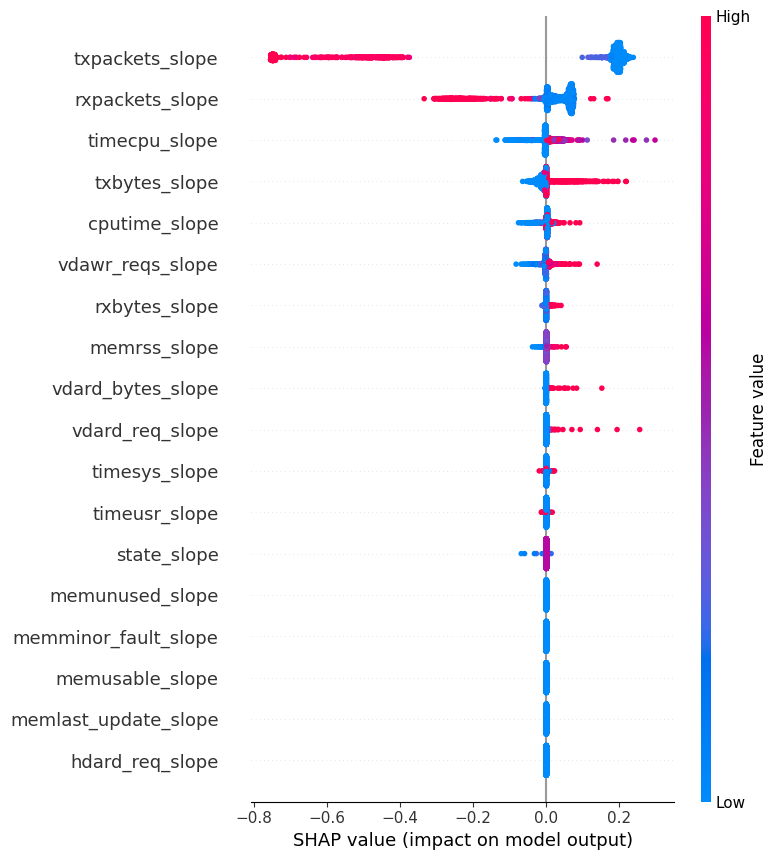

In [ ]:
# generate SHAP explanations for the entire dataset
explainer = shap.Explainer(rnn_model.predict,X_train_np)
shap_values = explainer.shap_values(X_test_np)

shap.initjs()

# Step 6: Visualize the explanations
shap.summary_plot(shap_values, X_test_np, feature_names=feature_names)

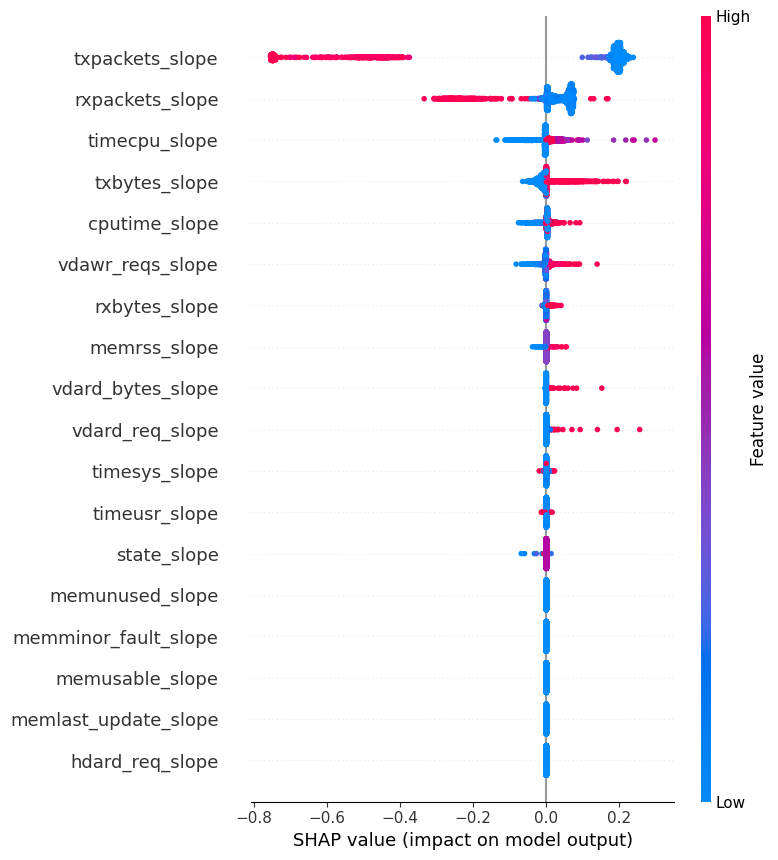

In [ ]:
# Step 6: Visualize the explanations
shap.summary_plot(shap_values, X_test_np, feature_names=feature_names)

In [ ]:
# Step 5: Use SHAP for explanations
explainer1 = shap.KernelExplainer(rnn_model.predict, X_train_np)

NameError: name 'shap' is not defined

In [ ]:
# Inserting a 367th instance for explanation
instance_index = 367  # Choose an index from X_test_scaled
instance = X_test_np[instance_index]
shap_values = explainer1.shap_values(instance)

499835/499835 [==============================] - 1474s 3ms/step


In [ ]:
shap_values.reshape(-1)

array([-0.0034117 ,  0.        , -0.00861945,  0.19463752,  0.08872788,
        0.        ,  0.00485179,  0.00176216, -0.07133612,  0.        ,
        0.        ,  0.00103429,  0.        , -0.00440994,  0.00155296,
       -0.00321422,  0.03792841,  0.00116318])

In [ ]:
instance = instance.reshape(1, -1)

In [ ]:
shap.initjs()
shap.force_plot(explainer1.expected_value, shap_values.reshape(-1), feature_names=feature_names )

In [ ]:
# Step 5: Use SHAP for explanations
explainer1 = shap.KernelExplainer(rnn_model.predict, X_train_np)

240/240 [==============================] - 1s 2ms/step


In [ ]:
# Inserting a 49th instance for explanation
instance_index = 49  # Choose an index from X_test_scaled
instance = X_test_np[instance_index]
shap_values = explainer1.shap_values(instance)

499835/499835 [==============================] - 1317s 3ms/step


In [ ]:
shap_values.reshape(-1)

array([-2.38089111e-03,  9.38532315e-03, -4.28573483e-03,  2.17057544e-01,
       -1.48885960e-02,  4.35631170e-03,  1.35320475e-02, -3.34233921e-04,
        1.93280879e-02, -1.10440623e-03,  5.97288941e-05,  0.00000000e+00,
        0.00000000e+00, -1.24345248e-02,  0.00000000e+00,  0.00000000e+00,
        1.20224315e-02,  0.00000000e+00])

In [ ]:
instance = instance.reshape(1, -1)

In [ ]:
shap.initjs()
shap.force_plot(explainer1.expected_value, shap_values.reshape(-1), feature_names=feature_names )

In [ ]:
# Inserting a 45th instance for explanation
instance_index = 45  # Choose an index from X_test_scaled
instance = X_test_np[instance_index]
shap_values = explainer1.shap_values(instance)

499835/499835 [==============================] - 2292s 5ms/step


In [ ]:
shap_values.reshape(-1)

array([ 0.        ,  0.        , -0.00143251, -0.69641079,  0.00916732,
        0.00221772,  0.        ,  0.        , -0.03258599,  0.        ,
        0.        ,  0.        , -0.00136237, -0.00380313, -0.00210647,
        0.00208468, -0.03487339,  0.        ])

In [ ]:
instance = instance.reshape(1, -1)

In [ ]:
shap.initjs()
shap.force_plot(explainer1.expected_value, shap_values.reshape(-1), feature_names=feature_names )